In [1]:
# importing the needed packages

import pandas as pd
import numpy as np

rng = np.random.RandomState(seed = 7)

import datetime as dt

import matplotlib.pyplot as plt
from matplotlib import ticker, cm
import seaborn as sns
from pandas.plotting import parallel_coordinates
import missingno as msno
import plotly.express as px
import networkx as nx

from scipy.stats import zscore

from math import ceil
from collections import Counter

# from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler, 
from sklearn.preprocessing import OneHotEncoder

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

import warnings
warnings.filterwarnings("ignore")

<div class="alert alert-block alert-info">

# Market Basket Analysis
    
</div>

- Ana Sofia Mendes, number: 20220687
- Ana Sofia Mendonça, number: 20220678
- Beatriz Sousa, number: 20220674
- Sofia Vieira, number: 20220676
- Vasco Fontoura, number: 20220556

**GOALS**: 
1. Do a thorough data exploratory analysis to try to find interesting 
patterns.
2. Take advantage of data visualization to demonstrate any relevant 
patterns.
3. Do a market basket analysis to try to answer the business 
questions. 
4. Based on the patterns and insights obtained, present 
recommendations aligned with C’s objectives.

Some code was adapted from our projects for Data Mining and Machine Learning Curricular Units.

<a id = "toc"></a>

1. [Data Understanding](#data-understanding)
2. [Data Preparation](#data-preparation)
3. [Modelling](#modelling)

<a id = "data-understanding"></a>
    
## 1. Data Understanding

<a id = "understanding-index"></a>

- [1.1. Import the datasets](#import-datasets)
- [1.2. Copy the datasets](#copy-datasets)
- [1.3. Variable types](#variable-types)
- [1.4. Descriptive statistics](#descriptive-statistics)
- [1.5. Visualizations](#visualizations)
- [1.6. Incoherences](#incoherences)

[Back to TOC](#toc)

<a id = "import-datasets"></a>

### 1.1. Import the datasets

[Back to Data Understanding](#understanding-index)

In [2]:
df = pd.read_csv('Case2_AsianRestaurant_Cyprus_2018.txt', sep = ';')
df

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince
0,TKD0320000012018,1/2 DUCK,STARTERS,1.0,"27,10",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
1,TKD0320000012018,SPRING ROLL,STARTERS,8.0,"17,60",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
2,TKD0320000012018,SWEET SOUR CHICKEN,MEAT,2.0,"20,20",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
3,TKD0320000012018,LEMON CHICKEN,MEAT,1.0,"10,10",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
4,TKD0320000012018,BEEF BBS,SIZZLING,1.0,"12,60",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
84104,TK0110054642018,SWEET SOUR CHICKEN,MEAT,1.0,"12,60",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN
84105,TK0110054642018,COKE,DRINKS,1.0,"3,00",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN
84106,TK0110054642018,EGG FRIED RICE,RICE,1.0,"6,90",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN
84107,TK0110054642018,TOFFEE BANANA COMPLEMENTARY,DESSERT,1.0,"0,00",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN


<a id = "copy-datasets"></a>

### 1.2. Copy the datasets

[Back to Data Understanding](#understanding-index)

A copy of the original dataset should be created, because during the preprocessing stage we usually try different things, so we should have a copy before doing something wrong with the original data.

In [3]:
df_original = df.copy()

Firstly, we start by checking the shape of our dataset.

In [4]:
df.shape

(84109, 12)

<a id = "variable-types"></a>

### 1.3. Variable types

[Back to Data Understanding](#understanding-index)

In [5]:
# checking the data types of the variables of the dataset and if there are any missing values

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84109 entries, 0 to 84108
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   DocNumber           84109 non-null  object 
 1   ProductDesignation  84109 non-null  object 
 2   ProductFamily       84109 non-null  object 
 3   Qty                 84109 non-null  float64
 4   TotalAmount         84109 non-null  object 
 5   InvoiceDateHour     84109 non-null  object 
 6   EmployeeID          84109 non-null  int64  
 7   IsDelivery          84109 non-null  int64  
 8   Pax                 84109 non-null  int64  
 9   CustomerID          84109 non-null  int64  
 10  CustomerCity        31248 non-null  object 
 11  CustomerSince       29142 non-null  object 
dtypes: float64(1), int64(4), object(7)
memory usage: 7.7+ MB


From this information, it can be seen that variables `CustomerCity` and `CustomerSince` have missing values. Regarding the type of the variables, it is possible to see an issue with `TotalAmount`, since it should be stored as float, and with the variables that represent dates (`InvoiceDateHour` and `CustomerSince`), since they are represented as text.

<a id = "descriptive-statistics"></a>

### 1.4. Descriptive statistics

[Back to Data Understanding](#understanding-index)

In [6]:
# getting the main descriptive statistics only for the numerical variables

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Qty,84109.0,1.261256,0.923780,1.0,1.0,1.0,1.0,53.0
EmployeeID,84109.0,3.591221,3.682017,2.0,2.0,2.0,5.0,27.0
IsDelivery,84109.0,0.371518,0.483213,0.0,0.0,0.0,1.0,1.0
Pax,84109.0,3.300800,3.693792,0.0,1.0,2.0,4.0,200.0
CustomerID,84109.0,12633.065760,21952.076038,0.0,0.0,0.0,16429.0,69101.0


Regarding this information, it can be seen that variable `Pax` has an outlier, since there is a huge difference between the third quartile and the maximum value. 

The fact that the minimum value of `EmployeeID` is 2, is quite strange, but we can assume that the employee with the ID number 1 is the owner of the restaurant or even was fired, therefore it does not appear anymore in the database. 

`CustomerID` also seems to have problems because of the differences between the median and the third quartile, and also between the third quartile and the maximum value.

In [7]:
# getting the main descriptive statistics for the remaining cathegorical variables

df.describe(include = ['O']).T

,count,unique,top,freq
DocNumber,84109,11147,TK0110053522018,46
ProductDesignation,84109,255,MINERAL WATER 1.5LT,7061
ProductFamily,84109,27,STARTERS,14148
TotalAmount,84109,374,"3,00",9733
InvoiceDateHour,84109,11146,2018-12-24 22:59:54.000,46
CustomerCity,31248,17,EGKOMI,9423
CustomerSince,29142,2109,2005-12-06 15:00:00.000,1164


Regarding the rest of the variables, it can be seen that the invoice that contains the most amount of products was the one with `DocNumber` TK0110053522018, with 46 different products sold. As for the products that is sold more times, it is mineral water, and the group of products that customers ask more for is starters. Most of the customers come from a city called Engomi.

In [8]:
# checking value counts for categorical variables

df['ProductFamily'].value_counts()

STARTERS       14148
DRINKS         11585
RICE           10720
MEAT            8561
EXTRAS          5044
SIZZLING        5028
JAP SUSHI       3900
MAIN IND        3060
WHITE WINE      2432
DESSERT         2372
SPIRITS         2067
TSANTES         1797
BREADS IND      1741
START IND       1704
SUSHI           1487
RICE IND        1424
RED WINES       1247
HOLDS           1184
SOUPS           1181
VEG IND          902
SEAFOOD          868
VEG              461
WITH             351
ROSE WINES       339
NEW SUSHI        281
SIDE IND         162
DESSERT IND       63
Name: ProductFamily, dtype: int64

In [9]:
# checking the menu (by checking the products sold)

df['ProductDesignation'].value_counts()

MINERAL WATER 1.5LT      7061
EGG FRIED RICE           4604
SPRING ROLL              4079
DELIVERY CHARGE          3892
SWEET SOUR CHICKEN       3616
                         ... 
CLASSIC ROLLS VEG           1
BABATZIM ERODIOS ROSE       1
VEUVE CLICQUOT              1
HADJIMICHALI LEFKOS         1
 NO BABY CORN               1
Name: ProductDesignation, Length: 255, dtype: int64

So, customers purchase more starters, drinks, and rice in the restaurant. It is also seen that some products are only bought one time in the entire year. This could mean that those products should not be sold (they are not worth to have in the menu). The fact that 'NO BABY CORN' has only one item sold can be explained also by the space that it has in the beggining. We should check, during the Data Preparation phase, for the presence of more spaces in other observations, or in other variables.

<a id = "visualizations"></a>

### 1.5. Visualizations

- [1.5.1. Bar plots](#bar-plots)
- [1.5.2. Histograms](#histograms)
- [1.5.3. Box plots](#box-plots)
- [1.5.4. Numerical variables relationships](#numerical-relationships)

[Back to Data Understanding](#understanding-index)

In [10]:
# defining metric and non-metric features (drop_metric are the variables that will not be included in the visualizations of categorical variables)
# the identification variables (such as, DocNumber, EmployeeID, and CustomerID) will not be plotted as they do not provide useful information

metric_features = ['Qty', 'TotalAmount', 'Pax']
drop_metric = metric_features + ['DocNumber', 'EmployeeID', 'CustomerID', 'InvoiceDateHour', 'CustomerSince']
non_metric_features = df.columns.drop(drop_metric).to_list()

<a id = "bar-plots"></a>

#### 1.5.1. Bar plots

In [11]:
def plot_bar(data, nmf, lines, fig_size):
    """
    code adapted from https://stackoverflow.com/questions/31749448/how-to-add-percentages-on-top-of-grouped-bars

    inputs:
    - data: pandas DataFrame containing the data to be plotted.
    - nmf: list of strings with the names of the non-metric features in the input data to be plotted.
    - lines: integer representing the number of rows in the plot grid.
    - fig_size: a tuple of two integers representing the size of the plot figure.

    this function creates a grid of bar plots for each categorical variable specified in nmf using the input data. 
    if the number of unique values in the categorical variable is less than 10, the function also annotates each bar with the percentage of data instances that have that value. 
    """
    
    # preparing the figure by create individual axes where each box plot will be placed
    fig, axes = plt.subplots(lines, ceil(len(nmf) / lines), figsize = fig_size, constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associating each box plot:
    for ax, feat in zip(axes.flatten(), nmf):
        graph = sns.countplot(x = data[feat], color = '#8d99ae', ax = ax, order = data[feat].value_counts(ascending = True).index)
        ax.tick_params(axis = 'x', rotation = 90, size = 10)
        ax.set_ylabel('')
        
        if data[feat].unique().shape[0] < 10:
            for p in graph.patches:
                percentage = '{:.1f}%'.format(100 * p.get_height() / float(len(data)))
                x = p.get_x() + p.get_width() / 2 - 0.20
                y = p.get_y() + p.get_height()
                graph.annotate(percentage, (x, y), size = 10)

    fig.suptitle('Bar plots for all categorical variables', fontsize = 12)

    # showing the plot
    plt.show()

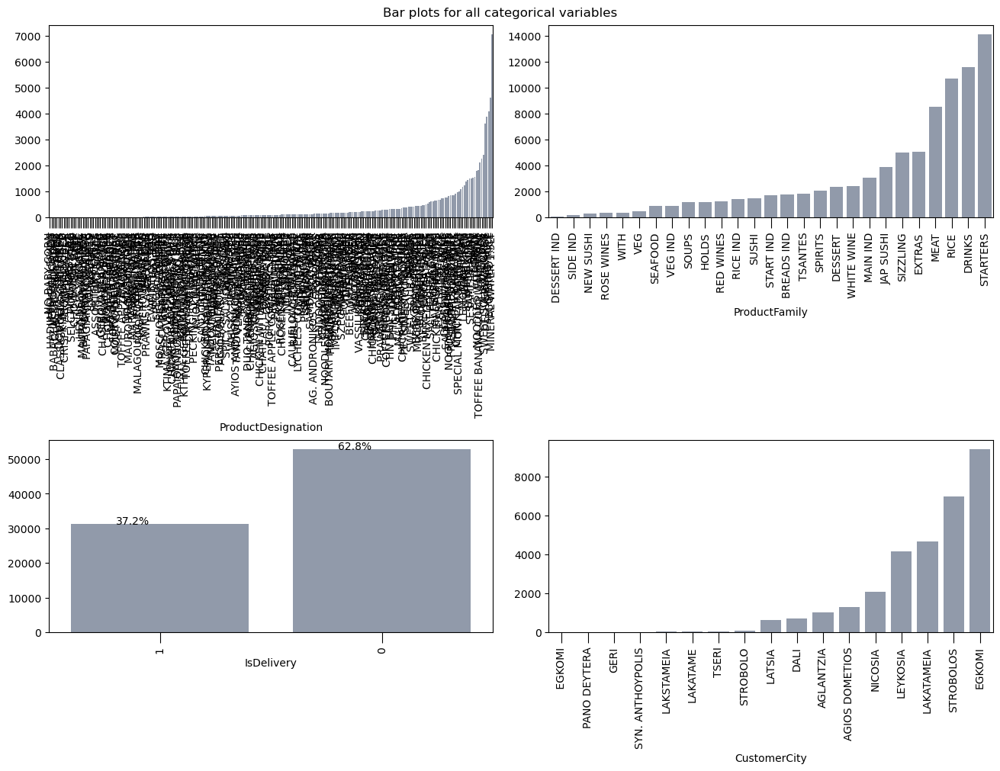

In [12]:
# plotting bar charts for categorical features

plot_bar(df, non_metric_features, 2, (13, 10))

As it can be seen again, the majority of the prodcts sold are starters, and most of the customers prefer to eat at the restaurant. It is hard to understand the plot of `ProductDesignation` because of the high number of unique categories in these variables. 

In [13]:
# removing this variable from the list to visualization since it will not be useful to plot

non_metric_features.remove('ProductDesignation')

In [14]:
def plot_families_bar(data, groups_variable, feature, lines, fig_size):
    """
    inputs:
    - data: pandas dataframe that contains the data to be plotted.
    - groups_variable: string that represents the categorical variable used for grouping the data.
    - feature:string that represents the categorical variable to be plotted.
    - lines: integer that represents the number of rows of plots to create in the output figure.
    - fig_size: tuple that represents the size of the output figure.

    this function is used to create a bar plot of a categorical variable by grouping it with another categorical variable.
    for each bar plot the function filters the data based on the current group and creates a countplot with the categorical variable indicated as 'feature'.
    """

    # computing the unique values for the feature that we want to group by
    groups = data[groups_variable].unique().tolist()

    # preparing the figure by create individual axes where each box plot will be placed
    fig, axes = plt.subplots(lines, ceil(len(groups) / lines), figsize = fig_size, constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associating each box plot:
    for ax, group in zip(axes.flatten(), groups):

        # filtering the dataframe
        filtered_data = data[data[groups_variable] == group]

        graph = sns.countplot(x = filtered_data[feature], color = '#8d99ae', ax = ax, order = filtered_data[feature].value_counts(ascending = True).index)
        ax.tick_params(axis = 'x', rotation = 90)
        ax.set_xlabel(group)
        ax.set_ylabel('')
        
        if filtered_data[feature].unique().shape[0] < 12:
            for p in graph.patches:
                percentage = '{:.1f}%'.format(100 * p.get_height() / float(len(data)))
                x = p.get_x() + p.get_width() / 2 - 0.20
                y = p.get_y() + p.get_height()
                graph.annotate(percentage, (x, y), size = 8)

    fig.suptitle('Bar plots of ' + str(feature) + ' by ' + str(groups_variable), fontsize = 12)

    # showing the plot
    plt.show()

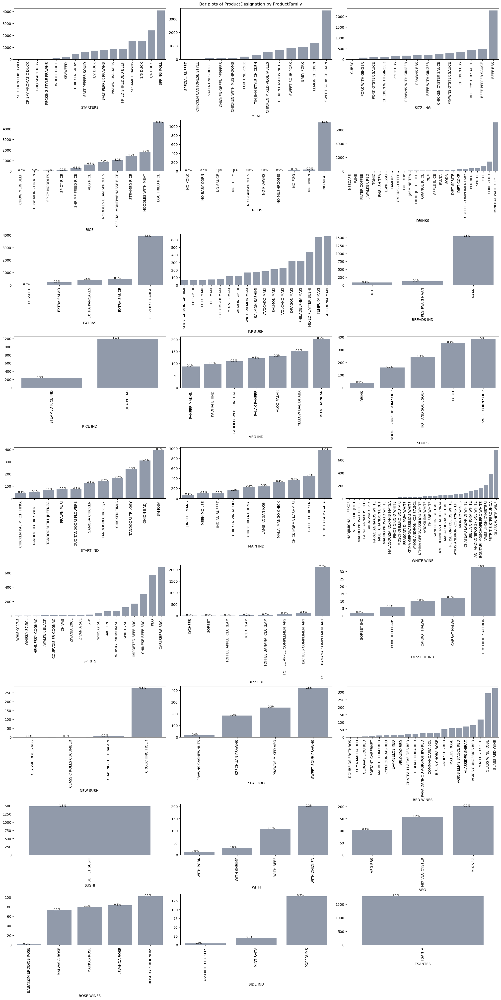

In [15]:
# getting plots for each product family and counting the frequencies for each product designation

plot_families_bar(df, 'ProductFamily', 'ProductDesignation', 9, (20, 40))

With these plots we can see what are the most requested products, as well as the ones that are not sold very often, therefore we can overcome the problem with the high number of categories plotted. Some problems can be noticed, like the 'Wine' that appears in the 'DRINKS' family (and is not discriminated in the proper categories for wine products). What we can do in the Data Preparation phase is to join the wine categories into one, since only the product designations will be important for our analysis, and append this product also in that category! The same happens in the 'Dessert' product that appears in the 'EXTRA' family (and is not discriminated in the proper category of desserts). 

Also, it is possible to notice two products that are related to the delivery of the food by the restaurant, and they are 'Delivery Charge' and 'Tsanta', which are bags. These products should only be sold to customers who order food for delivery and not for dine-in.

Also, looking at the changes that people do to the meals (that can be identified as the products of families 'WITH' and 'HOLDS'), we can conclude that 2% of the products sold in the dataset are fot changes, which could be considered quite a lot. The number of changes to the meals should be calculated in terms of proportion to the number of invoices, to have a better insight of how can we change the menu to better accomodate the requests. 

So, regarding the product 'Mineral Water 1.5lt' found in the family 'Drinks', we should remove it from the analysis, since water is a basic necessity in a restaurant, and its purchase is not indicative of any unique or interesting customer behaviour. Including water in the analysis may skew the results, so, by excluding water from the dataset, we can focus on identifying meaningful associations between other products. In data preparation, we should address this problem.

<a id = "histograms"></a>

#### 1.5.2. Histograms

Ploting all numeric variables' histograms in one figure, to see some insights.

In [16]:
def plot_histogram(data, mf, lines):
    """
    inputs:
    - data: pandas dataframe containing numerical features
    - mf: list of the names of the numerical features to plot histograms for
    - lines: integer that is the number of lines to display the histograms

    this function generates a plot of histograms for each numerical feature in the input dataframe.
    """
    
    # preparing the figure by creating individual axes where each histogram will be placed
    fig, axes = plt.subplots(lines, ceil(len(mf) / lines), figsize = (15, 6), constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associate each histogram:
    for ax, feat in zip(axes.flatten(), mf):
        ax.hist(data[feat], bins = 20, color = '#8d99ae')
        ax.set_xlabel(feat, fontsize = 10)

    fig.suptitle('Histograms with 20 bins for all numeric variables', fontsize = 12)

    # showing the plot
    plt.show()

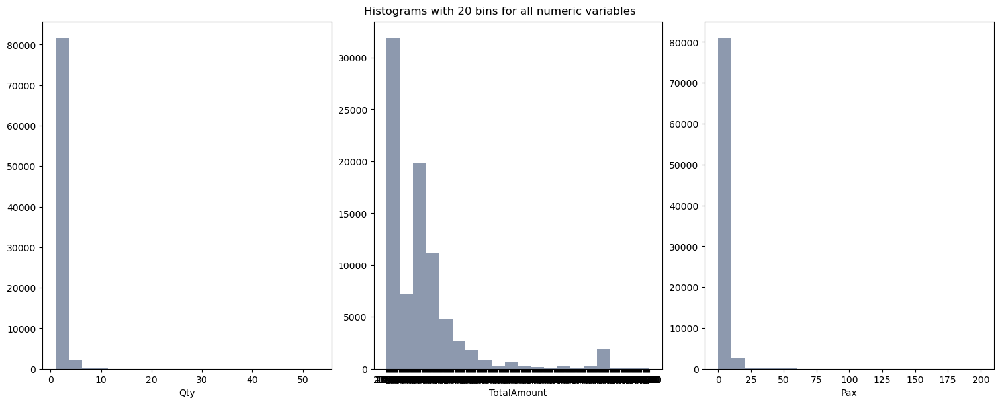

In [17]:
# plotting histograms for numeric variables

plot_histogram(df, metric_features, 1)

Regarding histograms, all metric variables seem to have outliers, as they have a high skewed distribution, only allowing the plots to show one or two bars. It is worth note that the x-axis of `TotalAmount` looks like that because this variable still has its datatype as object, and not as float as it should be. 

<a id = "box-plots"></a>

#### 1.5.3. Box plots

Doing the same with box-plots for metric features.

In [18]:
def plot_box(data, mf, lines):
    """
    inputs:
    - data: pandas dataframe that contains the variables to be plotted.
    - mf: list of the names of the numeric variables to be plotted.
    - lines: number of rows in the plot grid, which determines the number of plots per row.

    creates a set of boxplots for a given set of numeric variables in a Pandas dataframe.
    """
    
    # preparing the figure by creating individual axes where each box-plot will be placed
    fig, axes = plt.subplots(lines, ceil(len(mf) / lines), figsize = (10, 4), constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associate each box-plot:
    for ax, feat in zip(axes.flatten(), mf):
        sns.boxplot(x = data[feat], ax = ax, color = '#8d99ae', orient = 'h')
        
    fig.suptitle('Boxplots of all numeric variables', fontsize = 12)

    # showing the plot
    plt.show()

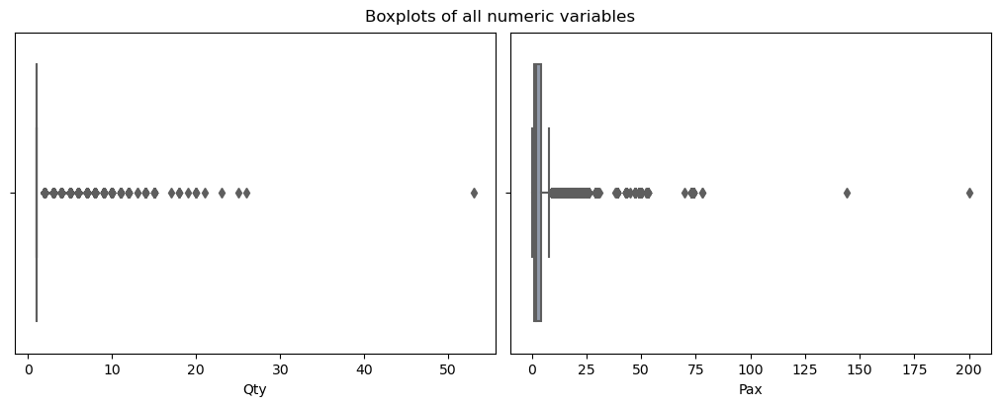

In [19]:
# plotting box plots for numerical variables (already stored correctly)

plot_box(df, ['Qty', 'Pax'], 1)

The same conclusions can be made, but here it is more clear about the presence of outliers.

<a id = "numerical-relationships"></a>

#### 1.5.4. Numerical variables relationships

For numerical variables, analysing the the relationship between all variables (to see some correlations, etc.).

In [20]:
def corr_matrix(data, correlation):
    """ 
    inputs:
    - data: pandas DataFrame containing numerical data.
    - correlation: string indicating the type of correlation to be calculated. Valid options are 'pearson', 'kendall', or 'spearman'.    

    this function calculates the correlation matrix based on the chosen type.
    the correlation matrix is then plotted using a heatmap, and the values in the heatmap are annotated based on a threshold of |0.5|.
    """
    
    # preparing the figure
    fig = plt.figure(figsize = (10, 8))

    # obtaining the correlation matrix, each correlation is rounded to 2 decimal cases
    corr = data.corr(correlation, numeric_only = True).round(2)

    # building annotation matrix (values above |0.5| will appear annotated in the plot)
    mask_annot = np.absolute(corr.values) >= 0.5
    annot = np.where(mask_annot, corr.values, np.full(corr.shape, ''))
    
    # generate a mask for the upper triangle
    mask_upper = np.triu(np.ones_like(corr, dtype = bool))

    # plotting heatmap of the correlation matrix
    sns.heatmap(data = corr, annot = annot, cmap = sns.diverging_palette(220, 10, as_cmap = True), fmt = 's', vmin = -1, 
                vmax = 1, center = 0, square = True, linewidths = .5, annot_kws = {'size': 7}, mask = mask_upper)

    # layout
    fig.subplots_adjust(top = 0.95)
    fig.suptitle(correlation + ' correlation matrix')

    # showing the plot
    plt.show()

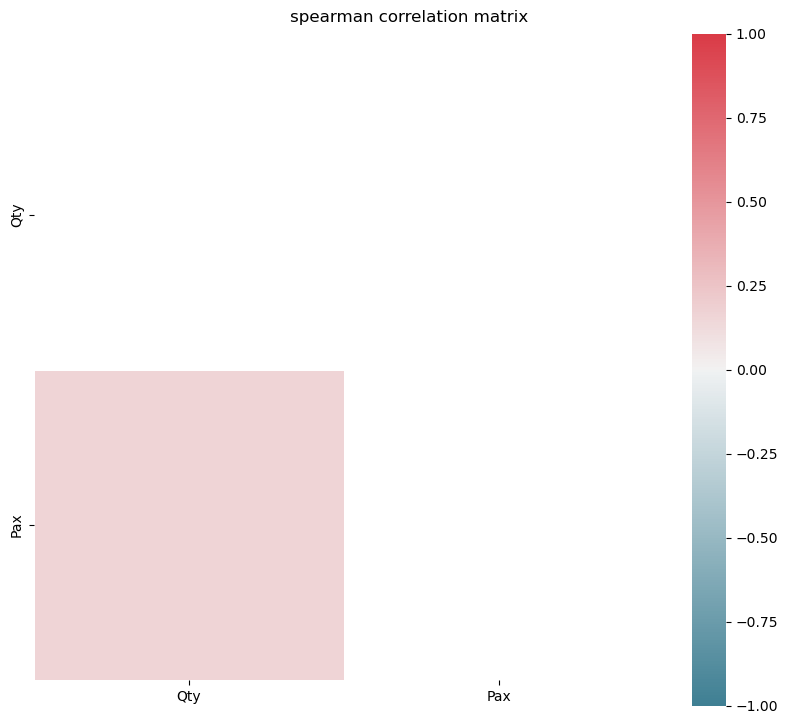

In [21]:
# plotting the correlation matrix between numeric variables

corr_matrix(df[metric_features], 'spearman')

There are not relevant correlations between the metric features in the dataset.

In [22]:
def plot_numerical_relationship(data, mf):
    """
    inputs:
    - data: pandas DataFrame containing the numerical data to be plotted.
    - mf: list of strings representing the names of the numerical columns to be plotted.  
    
    this function creates a scatter plot matrix to visualize the pairwise relationships between the numerical variables in the input data.
    the diagonal of the plot displays histograms of each variable, and the off-diagonal elements display scatter plots of each pairwise combination of variables.
    """
    
    # setting pairplot, and in the diagonal of the figure the histograms already plotted before
    chart = sns.PairGrid(data[mf])
    chart.map_upper(sns.scatterplot, color = '#8d99ae')
    chart.map_lower(sns.scatterplot, color = '#8d99ae')
    chart.map_diag(sns.kdeplot, color = '#8d99ae')

    # defining the layout
    plt.subplots_adjust(top = 0.95)
    plt.suptitle('Pairwise Relationship of Numerical Variables')

    # showing the plot
    plt.show()

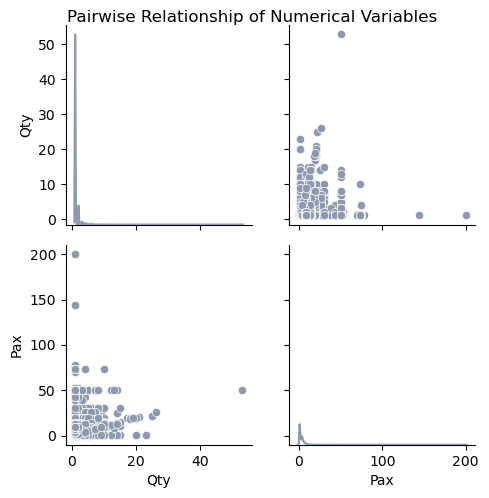

In [23]:
# plotting numerical features against each other

plot_numerical_relationship(df, metric_features)

No relevant conclusions can be made.

In [24]:
def plot_numerical_relationship_hue(data, mf, categorical_feature):
    """
    inputs:
    - data: pandas DataFrame containing the data to be plotted.
    - mf: list of strings indicating the names of the numerical features to be plotted.
    - categorical_feature: string indicating the name of the categorical feature to be used for grouping the data and adding a hue to the plot.

    this function generates a pairwise plot of the numerical features in the DataFrame. 
    the plot is grouped by a categorical feature specified by 'categorical_feature', and a hue is added to the plot to distinguish between the different categories.
    the hue parameter allows you to see if there is a relationship between the numerical features and the categorical feature.
    """

    # setting pairplot
    sns.pairplot(df[mf + [categorical_feature]], diag_kind = 'hist', hue = categorical_feature, palette = list(sns.color_palette('colorblind').as_hex())[:2])

    # layout
    plt.subplots_adjust(top = 0.95)
    plt.suptitle('Pairwise Relationship of Numerical Variables by ' + categorical_feature)

    plt.show()

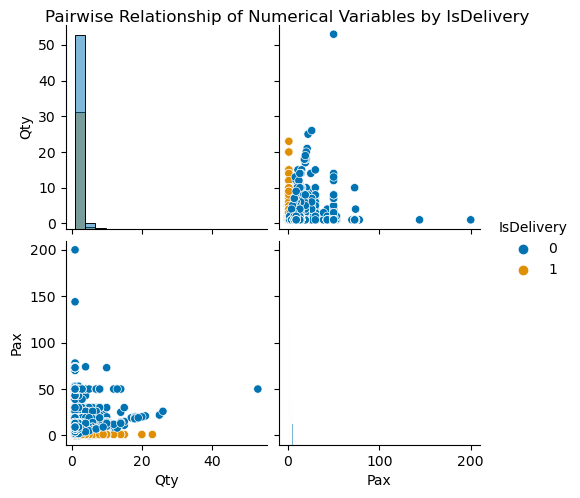

In [25]:
# plotting numerical features against each other and distinguishing between observations that were to deliver and observations that were to dine-in

plot_numerical_relationship_hue(df, metric_features, 'IsDelivery')

No relevant conclusions can be made.

<a id = "incoherences"></a>

### 1.6. Incoherences

[Back to Data Understanding](#understanding-index)

Since, a product can only be member of one only family, we can check if there are some products that are assigned to different families in different invoices.

In [26]:
# create a pandas series that counts the number of product families associated with each product designation
different_family = df.groupby(by = ['ProductDesignation'])['ProductFamily'].nunique()

# checking if there are some products that are associated with more than 1 product family
different_family[different_family > 1]

Series([], Name: ProductFamily, dtype: int64)

Also, we should check if some products in the same invoice are assigned as a delivery and others as a dine-inn.

In [27]:
# create a pandas series that counts the number of product families associated with each product designation
different_delivery = df.groupby(by = ['DocNumber'])['IsDelivery'].nunique()

# checking if there are some products that are associated with more than 1 product family
different_delivery[different_delivery > 1]

Series([], Name: IsDelivery, dtype: int64)

Also, as saw before in the visualizations, there are some products that only make sense to sell for customers that order food for delivery, like bags (Tsante) or delivery charge. So, we should check if these products were incorrectly charged for a dine-in reservation.

In [28]:
# checking if there are some invoices for dine-in that included the charge of a bag or a delivery charge

df[((df['ProductDesignation'] == 'TSANTE') | (df['ProductDesignation'] == 'DELIVERY CHARGE')) & (df['IsDelivery'] == 0)]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince


Assuming that the restaurant closes at midnight and opens at 11am, we can search for invoices that are registered in the period between these two moments. The problem of doing this right now, is that the data type for the variable `InvoiceDateHour` is object. So, we can do this search after we fix this situation.

<a id = "data-preparation"></a>
    
## 2. Data Preparation

<a id = "preparation-index"></a>

- [2.1. Missing values](#missing-values)
- [2.2. Data types](#data-types)
- [2.3. Duplicates](#duplicates)
- [2.4. Incoherences](#preparation-incoherences)
- [2.5. Outliers](#outliers)
- [2.6. New features](#new-features)
- [2.7. Summary data exploration](#summary)
- [2.8. Encoding](#encoding)

[Back to TOC](#toc)

<a id = "missing-values"></a>

### 2.1. Missing values

- [2.1.1. Delete variables](#delete)

[Back to Data Preparation](#preparation-index)

In [29]:
# creating a copy to solve the problems with missing values

df_missing = df.copy()

Checking if there are any missing values but not encoded as NaN, for example encoded as empty strings or as *'na'*.

In [30]:
# replacing other types of missing values not recognized by pandas with NaN and checking again the number of missing values

missing_values = ['n/a', 'na', '--', '', 'unknown', 'Unknown']

df_missing.replace(missing_values, np.nan, inplace = True)
df_missing.isna().sum()

DocNumber                 0
ProductDesignation        0
ProductFamily             0
Qty                       0
TotalAmount               0
InvoiceDateHour           0
EmployeeID                0
IsDelivery                0
Pax                       0
CustomerID                0
CustomerCity          52861
CustomerSince         54967
dtype: int64

In [31]:
# seeing rows with NaNs

nans_index = df_missing.isna().any(axis = 1)
df_missing[nans_index]

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID,CustomerCity,CustomerSince
0,TKD0320000012018,1/2 DUCK,STARTERS,1.0,"27,10",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
1,TKD0320000012018,SPRING ROLL,STARTERS,8.0,"17,60",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
2,TKD0320000012018,SWEET SOUR CHICKEN,MEAT,2.0,"20,20",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
3,TKD0320000012018,LEMON CHICKEN,MEAT,1.0,"10,10",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
4,TKD0320000012018,BEEF BBS,SIZZLING,1.0,"12,60",2018-01-01 19:12:12.000,2,1,1,53908,LEYKOSIA,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
84104,TK0110054642018,SWEET SOUR CHICKEN,MEAT,1.0,"12,60",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN
84105,TK0110054642018,COKE,DRINKS,1.0,"3,00",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN
84106,TK0110054642018,EGG FRIED RICE,RICE,1.0,"6,90",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN
84107,TK0110054642018,TOFFEE BANANA COMPLEMENTARY,DESSERT,1.0,"0,00",2018-12-31 22:45:17.000,2,0,9,0,NaN,NaN


It is possible to generate **visual representations of missingness in data**, to detect relationships between missing values, such as missing together with other columns, or other similar patterns.

<AxesSubplot: >

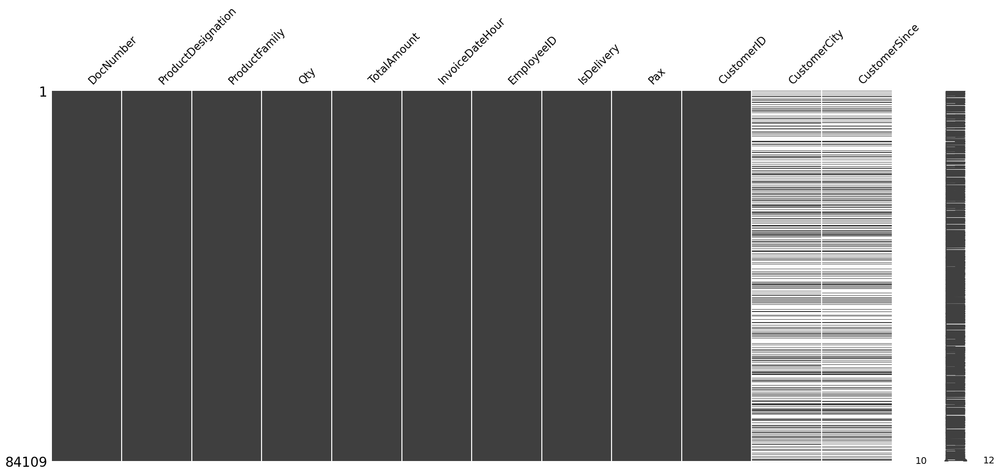

In [32]:
msno.matrix(df_missing)

In [33]:
# percentage of missing values in the two columns

missing_city = df_missing['CustomerCity'].isna().sum() / df_missing.shape[0] * 100
missing_since = df_missing['CustomerSince'].isna().sum() / df_missing.shape[0] * 100

print("Variable CustomerCity has " + str(round(missing_city, 2)) + "% of missing values, while variable CustomerSince has " + str(round(missing_since, 2)) + "% of missing values.")

Variable CustomerCity has 62.85% of missing values, while variable CustomerSince has 65.35% of missing values.


As it can be seen, the amount of missing values in these two columns is huge. If we decided to input the missing values with the median or mean (since these variables are continuous), we could introduce bias into the dataset. This is becaise when we impute the missing values, we are assuming that the missing values are missing completely at random (the missingness is not related to the values of any of the variables in the dataset), but it is possible that the missingness is related to some other variables in the dataset, so we could be introducing systematic errors. Plus, these columns to not seem to be important variables for the analysis, so deleting the columns may be a better option. The decision was based on: "If the proportion of missing values for a feature is very high, a good rule of thumb is anything in excess of 60%, then the amount of information stored in the feature is so low that it is probably a good idea to simply remove that feature"(*Kelleher, J. D., Mac Namee, B., & D’Arcy, A. (2020). Fundamentals of Machine Learning for Predictive Data Analytics, second edition: Algorithms, Worked Examples, and Case Studies. MIT Press*).

<a id = "delete"></a>

#### 2.1.1. Delete variables

In [34]:
# creating a copy to delete the missing values

df_delete = df_missing.copy()

In [35]:
# defining the list of variables to drop
drop_missing = ['CustomerCity', 'CustomerSince']

df_delete.drop(drop_missing, axis = 1, inplace = True)
df_delete

,DocNumber,ProductDesignation,ProductFamily,Qty,TotalAmount,InvoiceDateHour,EmployeeID,IsDelivery,Pax,CustomerID
0,TKD0320000012018,1/2 DUCK,STARTERS,1.0,"27,10",2018-01-01 19:12:12.000,2,1,1,53908
1,TKD0320000012018,SPRING ROLL,STARTERS,8.0,"17,60",2018-01-01 19:12:12.000,2,1,1,53908
2,TKD0320000012018,SWEET SOUR CHICKEN,MEAT,2.0,"20,20",2018-01-01 19:12:12.000,2,1,1,53908
3,TKD0320000012018,LEMON CHICKEN,MEAT,1.0,"10,10",2018-01-01 19:12:12.000,2,1,1,53908
4,TKD0320000012018,BEEF BBS,SIZZLING,1.0,"12,60",2018-01-01 19:12:12.000,2,1,1,53908
...,...,...,...,...,...,...,...,...,...,...
84104,TK0110054642018,SWEET SOUR CHICKEN,MEAT,1.0,"12,60",2018-12-31 22:45:17.000,2,0,9,0
84105,TK0110054642018,COKE,DRINKS,1.0,"3,00",2018-12-31 22:45:17.000,2,0,9,0
84106,TK0110054642018,EGG FRIED RICE,RICE,1.0,"6,90",2018-12-31 22:45:17.000,2,0,9,0
84107,TK0110054642018,TOFFEE BANANA COMPLEMENTARY,DESSERT,1.0,"0,00",2018-12-31 22:45:17.000,2,0,9,0


In [36]:
# checking if there are still missing values

df_delete.isna().sum()

DocNumber             0
ProductDesignation    0
ProductFamily         0
Qty                   0
TotalAmount           0
InvoiceDateHour       0
EmployeeID            0
IsDelivery            0
Pax                   0
CustomerID            0
dtype: int64

In [37]:
# keeping the dataframe without those columns
df = df_delete.copy()

# removing these variables from the non-metric features list
non_metric_features.remove('CustomerCity')

<a id = "data-types"></a>

### 2.2. Data types

[Back to Data Preparation](#preparation-index)

In [38]:
# checking the datatypes of the variables

df.dtypes

DocNumber              object
ProductDesignation     object
ProductFamily          object
Qty                   float64
TotalAmount            object
InvoiceDateHour        object
EmployeeID              int64
IsDelivery              int64
Pax                     int64
CustomerID              int64
dtype: object

In [39]:
# converting the variable TotalAmount to be stored as float

df['TotalAmount'] = df['TotalAmount'].str.replace(',', '.').astype(float)

During the descriptive statistics analysis it was possible to notice that some variables (like `ProductDesignation`) had spaces in the start or in the end. Therefore, we should remove it to make sure that the observations are correctly stored.

In [40]:
df['ProductDesignation'] = df['ProductDesignation'].str.strip()
df['ProductDesignation'].value_counts()

MINERAL WATER 1.5LT      7061
EGG FRIED RICE           4604
SPRING ROLL              4079
DELIVERY CHARGE          3892
SWEET SOUR CHICKEN       3616
                         ... 
CLASSIC ROLLS VEG           1
BABATZIM ERODIOS ROSE       1
VEUVE CLICQUOT              1
HADJIMICHALI LEFKOS         1
NO BABY CORN                1
Name: ProductDesignation, Length: 255, dtype: int64

In [41]:
df['ProductFamily'] = df['ProductFamily'].str.strip()
df['ProductFamily'].value_counts()

STARTERS       14148
DRINKS         11585
RICE           10720
MEAT            8561
EXTRAS          5044
SIZZLING        5028
JAP SUSHI       3900
MAIN IND        3060
WHITE WINE      2432
DESSERT         2372
SPIRITS         2067
TSANTES         1797
BREADS IND      1741
START IND       1704
SUSHI           1487
RICE IND        1424
RED WINES       1247
HOLDS           1184
SOUPS           1181
VEG IND          902
SEAFOOD          868
VEG              461
WITH             351
ROSE WINES       339
NEW SUSHI        281
SIDE IND         162
DESSERT IND       63
Name: ProductFamily, dtype: int64

Also, the `InvoiceDateHour`, that stores a date and a time, should be fixed as well. This variable will be stored as a pandas datetime object to make it more convenient for working with time series data. Once the datetime object is created, we can access its components such as the year, month, day, hour, minute, and second, using the appropriate attributes such as *.year*, *.month*, *.day*, *.hour*, *.minute*, and *.second*.

In [42]:
# convert the column InvoiceDateHour to a pandas datetime object

df['InvoiceDateHour'] = pd.to_datetime(df['InvoiceDateHour'])

<a id = "duplicates"></a>

### 2.3. Duplicates

[Back to Data Preparation](#preparation-index)

In [43]:
# checking duplicate observations

df.duplicated().sum()

3923

In [44]:
# seeing the columns that are duplicated

df[df.duplicated()].T

,5,104,160,161,176,192,209,225,227,228,...,83713,83742,83798,83855,83883,84063,84065,84089,84091,84108
DocNumber,TKD0320000012018,TKD0320000162018,TK0110000022018,TK0110000022018,TK0110000042018,TKD0320000252018,TKD0320000292018,TKD0320000322018,TKD0320000322018,TKD0320000322018,...,TKD0320044182018,TKD0320044212018,TKD0320044262018,TKD0320044332018,TKD0320044352018,TK0110054612018,TK0110054612018,TK0110054632018,TK0110054632018,TK0110054642018
ProductDesignation,BEEF BBS,EGG FRIED RICE,CARLSBERG 33CL,CARLSBERG 33CL,MINERAL WATER 1.5LT,NAAN,SPICY SALMON MAKI,HOT AND SOUR SOUP,SPRING ROLL,SPRING ROLL,...,SPRING ROLL,CHICKEN WITH MUSHROOMS,SHRIMP FRIED RICE,NAAN,TSANTA,KEO,TOFFEE BANANA COMPLEMENTARY,PETRITIS KYPEROUNDA,MINERAL WATER 1.5LT,TOFFEE BANANA COMPLEMENTARY
ProductFamily,SIZZLING,RICE,SPIRITS,SPIRITS,DRINKS,BREADS IND,JAP SUSHI,SOUPS,STARTERS,STARTERS,...,STARTERS,MEAT,RICE,BREADS IND,TSANTES,SPIRITS,DESSERT,WHITE WINE,DRINKS,DESSERT
Qty,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
TotalAmount,12.6,5.5,3.4,3.4,3.0,3.2,8.1,4.8,2.2,2.2,...,2.2,9.6,6.7,3.2,0.06,3.0,0.0,20.5,3.0,0.0
InvoiceDateHour,2018-01-01 19:12:12,2018-01-01 21:06:03,2018-01-01 21:53:15,2018-01-01 21:53:15,2018-01-01 22:27:34,2018-01-02 19:22:58,2018-01-02 19:55:04,2018-01-02 20:05:34,2018-01-02 20:05:34,2018-01-02 20:05:34,...,2018-12-31 19:25:22,2018-12-31 19:36:25,2018-12-31 19:40:12,2018-12-31 19:47:21,2018-12-31 20:00:44,2018-12-31 22:33:01,2018-12-31 22:33:01,2018-12-31 22:43:59,2018-12-31 22:43:59,2018-12-31 22:45:17
EmployeeID,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
IsDelivery,1,1,0,0,0,1,1,1,1,1,...,1,1,1,1,1,0,0,0,0,0
Pax,1,1,8,8,4,1,1,1,1,1,...,1,1,1,1,1,7,7,7,7,9
CustomerID,53908,45329,0,0,0,45121,30887,2546,2546,2546,...,9022,669,59878,59604,45008,0,0,0,0,0


These duplicates can represent errors in the formatting of the invoice itself. Instead of registering each product just one time and assigning the quantity variable to the number of products (for example 2), the employee registered the same product twice, with the quantity for each product as 1. Therefore, this information should be kept, so the values will be combined into only one row.

In [45]:
# dictionary to map each function to each column
aggregation_functions = {'Qty': 'sum',
                         'TotalAmount': 'sum'}

# aggregating the observations using the functions above
df_new = df.groupby(['DocNumber', 'ProductDesignation', 'ProductFamily', 'EmployeeID', 'IsDelivery', 'Pax', 'CustomerID', 'InvoiceDateHour'], as_index = False).aggregate(aggregation_functions)
df_new

,DocNumber,ProductDesignation,ProductFamily,EmployeeID,IsDelivery,Pax,CustomerID,InvoiceDateHour,Qty,TotalAmount
0,TK0110000012018,BOUTARI MOSCHOFILERO WHITE,WHITE WINE,2,0,2,0,2018-01-01 21:47:27,1.0,26.9
1,TK0110000012018,EGG FRIED RICE,RICE,2,0,2,0,2018-01-01 21:47:27,1.0,6.9
2,TK0110000012018,JIRA PULAO,RICE IND,2,0,2,0,2018-01-01 21:47:27,1.0,6.9
3,TK0110000012018,LAMB ROGAN JOSH,MAIN IND,2,0,2,0,2018-01-01 21:47:27,1.0,14.6
4,TK0110000012018,MINERAL WATER 1.5LT,DRINKS,2,0,2,0,2018-01-01 21:47:27,1.0,3.0
...,...,...,...,...,...,...,...,...,...,...
79334,TKD0320044522018,SWEET SOUR CHICKEN,MEAT,2,1,1,33349,2018-12-31 21:55:18,1.0,10.1
79335,TKD0320044532018,ALOO PALAK,VEG IND,2,1,1,34071,2018-12-31 21:55:41,1.0,7.0
79336,TKD0320044532018,DELIVERY CHARGE,EXTRAS,2,1,1,34071,2018-12-31 21:55:41,1.0,1.7
79337,TKD0320044532018,NAAN,BREADS IND,2,1,1,34071,2018-12-31 21:55:41,3.0,9.6


In [46]:
# keeping the new dataset

df = df_new.copy()

<a id = "preparation-incoherences"></a>

### 2.4. Incoherences

[Back to Data Preparation](#preparation-index)

There were no incoherences found during the data understanding phase, but as mentioned before, we will check if there are invoices that were issued in inappropriate hours (when the restaurant is closed).

In [47]:
# defining the start and end of the interval we want to check
start = pd.to_datetime('01:00:00', format='%H:%M:%S').time()
end = pd.to_datetime('10:00:00', format='%H:%M:%S').time()

# checking if there are observations
df[(df['InvoiceDateHour'].dt.time >= start) & (df['InvoiceDateHour'].dt.time <= end)]

,DocNumber,ProductDesignation,ProductFamily,EmployeeID,IsDelivery,Pax,CustomerID,InvoiceDateHour,Qty,TotalAmount


Also, the problem with the Wines identified before should be solved. For that, we will merge all the Wines' families together in one called 'WINE', and add the product that was missclassified as DRINK.

The same logic will be applied to 'Dessert' product that is in the family 'EXTRA', and not in the 'DESSERT' family.

In [48]:
# changing the ProductFamily of Wine as mentioned above

df['ProductFamily'] = np.where((df['ProductFamily'] == 'WHITE WINE') | (df['ProductFamily'] == 'RED WINES') | (df['ProductFamily'] == 'ROSE WINES'), 'WINE', df['ProductFamily'])
df['ProductFamily'] = np.where(df['ProductDesignation'] == 'WINE', 'WINE', df['ProductFamily'])

In [49]:
# changing the ProductFamily of Dessert as mentioned above

df['ProductFamily'] = np.where(df['ProductDesignation'] == 'DESSERT', 'DESSERT', df['ProductFamily'])

<a id = "outliers"></a>

### 2.5. Outliers

- [2.5.1. IQR method](#iqr-method)
- [2.5.2. Z-score method](#zscore-method)
- [2.5.3. Manual filtering](#manual-filtering)
- [2.5.4. Combining the three methods](#combining-three-methods)

[Back to Data Preparation](#preparation-index)

Outliers are data points that are significantly different from the rest of the data in a dataset and they can impact the results of a clustering analysis because they can lead to the formation of clusters that are not representative of the underlying structure of the data. So, they should be treated. In KMeans clustering, the distance between data points is used to determine which points should be in the same cluster, and outliers can distort this distance measure. Also, these values can have a disproportionate influence on the results of a clustering analysis.

In [50]:
# creating a copy to apply the methods for outlier removal

df_outlier = df.copy()

<a id = "iqr-method"></a>

#### 2.5.1. IQR method

IQR method can be used to identify outliers, seting up a “fence” outside of the first and the third quartile. Any values that fall outside of this fence are considered outliers.

In [51]:
def IQR_method(data, mf):
    """
    inputs:
    - data: pandas DataFrame containing the data to be filtered for outliers
    - mf: list of column names in the DataFrame for which to apply the outlier detection method

    this function applies the interquartile range (IQR) method to detect outliers in a pandas DataFrame. 
    the function returns two values: 
    - a filtered DataFrame `data_filter` containing only the rows of data that are not considered outliers based on the IQR method;
    - a pandas Series `filter` containing a boolean value for each row in the original DataFrame indicating whether that row is considered an outlier based on the IQR method.
    """
    
    # calculating the quartiles and the correspondent inter quartil range
    q25 = data[mf].quantile(.25)
    q75 = data[mf].quantile(.75)
    iqr = (q75 - q25)
    
    # defining the limits to search for outliers
    upper_lim = q75 + 1.5 * iqr
    lower_lim = q25 - 1.5 * iqr
    
    # applying the calculated measures to filter the observations in our dataset and transforming the result into a pandas series
    filter = []
    for metric in mf:
        llim = lower_lim[metric]
        ulim = upper_lim[metric]
        filter.append(data[metric].between(llim, ulim, inclusive = 'both'))
    filter = pd.Series(np.all(filter, 0), index = data.index)

    # applying the filter to our dataframe
    data_filter = data[filter]

    return data_filter, filter

In [52]:
# testing our function

df_iqr, filter_iqr = IQR_method(df_outlier, metric_features)
print('Percentage of data kept after removing outliers:', np.round(df_iqr.shape[0] / df_outlier.shape[0] * 100, 4))

Percentage of data kept after removing outliers: 77.7915


This approach is problematic since it removes too much observations (around 23%).

<a id = "zscore-method"></a>

#### 2.5.2. Z-score method

Z-score method can be used to identify outliers, seting up a “fence” outside of -3\*Z-score to 3\*Z-score. Any values that fall outside of this fence are considered outliers. A Z-score is a measure of how many standard deviations a data point is from the mean of a dataset. However, this method assumes that the data are normally distributed, and if this is not true then the Z-scores may not accurately reflect the relative distances of the data points from the mean, which can be a limitation if the data is not normally distributed. The choice of 3 as the threshold for identifying outliers is the most common one, although it is arbitrary and may not be appropriate in all cases.

Code from https://stackoverflow.com/questions/49392387/python-pandas-remove-rows-with-outlying-values-keeping-all-columns

In [53]:
def zscore_method(data, mf, threshold = 3):
    """
    inputs:
    - data: pandas dataframe containing the input data
    - mf: list of strings specifying the names of the metric features to calculate z-score for
    - threshold: float specifying the maximum absolute z-score allowed for any metric feature in an observation (default = 3)

    this function calculates the z-score for the specified metric features in the input dataframe and filters out observations where any z-score exceeds a specified threshold.
    it also returns the filtered dataframe along with a boolean filter indicating which observations were kept.
    """
    
    # calculating z-score using statistics module (only calculate zscore for metric features)
    z_score = zscore(data[mf], nan_policy = 'omit')
    
    # as we have some observations with missing values that we cannot calculate their z-score, we will fill the missing data
    # with 0 (the observations will not alter our decisions)
    z_score.fillna(0, inplace = True)
    
    # keeping the observations where all zscores for all variables are greater than the threshold in absolute value
    filter = (np.abs(z_score) < threshold).all(axis = 1)
    
    # applying the filter to our dataframe
    data_filter = data[filter]
    
    return data_filter, filter

In [54]:
# testing the function

df_zscore, filter_zscore = zscore_method(df_outlier, metric_features)
print('Percentage of data kept after removing outliers:', np.round(df_zscore.shape[0] / df_outlier.shape[0] * 100, 4))

Percentage of data kept after removing outliers: 96.82


Nearly 4% of the data is removed to deal with outliers.

<a id = "manual-filtering"></a>

#### 2.5.3. Manual filtering

For this method each feature is plotted in a box-plot and we see what are the extreme values that can be considered for outlier removal. 

In [55]:
# defining a function to show an interactive box-plot for a feature (we can pass the cursor in the plot and check the 
# values and some other features)

def show_boxplot(feature):
    """ 
    inputs:
    - feature: name of the feature in the dataframe to plot.

    generates a box plot for a given feature in a pandas dataframe.
    """

    fig = px.box(df, x = df[feature], color_discrete_sequence = ['dimgrey'], template = 'plotly_white', width = 400, height = 350)
    fig.show()

In [56]:
show_boxplot('Qty')

We considered that buying 10 units of the same product on the same meal it is already considered a lot, therefore, observations with higher values will be considered as outliers. 

In [57]:
show_boxplot('TotalAmount')

Keeping in mind the previous justification, and assuming that the meals can cost up to 20€, we considered that values of `TotalAmount` above 200€ are considered to be outliers.

In [58]:
show_boxplot('Pax')

Considering the previous explanations, we decided to keep the observations that were referring to bills with 10 or less persons.

In [59]:
def manual_method(data):
    """
    inputs: 
    - data: pandas DataFrame with the data

    this function takes in a dataframe and it defines limits for each column to search for outliers (hardcoded in the function). 
    it creates a boolean filter based on these limits, and applies this filter to the input dataframe to create a filtered version.
    """
    
    # defining the limits to search for outliers
    filter = (
        (df_outlier['Qty'] <= 10)
        &
        (df_outlier['TotalAmount'] <= 100)
        &
        (df_outlier['Pax'] <= 10)
    )
    
    # applying the filter to our dataframe
    data_filter = data[filter]
    
    return data_filter, filter

In [60]:
# testing our function

df_manual, filter_manual = manual_method(df_outlier)
print('Percentage of data kept after removing outliers:', np.round(df_manual.shape[0] / df_outlier.shape[0] * 100, 4))

Percentage of data kept after removing outliers: 97.6065


As we can notice, we removed about 3% of our observations which is acceptable.

<a id = "combining-three-methods"></a>

#### 2.5.4. Combining the three methods

We can also combine the three methods that we saw above, making sure that we only delete outliers that are considered outliers simultaneously by the IQR method, Z-score method and by our manual filter.

In [61]:
# applying the filter to our dataframe

df_combination = df_outlier[(filter_iqr | filter_zscore | filter_manual)]
print('Percentage of data kept after removing outliers:', np.round(df_combination.shape[0] / df_outlier.shape[0] * 100, 4))

Percentage of data kept after removing outliers: 98.4711


When combining the three methods, we only delete 2% of the dataset, as it is more difficult to an observation to be considered an outlier since it has to satisfy the conditions for all methods. 

We will keep the manual filtering for now, and then change it if necessary to improve the performance of the clustering algorithms.

In [62]:
# saving the outliers
outliers = df[~filter_manual]

# keeping the manual method
df_outlier = df_manual.copy()

In [63]:
# saving the dataframe without outliers
df = df_outlier.copy()

# # and store the scaled version of it
# df_scaled = minmax_scaler(df, metric_features)

<a id = "new-features"></a>

### 2.6. New features

- [2.6.1. Extracting new information](#extracting-new-information)
- [2.6.2. Holidays](#holidays)
- [2.6.3. Weather](#weather)

[Back to Data Preparation](#preparation-index)

<a id = "extracting-new-information"></a>

#### 2.6.1. Extracting new information

From the variables that we have in the dataset, it is possible to create multiple new variables, in order to try to extract some useful information. For example:

- `UnitPrice`: stores the unitary price of the product, and it is calculated by dividing the total amount spent in the product by the quantity purchased.
- `WeekDay`: stores the weekday when that product was sold.
- `Meal`: stores the time of the day when that product was sold. It was considered that if the hour is less than or equal to 16, it is a lunch, otherwise, it is a dinner.

In [64]:
def new_features(data, mf, nmf):
    """
    inputs:
    - data: pandas DataFrame object representing the input data.
    - mf: list object representing a list of metric features.
    - nmf: list object representing a list of non-metric features.

    this function is used to add new features to a DataFrame and keep track of which features have been added (by updating the list of features).
    """

    # defining a dictionary with the correspondent days of the week to transform the output of weekday() method
    week_days = {0: 'Monday',
                 1: 'Tuesday',
                 2: 'Wednesday',
                 3: 'Thursday',
                 4: 'Friday',
                 5: 'Saturday',
                 6: 'Sunday'}

    data['UnitPrice'] = data['TotalAmount'] / data['Qty']
    data['WeekDay'] = data['InvoiceDateHour'].dt.weekday.replace(week_days)
    data['Meal'] = data['InvoiceDateHour'].dt.hour.apply(lambda x: 'Lunch' if x <= 16 else 'Dinner')

    # updating the list with the metric and non-metric features
    mf.append('UnitPrice')
    nmf.append('WeekDay')
    nmf.append('Meal')

    return data, mf, nmf

In [65]:
# creating the new features in our dataset
df, metric_features, non_metric_features = new_features(df, metric_features, non_metric_features)

# # and updating our scaled version of the dataset with the new features
# df_scaled = minmax_scaler(df, metric_features)

<a id = "holidays"></a>

#### 2.6.2. Holidays

As stated in the description of the problem, the data for this project can be enriched with data from other sources that can help explaining consumption in restaurants.

So, a new variable `IsHoliday` is going to be created, where 1 represents that the day when the invoice was made is an holiday in Cyprus, and 0 otherwise.

In [66]:
print('The first day in the dataset is ' + str(df['InvoiceDateHour'].dt.date.min()) + ', and the last one is ' + str(df['InvoiceDateHour'].dt.date.max()))

The first day in the dataset is 2018-01-01, and the last one is 2018-12-31


From the information above, we see that the data that we have is referring to the year of 2018. Therefore, the holidays should be collected for the year 2018.

In [67]:
# defining the list of holidays in cyprus
# source: https://www.timeanddate.com/holidays/cyprus/2018
holidays = [pd.to_datetime("2018-01-01"), pd.to_datetime("2018-01-06"), pd.to_datetime("2018-02-19"), pd.to_datetime("2018-03-20"), pd.to_datetime("2018-03-25"), pd.to_datetime("2018-04-01"), pd.to_datetime("2018-04-06"), pd.to_datetime("2018-04-07"), pd.to_datetime("2018-04-08"), pd.to_datetime("2018-04-09"), pd.to_datetime("2018-04-10"), pd.to_datetime("2018-05-01"), pd.to_datetime("2018-05-28"), pd.to_datetime("2018-06-21"), pd.to_datetime("2018-08-15"), pd.to_datetime("2018-09-23"), pd.to_datetime("2018-10-01"), pd.to_datetime("2018-10-28"), pd.to_datetime("2018-12-22"), pd.to_datetime("2018-12-24"), pd.to_datetime("2018-12-25"), pd.to_datetime("2018-12-26"), pd.to_datetime("2018-12-31")]

# define a function that checks whether a date is a holiday
def is_holiday(holiday):
    return int(holiday in holidays)

# apply the function to the invoice date column to create a holiday variable
df['IsHoliday'] = df['InvoiceDateHour'].dt.date.apply(is_holiday)

# appending this variable to non_metric_features list
non_metric_features.append('IsHoliday')

<a id = "weather"></a>

#### 2.6.3. Weather

Also, weather conditions information can be used in this project. Therefore, from https://www.wunderground.com/history/monthly/cy/%CF%84%CF%8D%CE%BC%CE%B2%CE%BF%CF%85/LCEN, data regarding temperature, dew point, humidity, wind speed, pressure, and precipitation was collected. After that, the data will be merged to each observation in the original dataset, making sure we have information regarding the weather conditions when each product was sold.

In [68]:
# using the excel file created from the website provided
weather = pd.read_excel('WeatherConditions.xlsx', sheet_name = '2018')

# dropping the last rows that have information regarding the source of the data
weather.drop((weather.index[-3:]), inplace = True)

# changing the type of the column that has the dates, and assigning the information to another column to match the column from the original dataset
weather['InvoiceDateHour'] = pd.to_datetime(weather['Time'])

# dropping the column that is not needed anymore
weather.drop('Time', axis = 1, inplace = True)

# checking the dataframe
weather

,TemperatureMax,TemperatureAvg,TemperatureMin,DewPointMax,DewPointAvg,DewPointMin,HumidityMax,HumidityAvg,HumidityMin,WindSpeedMax,WindSpeedAvg,WindSpeedMin,PressureMax,PressureAvg,PressureMin,Precipitation,InvoiceDateHour
0,63.0,52.5,45.0,50.0,45.9,41.0,100.0,79.5,55.0,21.0,11.7,0.0,29.5,29.5,29.4,0.0,2018-01-01
1,66.0,55.1,45.0,54.0,46.7,39.0,88.0,73.8,52.0,14.0,9.0,0.0,29.6,29.5,29.5,0.0,2018-01-02
2,66.0,56.5,48.0,55.0,51.0,45.0,94.0,82.5,56.0,16.0,5.9,0.0,29.6,29.5,29.4,0.0,2018-01-03
3,63.0,54.1,48.0,52.0,47.6,46.0,100.0,80.2,55.0,16.0,7.6,0.0,29.4,29.3,29.2,0.0,2018-01-04
4,61.0,53.4,48.0,52.0,49.7,46.0,100.0,88.2,68.0,14.0,7.1,0.0,29.4,29.2,29.1,0.0,2018-01-05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,55.0,50.6,46.0,48.0,43.3,34.0,94.0,76.8,54.0,18.0,8.7,0.0,29.4,29.3,29.3,0.0,2018-12-27
361,55.0,49.0,39.0,41.0,35.9,32.0,87.0,61.9,41.0,13.0,4.8,0.0,29.6,29.6,29.4,0.0,2018-12-28
362,55.0,48.1,39.0,45.0,40.5,34.0,87.0,75.7,51.0,7.0,2.6,0.0,29.6,29.6,29.6,0.0,2018-12-29
363,55.0,49.2,45.0,48.0,44.5,41.0,93.0,84.2,72.0,13.0,5.7,0.0,29.6,29.6,29.5,0.0,2018-12-30


In [69]:
# checking the descriptive statistics for the weather dataset

weather.describe().T

,count,mean,std,min,25%,50%,75%,max
TemperatureMax,365.0,80.994521,13.352778,54.0,68.0,82.0,93.0,104.0
TemperatureAvg,365.0,69.758904,12.132103,48.1,58.5,70.7,80.6,92.0
TemperatureMin,365.0,59.356164,12.102095,0.0,50.0,61.0,70.0,81.0
DewPointMax,365.0,60.663014,8.396681,37.0,54.0,61.0,68.0,75.0
DewPointAvg,365.0,54.180000,8.363527,27.8,47.8,53.9,61.5,72.0
DewPointMin,365.0,46.068493,9.229862,0.0,41.0,46.0,52.0,66.0
HumidityMax,365.0,85.972603,9.890017,53.0,82.0,88.0,94.0,100.0
HumidityAvg,365.0,62.884658,14.345185,25.3,55.4,62.3,74.5,91.1
HumidityMin,365.0,35.490411,15.790282,0.0,24.0,33.0,48.0,82.0
WindSpeedMax,365.0,16.476712,4.220259,7.0,14.0,16.0,18.0,32.0


It can be seen that variable `Precipitation` has no variation at all (all observations have a 0 value), so it should be removed, because it does not provide any valuable information. Regarding the pressure, the variation is considered to be small, watching the standard deviation for the three variables.

As consumers, we think that what most impacts the visits to a restaurant regarding weather conditions are: temperature (consumers may be more likely to visit a restaurant during moderate temperatures), precipitation (because rainfall may discourage consumers from going out to eat), and wind speed (high wind speeds may deter consumers from visiting restaurants). Since precipitation in this case does not changes, we decided to only leave in the dataset variables regarding these informations.

In [70]:
# dropping the precipitation variable and the ones that are not useful to the analysis

weather.drop(columns = ['Precipitation', 'PressureMax', 'PressureMin', 'PressureAvg', 'DewPointMax', 'DewPointMin', 'DewPointAvg', 'HumidityMax', 'HumidityMin', 'HumidityAvg'], inplace = True)

In [71]:
# creating columns storing the dates as strings to merge the two datasets
df['ToMerge'] = df['InvoiceDateHour'].dt.date # this column will be kept, since it will be necessary to various merges (not important for the analysis tho)
weather['ToMerge'] = weather['InvoiceDateHour'].dt.date

# deleting the variable InvoiceDateHour
weather.drop(columns = 'InvoiceDateHour', inplace = True)

# merging the weather information with the previous dataset
df_with_weather = pd.merge(df, weather, on = 'ToMerge')

# updating the list with the metric features to include the new weather features
weather_variables = list(set(weather.columns.to_list()) - set(['InvoiceDateHour', 'ToMerge']))
metric_features = metric_features + weather_variables

df_with_weather

,DocNumber,ProductDesignation,ProductFamily,EmployeeID,IsDelivery,Pax,CustomerID,InvoiceDateHour,Qty,TotalAmount,...,WeekDay,Meal,IsHoliday,ToMerge,TemperatureMax,TemperatureAvg,TemperatureMin,WindSpeedMax,WindSpeedAvg,WindSpeedMin
0,TK0110000012018,BOUTARI MOSCHOFILERO WHITE,WINE,2,0,2,0,2018-01-01 21:47:27,1.0,26.90,...,Monday,Dinner,1,2018-01-01,63.0,52.5,45.0,21.0,11.7,0.0
1,TK0110000012018,EGG FRIED RICE,RICE,2,0,2,0,2018-01-01 21:47:27,1.0,6.90,...,Monday,Dinner,1,2018-01-01,63.0,52.5,45.0,21.0,11.7,0.0
2,TK0110000012018,JIRA PULAO,RICE IND,2,0,2,0,2018-01-01 21:47:27,1.0,6.90,...,Monday,Dinner,1,2018-01-01,63.0,52.5,45.0,21.0,11.7,0.0
3,TK0110000012018,LAMB ROGAN JOSH,MAIN IND,2,0,2,0,2018-01-01 21:47:27,1.0,14.60,...,Monday,Dinner,1,2018-01-01,63.0,52.5,45.0,21.0,11.7,0.0
4,TK0110000012018,MINERAL WATER 1.5LT,DRINKS,2,0,2,0,2018-01-01 21:47:27,1.0,3.00,...,Monday,Dinner,1,2018-01-01,63.0,52.5,45.0,21.0,11.7,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77435,TKD0320033682018,DELIVERY CHARGE,EXTRAS,27,1,1,68073,2018-10-04 21:26:15,1.0,1.00,...,Thursday,Dinner,0,2018-10-04,90.0,75.5,63.0,14.0,8.4,0.0
77436,TKD0320033682018,JIRA PULAO,RICE IND,27,1,1,68073,2018-10-04 21:26:15,1.0,6.20,...,Thursday,Dinner,0,2018-10-04,90.0,75.5,63.0,14.0,8.4,0.0
77437,TKD0320033682018,NOODLES WITH MEAT,RICE,27,1,1,68073,2018-10-04 21:26:15,1.0,7.90,...,Thursday,Dinner,0,2018-10-04,90.0,75.5,63.0,14.0,8.4,0.0
77438,TKD0320033682018,TANDOORI TRILOGY,START IND,27,1,1,68073,2018-10-04 21:26:15,1.0,10.70,...,Thursday,Dinner,0,2018-10-04,90.0,75.5,63.0,14.0,8.4,0.0


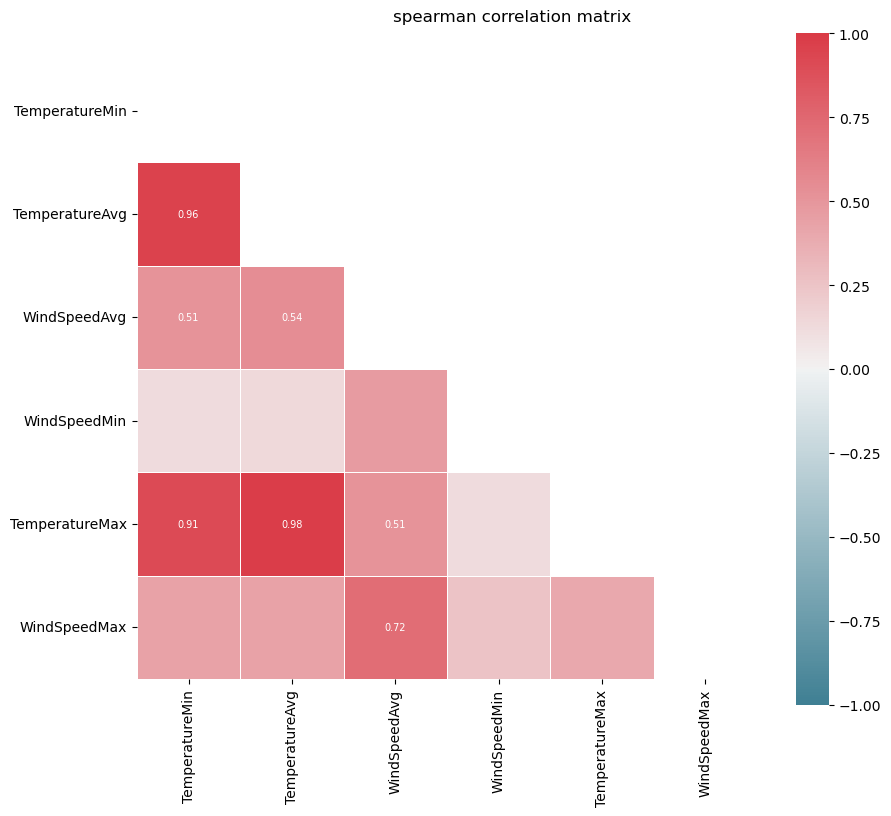

In [72]:
# correlation matrix for the metric features

corr_matrix(weather[weather_variables], 'spearman')

As it can be seen, the variables regarding the weather are highly correlated between them. Therefore, we will only keep the ones representing the average, and they will be binned to transform them into categorical variables that can be used later on the analysis.

In [73]:
def binning_variables(data):
    """
    inputs:
    - data: pandas DataFrame object representing the input data.

    this function takes in a pandas DataFrame object and applies binning to the 'TemperatureAvg' and 'WindSpeedAvg' columns. 
    the binning process involves defining specific bin boundaries and labels for each variable. 
    the function creates new columns for each variable representing the binned values of the original columns.
    """

    # creating bins for the variables
    temp_bins = [-1, 57, 69, 81, 93, 120]
    wind_bins = [-1, 5, 9, 12, 40]

    # creating labels for the bins
    temp_labels = ['Cold', 'Mild', 'Warm', 'Hot', 'Very Hot']
    wind_labels = ['Low', ' Moderate', 'High', 'Very High']

    # apply binning to the temperature columns and create a new columns for temperature
    # data['TemperatureMinBin'] = pd.cut(data['TemperatureMin'], temp_bins, labels = temp_labels)
    # data['TemperatureMaxBin'] = pd.cut(data['TemperatureMax'], temp_bins, labels = temp_labels)
    data['TemperatureAvgBin'] = pd.cut(data['TemperatureAvg'], temp_bins, labels = temp_labels)

    # apply binning to the wind speed columns and create a new columns for wind speed
    # data['WindSpeedMinBin'] = pd.cut(data['WindSpeedMin'], wind_bins, labels = wind_labels)
    # data['WindSpeedMaxBin'] = pd.cut(data['WindSpeedMax'], wind_bins, labels = wind_labels)
    data['WindSpeedAvgBin'] = pd.cut(data['WindSpeedAvg'], wind_bins, labels = wind_labels)

    # creating a list with the binned weather variables
    # binned_variables = ['TemperatureMinBin', 'TemperatureMaxBin', 'TemperatureAvgBin', 'HumidityMinBin', 'HumidityMaxBin', 'HumidityAvgBin', 'WindSpeedMinBin', 'WindSpeedMaxBin', 'WindSpeedAvgBin']
    binned_variables = ['TemperatureAvgBin', 'WindSpeedAvgBin']

    return data, binned_variables

In [74]:
# binning the weather variables using the defined function

df_with_weather, weather_variables_binned = binning_variables(df_with_weather)

In [75]:
# keeping the weather and holiday information

df = df_with_weather.copy()
# df_scaled = minmax_scaler(df, metric_features)

<a id = "summary"></a>

### 2.7. Summary data exploration

[Back to Data Preparation](#preparation-index)

We can check if the data looks the way we expect it to.

- Have we missed some outliers? 
- Are there still missing values?
- Is the data normalized?

We also will do the visualizations again and in more depth, to try to find interesting patterns on the data.

In [76]:
# getting the main descriptive statistics

df.describe(include = 'all', datetime_is_numeric = True).T

,count,unique,top,freq,mean,min,25%,50%,75%,max,std
DocNumber,77440,10998,TK0110047272018,28,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ProductDesignation,77440,254,MINERAL WATER 1.5LT,5590,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ProductFamily,77440,25,STARTERS,13617,NaN,NaN,NaN,NaN,NaN,NaN,NaN
EmployeeID,77440.0,NaN,NaN,NaN,3.596397,2.0,2.0,2.0,5.0,27.0,3.646859
IsDelivery,77440.0,NaN,NaN,NaN,0.392936,0.0,0.0,0.0,1.0,1.0,0.488406
Pax,77440.0,NaN,NaN,NaN,2.838727,0.0,1.0,2.0,4.0,10.0,2.180888
CustomerID,77440.0,NaN,NaN,NaN,13384.824793,0.0,0.0,0.0,23153.0,69101.0,22375.621642
InvoiceDateHour,77440,NaN,NaN,NaN,2018-07-04 22:33:08.431430656,2018-01-01 19:12:12,2018-03-23 22:58:16.750000128,2018-07-04 22:23:43,2018-10-13 22:12:23.249999872,2018-12-31 22:45:17,NaN
Qty,77440.0,NaN,NaN,NaN,1.287913,1.0,1.0,1.0,1.0,10.0,0.804826
TotalAmount,77440.0,NaN,NaN,NaN,9.556195,0.0,3.4,7.9,12.6,100.0,9.866677


Usually people come in groups of 3, and on average each product on the restaurant costs 10€. The product that is sold more times is mineral water (1.5lt) and the products that are sold the most are starters.

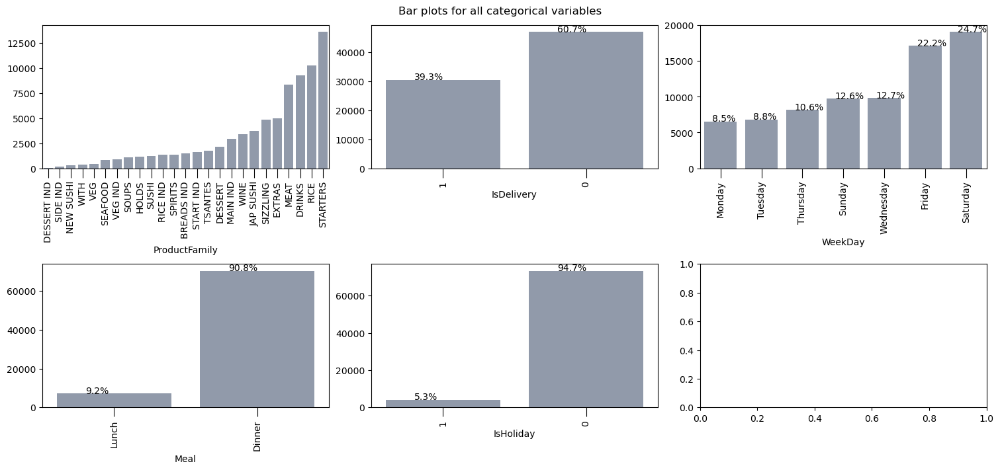

In [77]:
# bar plots for non-metric features

plot_bar(df, non_metric_features, 2, (15, 7))

As it can be seen here, the majority of the customers come for dinner (90% of the products are sold after 4pm), and the restaurant does not have a day off, as it is open everyday. Although, we can see that the majority of the products sold are during the weekends.

In [78]:
def plot_tree_map(data):
    """
    inputs:
    - data: pandas DataFrame with the data to plot

    this function generates a treemap visualization, showing the hierarchical structure of the data by using nested rectangles, where the size of each rectangle represents the quantity sold for a specific product.
    the colour of the rectangles represents the product family that each product belongs to.
    """

    cm = {
		'WINE': 'firebrick',
		'RICE': 'bisque',
		'RICE IND': 'lightgrey',
		'MAIN IND': 'darksalmon',
		'DRINKS': 'skyblue',
		'BREADS IND': 'wheat',
		'STARTERS': 'lightgreen',
		'MEAT': 'indianred',
		'SOUPS': 'mediumseagreen',
		'SIZZLING': 'silver',
		'SPIRITS': 'lightsteelblue',
		'HOLDS': 'thistle',
		'DESSERT': 'chocolate',
		'VEG IND': 'springgreen',
		'DESSERT IND': 'peru',
		'START IND': 'lavender',
		'EXTRAS': 'lightpink',
		'JAP SUSHI': 'lightsalmon',
		'NEW SUSHI': 'tomato',
		'SEAFOOD': 'aqua',
		'SUSHI': 'salmon',
		'VEG': 'forestgreen',
		'WITH': 'peachpuff',
		'SIDE IND': 'oldlace',
		'TSANTES': 'linen',
        '(?)':'lightgrey'}

    # creating a column that groups all the data points together
    data['all'] = 'all'

    # aggregation function that specifies how to group the data by ProductDesignation and count the number of occurrences of each designation
    agg_function = {'all': 'first', 'ProductFamily': 'first', 'ProductDesignation': 'first', 'Qty': 'count'}

    # grouping the data using the aggregation function
    tree = data.groupby('ProductDesignation', as_index = False)['all', 'ProductFamily', 'ProductDesignation', 'Qty'].agg(agg_function)
    
    # plotting the tree map
    fig = px.treemap(tree, path = [px.Constant('all'), 'ProductFamily', 'ProductDesignation'], values = 'Qty', color = 'ProductFamily', color_discrete_map = cm)
    fig.update_layout(margin = dict(t = 50, l = 25, r = 25, b = 25))
    fig.show()

    # removing the 'all' column that was added to the dataset earlier
    data.drop(columns = 'all', inplace = True)

In [79]:
# plot a tree map with the products and their respective families

plot_tree_map(df)

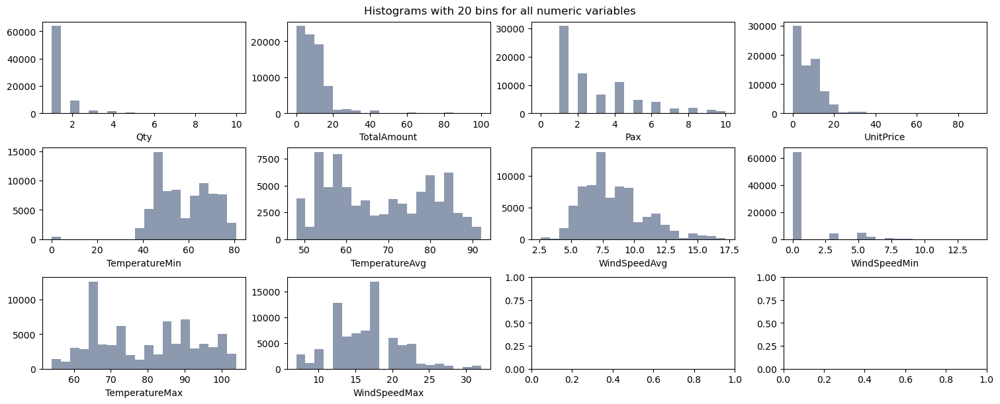

In [80]:
# histograms for metric features

plot_histogram(df, metric_features, 3)

Most of the variables related to weather information have almost a bell-shaped distribution, while `Pax` have a distribution right-skewed, with higher concentration on the lower values than on the higher values. The same happens for `Quantity` and `TotalAmount`, which is normal, as it is less common to have big groups, or persons purchasing constantly expensive items from the menu.

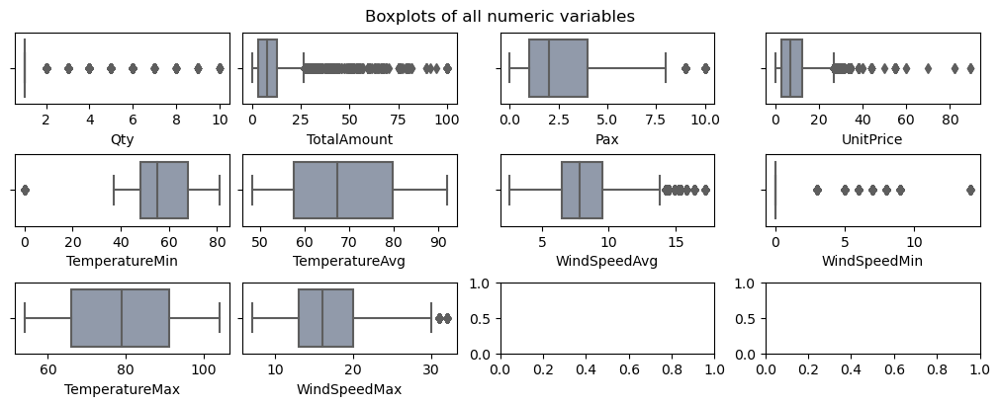

In [81]:
# box-plots for metric features

plot_box(df, metric_features, 3)

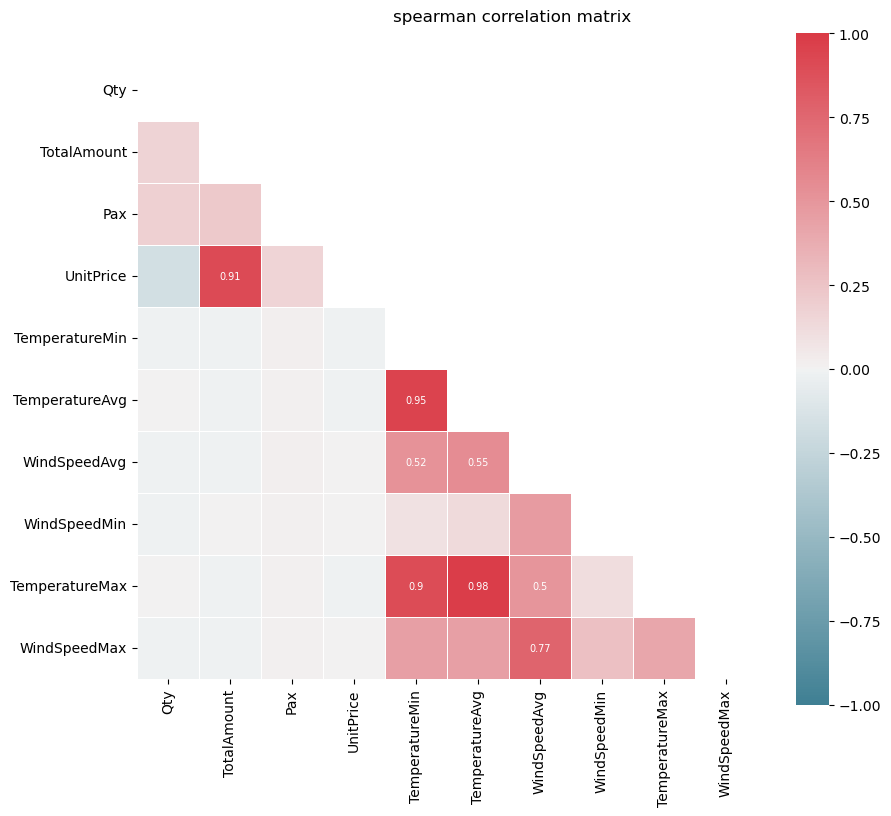

In [82]:
# correlation matrix for the metric features

corr_matrix(df[metric_features], 'spearman')

The dataset has some highly correlated features, like the three features regarding temperature, the three features regarding wind speed, the three features regarding humidity, and also `UnitPrice` and `TotalAmount`, which was expected. Since we are not using all of those features, we will simply ignore those correlations.

As stated during the data understanding phase, we noticed that the amount of customers that made alterations to meals is high. We should compare the values found with the number of invoices. 

In [83]:
# getting the number of people who changed the meals and the number of invoices in total in the dataset
number_changes = df[(df['ProductFamily'] == 'HOLDS') | (df['ProductFamily'] == 'WITH')].shape[0]
number_invoices = df['DocNumber'].nunique()

# calculating the proportion in percentage
number_changes / number_invoices * 100

13.456992180396435

13% of the invoices include at least one change in a meal. This could be a result of customers who have specific dietary requirements, like allergies or intolerances. However, since the value is considered high, it can also be a result of the menu options not being flexible enough to accommodate the customers' preferences. For example, customers may be adding ingredients to make the meal more satisfying, or removing ingredients to make it vegetarian. This can be an opportunity for the restaurant to offer more customizable options or to make changes to the current menu.

It also could be intersting to note the different patterns in the weather conditions.

In [84]:
def plot_time_series(data, lines, features):
    """
    inputs:
    - data: pandas DataFrame object representing the input data.
    - lines: integer value representing the number of rows in which the line plots will be organized in the figure.
    - features: list object representing the names of the columns for which line plots will be created.

    this function is used to plot time-series for multiple features in the same figure, allowing for easy comparison of trends over time.
    """
    
    # preparing the figure by creating individual axes where each line plot will be placed
    fig, axes = plt.subplots(lines, ceil(len(features) / lines), figsize = (15, 15), constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associate each box-plot:
    for ax, feat in zip(axes.flatten(), features):
        sns.lineplot(data = data, x = 'ToMerge', y = feat, ax = ax, color = '#8d99ae')
        ax.set_xlabel('Date')

    fig.suptitle('Line plots for time series', fontsize = 12)

    # showing the plot
    plt.show()

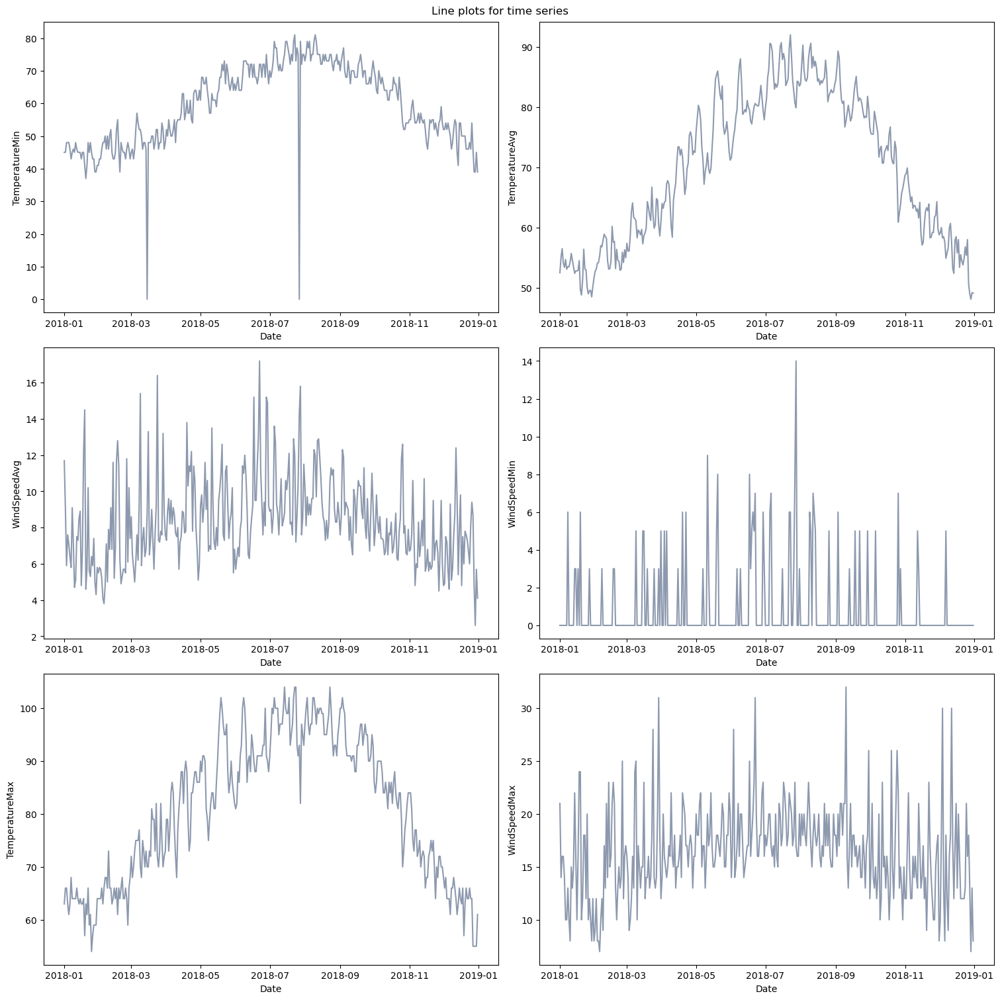

In [85]:
# plotting the weather temperatures by date

plot_time_series(weather, 3, weather_variables)

The temperature is usually higher in the summer days, as for the humidity, it tends to decrease during summer days. Regarding wind speed, it is not really noticeable a pattern, but it seems higher in summer. So, the patterns the weather presents are normal ones.

It could also be interesting to compare the number of invoices (which almost measures the number of customers that came to the restaurant) with the weather conditions. Therfore, we can create another dataframe, containing the number of invoices by date, and the weather conditions.

In [86]:
# dataframe with number of invoices by date
daily_counts = pd.DataFrame(df.groupby(['ToMerge'])['DocNumber'].count())

# merging with the weather information
daily_counts_weather = pd.merge(daily_counts, weather, on = 'ToMerge')

# merging with the holidays information
daily_counts_weather['IsHoliday'] = daily_counts_weather['ToMerge'].apply(is_holiday)

In [87]:
def plot_weather_invoices(data, lines, features):
    """
    inputs:
    - data: pandas DataFrame object representing the input data.
    - lines: integer value representing the number of rows in which the scatter plots will be organized in the figure.
    - features: list object representing the names of the weather characteristics for which scatter plots will be created.

    this function can be used to explore the relationship between weather characteristics and the number of invoices for a given time period. 
    it plots the number of invoices (x-axis) by the weather characteristics
    """
    
    # preparing the figure by creating individual axes where each line plot will be placed
    fig, axes = plt.subplots(lines, ceil(len(features) / lines), figsize = (15, 15), constrained_layout = True)

    # ploting the data
    # iterating across axes objects and associate each box-plot:
    for ax, feat in zip(axes.flatten(), features):
        sns.scatterplot(data = data, x = 'DocNumber', y = feat, ax = ax, color = '#8d99ae')
        ax.set_xlabel('Number of invoices')
        
    fig.suptitle('Number of invoices vs. weather characteristics', fontsize = 12)

    # showing the plot
    plt.show()

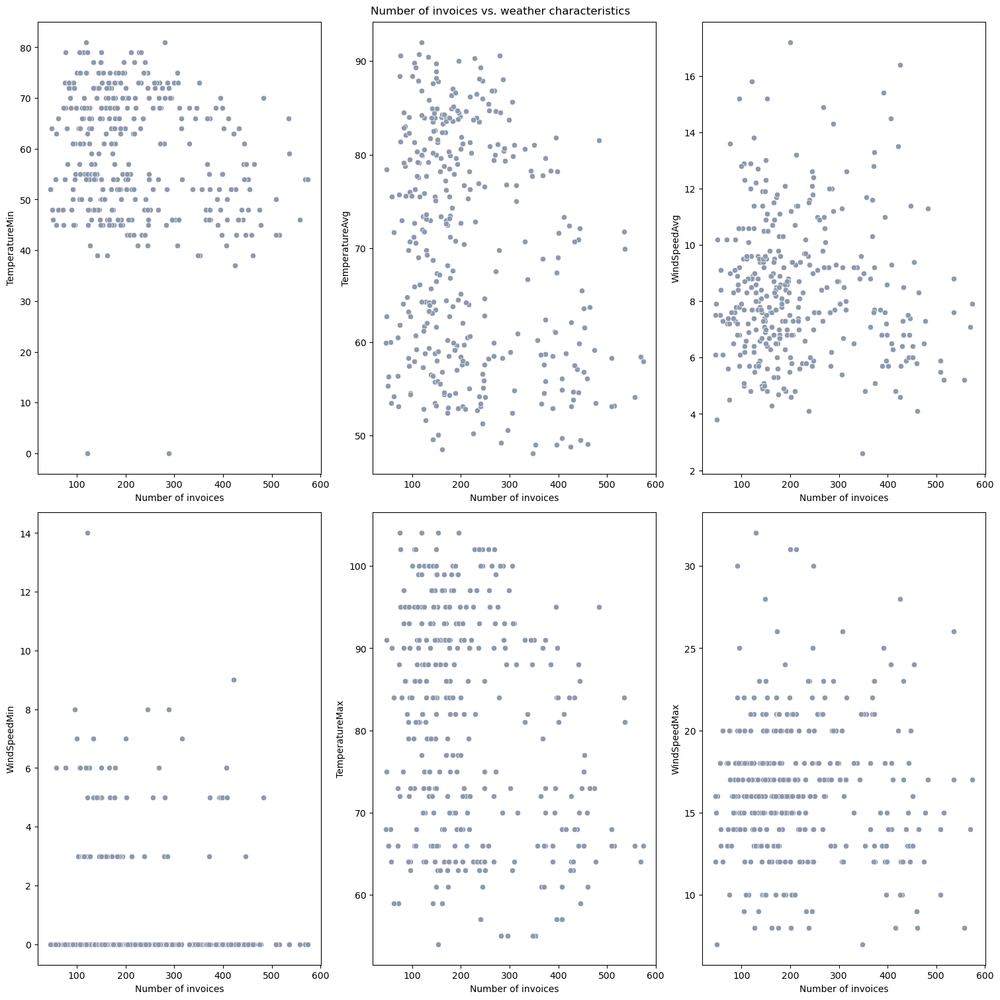

In [88]:
# plotting the relationships to see if there is any pattern

plot_weather_invoices(daily_counts_weather, 2, weather_variables)

There is not really a relationship between the number of invoices registered in the day with the weather conditions. We were expecting some patterns like, for example, the higher the temperature on the day, the more people would go out and eat at the restaurant. But, maybe, the weather conditions can influence the type of products sold. 

[Text(0.5, 1.0, 'Evolution on the number of invoices through the year')]

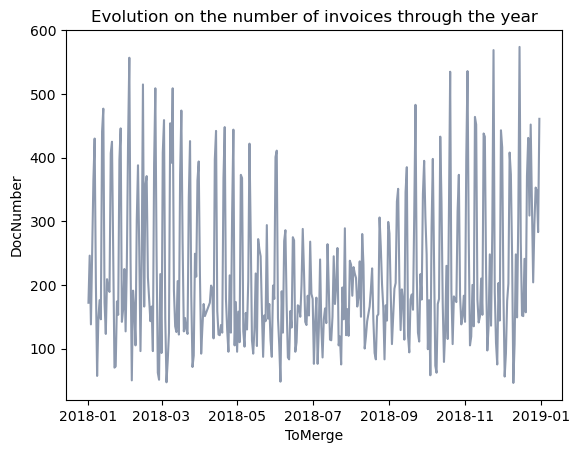

In [89]:
# plotting the number of invoices vs. the date

sns.lineplot(data = daily_counts_weather, x = 'ToMerge', y = 'DocNumber', color = '#8d99ae').set(title = 'Evolution on the number of invoices through the year')

As it can be seen, there is not really a seasonality that is noticeable trough the number of invoices issued in the year. We expected that durring the summer people would go out more often and would be more likely to eat out at restaurants, leading to increased demand. But, as we can see, this is not true for all restaurants, and it may depend on various factors such as location, type of cuisine, and the other restaurants in the area.

Furthermore, comparing sales amount per day in a restaurant can be important, since it allows the restaurant to identify trends and patterns in customer behaviour. Comparing sales on holidays versus non-holidays can be particularly useful because we can think that in holidays the restaurants tend to be busier and more lucrative.

In [90]:
# dataframe with number of invoices by date
daily_values = pd.DataFrame(df.groupby(['ToMerge'], as_index = False)['TotalAmount'].sum())

# merging with the holidays information
daily_values['IsHoliday'] = daily_values['ToMerge'].apply(is_holiday)

# setting the index to the data of the invoices
daily_values.set_index('ToMerge', inplace = True)
daily_values

,TotalAmount,IsHoliday
ToMerge,,
2018-01-01,1457.10,1
2018-01-02,2310.30,0
2018-01-03,1957.10,0
2018-01-04,2433.65,0
2018-01-05,3428.90,0
...,...,...
2018-12-27,2468.47,0
2018-12-28,2891.96,0
2018-12-29,3326.82,0


In [91]:
# average TotalAmount during the year

daily_values['TotalAmount'].mean()

2061.3696657381615

In [92]:
# average TotalAmount by whether it is a holiday or not

daily_values.groupby(by = 'IsHoliday')['TotalAmount'].mean()

IsHoliday
0    2051.769357
1    2254.505294
Name: TotalAmount, dtype: float64

Looking at the results, we can see that, on average, the restaurant is more profitable during the holidays, but we should take into consideration the fact that the restaurant is paying more to its staff during holidays. Therefore, the decision regarding staying open during these days or closing should also be based on profit margin. 

Now, we can study the differences between the clients that eat in the restaurant and the clients that purchase items for delivery.

In [93]:
def product_target(data, feature, target):
    """
    inputs:
    - data: pandas DataFrame containing the data to be analyzed.
    - feature: string indicating the categorical feature to be cross-tabulated with the target variable.
    - target: string indicating the target variable to be analyzed.

    this function creates a visualization containing two bar charts that display the frequency and proportion of the target variable for each category in the specified feature.
    the frequency bar chart displays the number of occurrences of each category in the feature, by target variable.
    while, the proportion bar chart displays the proportion of each category in the feature that beolongs to each category of the target variable.
    """
    
    # we are doing cross tabulation between the specific cathegorical variable and the target
    cont_tab = pd.crosstab(data[feature], data[target], margins = True)
    categories = cont_tab.index[: -1]
         
    # start of visualization
    fig = plt.figure(figsize = (15, 5))
    
    plt.subplot(121)
    p1 = plt.bar(categories, cont_tab.iloc[:-1, 0].values, 0.55, color = '#c6ccd7')
    p2 = plt.bar(categories, cont_tab.iloc[:-1, 1].values, 0.55, bottom = cont_tab.iloc[:-1, 0], color = '#ea3f1e') 
    plt.legend((p2[0], p1[0]), ('Delivery', 'In restaurant'))
    plt.title('Frequency bar chart')
    plt.xlabel(feature)
    plt.ylabel('$Frequency$')
    plt.xticks(rotation = 90)

    # auxiliary data for 122
    obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                        np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])
      
    plt.subplot(122)
    p1 = plt.bar(categories, obs_pct[0], 0.55, color = '#c6ccd7')
    p2 = plt.bar(categories, obs_pct[1], 0.55, bottom = obs_pct[0], color = '#ea3f1e')
    plt.legend((p2[0], p1[0]), ('Delivery', 'In restaurant'))
    plt.title('Proportion bar chart')
    plt.xlabel(feature)
    plt.ylabel('$Proportion$')
    plt.xticks(rotation = 90)

    plt.show()

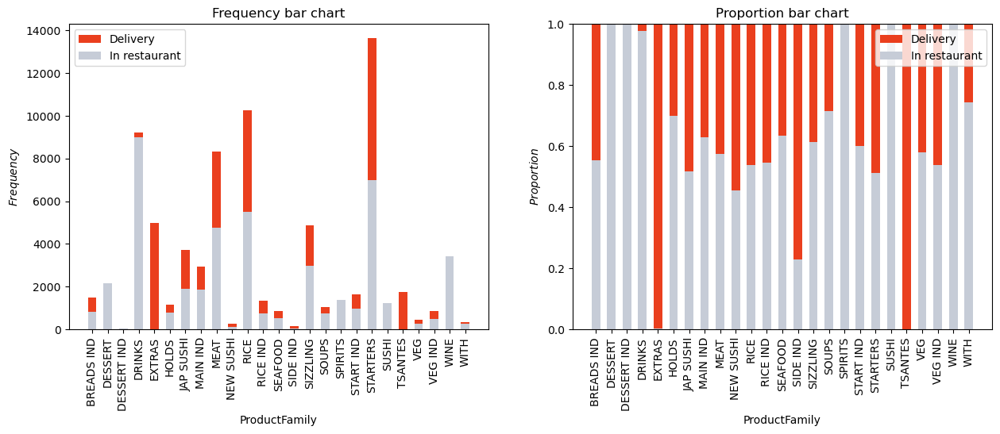

In [94]:
# plotting the proportions and absolute value of the product families depending on if it was delivery or not

product_target(df, 'ProductFamily', 'IsDelivery')

As can be seen, one category is only purchased by customers who do not eat at the restaurant, and it is 'Tsantes'. 'Tsantes' are bags, which make sense that are only items for delivery. Regarding the 'Extra' category, it should be investigated what are products included here, since these products are purchased in the large majority by people who eat at home. On the other hand, we have some categories that are only purchased by customers who eat at the restaurant, like 'Dessert Ind' and 'Sushi'. Also, 'Drinks' in general are not usually purchased by people who ask for delivery. Regarding the wines (and the spirits category that seems like only has products for dine-in, although the numbers tell us otherwise), we can speculate that maybe the restaurant does not have legal authorization to sell alcoholic drinks for delivery, but combined with the fact that few people purchase drinks in general when are not eating at the restaurant, we can conclude that maybe the customers when are purchasing food to eat at home do not want drinks as well. Regarding desserts, this should be a point where the restaurant can improve, like for example offering a discount for desserts for delivery, to transform their desserts into attractive products. Finally, regarding the 'Sushi' category, it should be investigated what are the differences between this category and the other sushi categories, like Japanese sushi and new sushi, to understand the lack of people purchasing these products when asking for delivery in comparison with the other categories.

We now can make the same analysis, but by `ProductDesignation`, to see if there are any products that are preferred for customers who dine in or for customers who ask for food delivery. Of course, it does not make sense to plot the `ProductFamily` whose products are only purchased by one type of client.

In [95]:
# computing the proportions (like in the function) to decide what are the product families that make sense to plot like above
cont_tab = pd.crosstab(df['ProductFamily'], df['IsDelivery'], margins = True)
categories = cont_tab.index[: -1]
obs_pct = np.array([np.divide(cont_tab.iloc[:-1, 0].values, cont_tab.iloc[:-1, 2].values), 
                    np.divide(cont_tab.iloc[:-1, 1].values, cont_tab.iloc[:-1, 2].values)])

# find indices where the array has a value of 0 or 1
indices = np.where((obs_pct[0] == 0) | (obs_pct[0] == 1) | (obs_pct[1] == 0) | (obs_pct[1] == 1))
indices_list = [i.tolist() for i in indices][0]

# getting the categories for which makes sense to plot the products
filtered_families = [category for index, category in enumerate(categories) if index not in indices_list]

BREADS IND


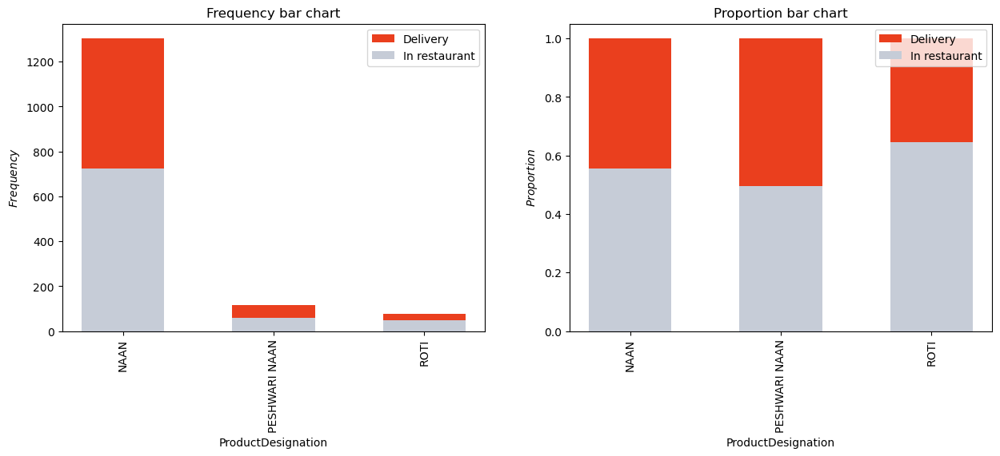

DESSERT


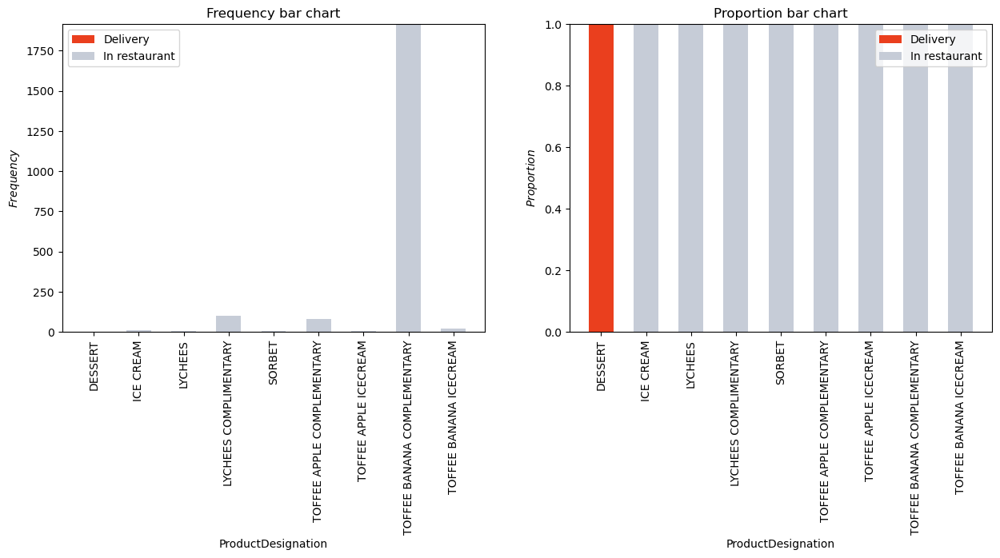

DRINKS


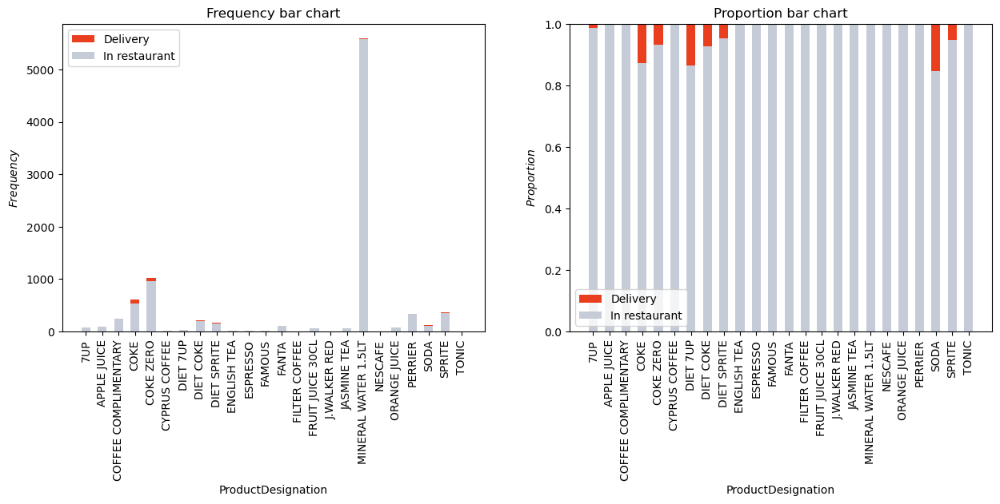

EXTRAS


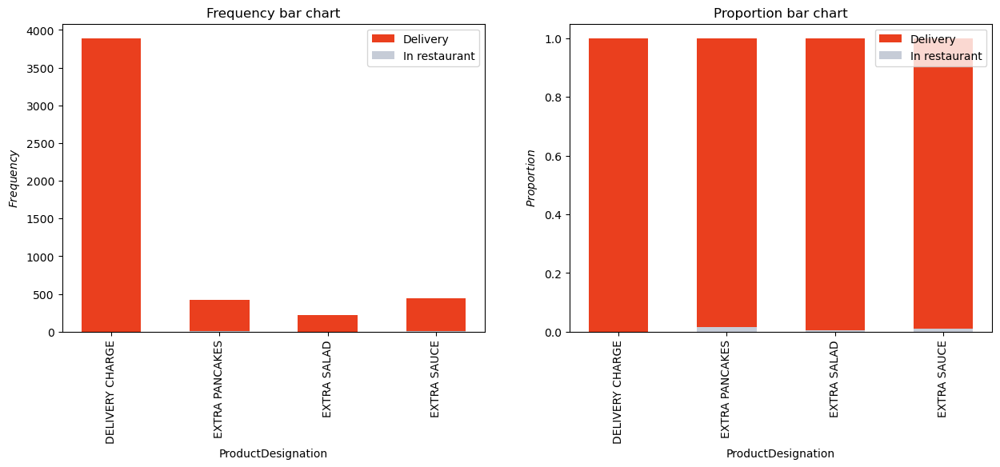

HOLDS


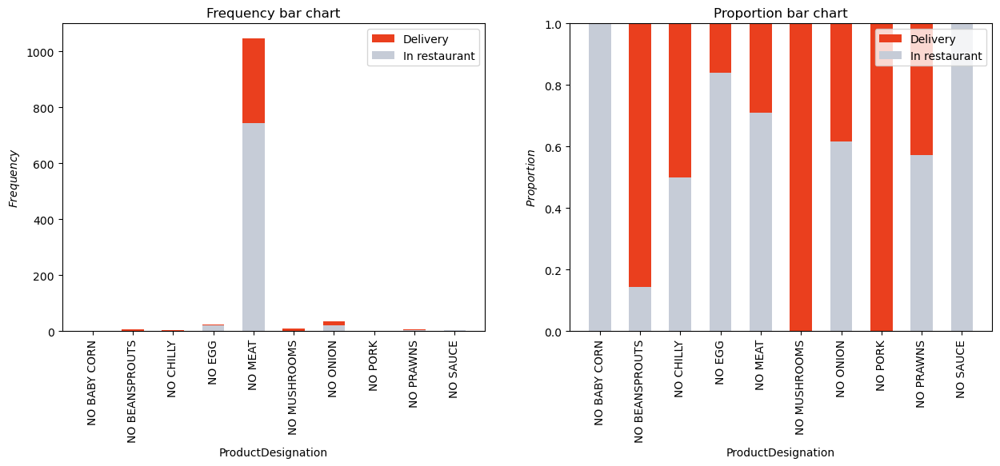

JAP SUSHI


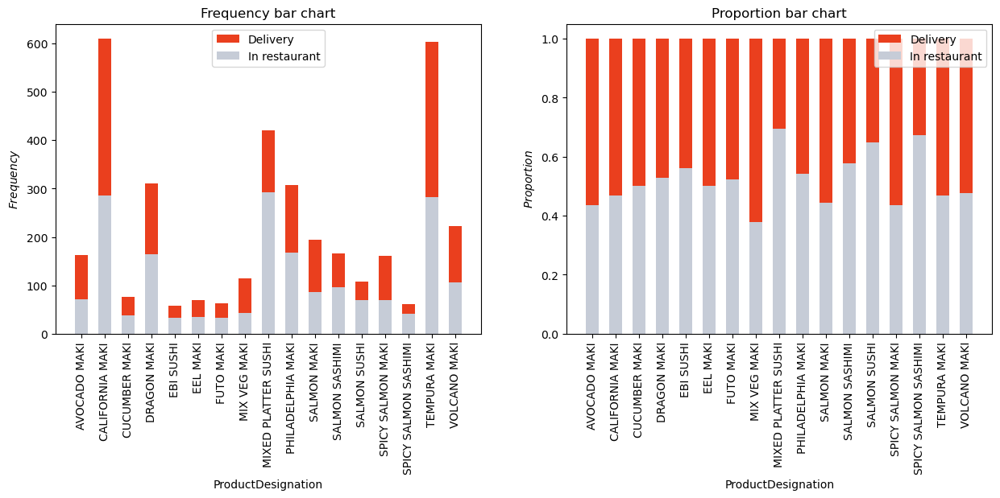

MAIN IND


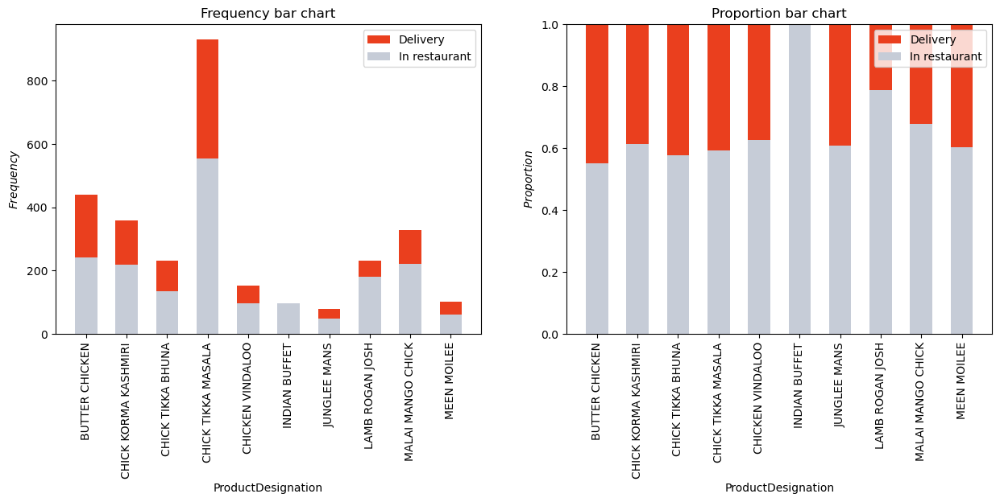

MEAT


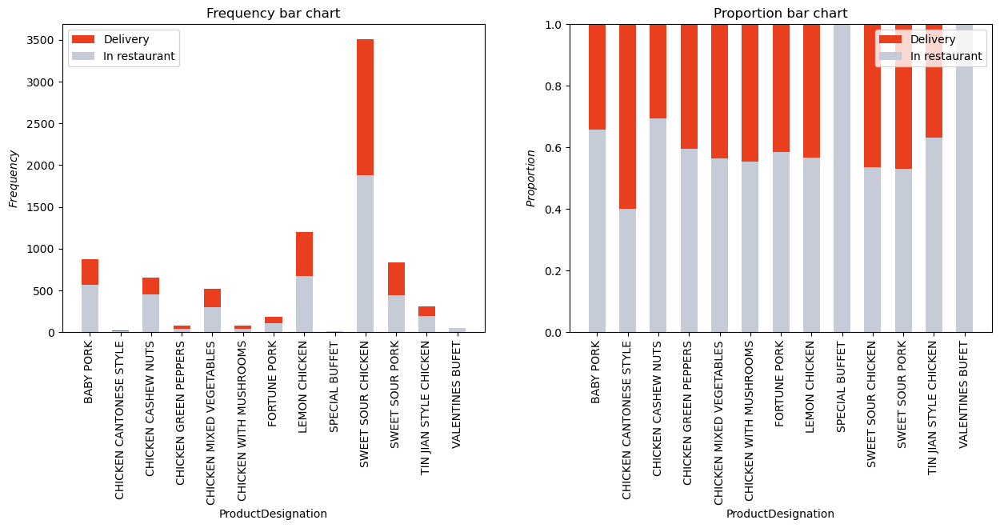

NEW SUSHI


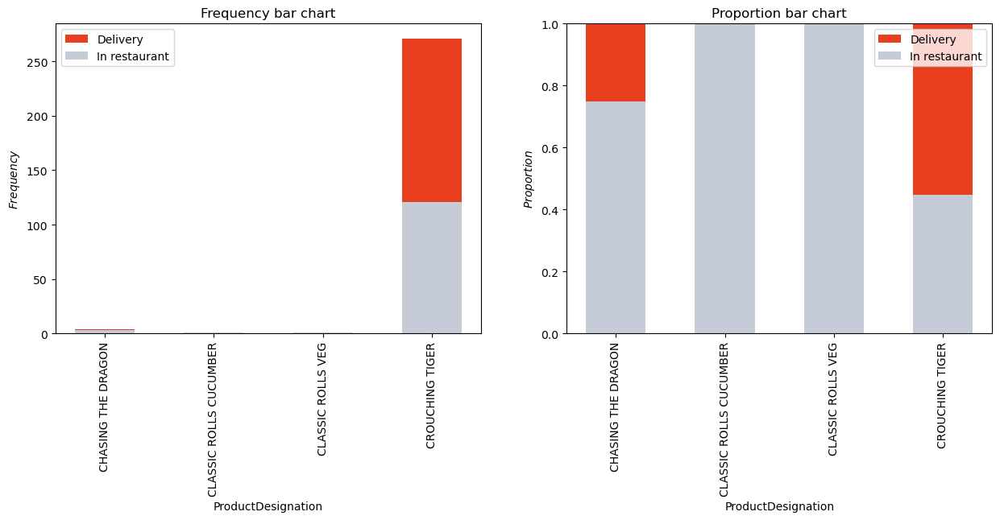

RICE


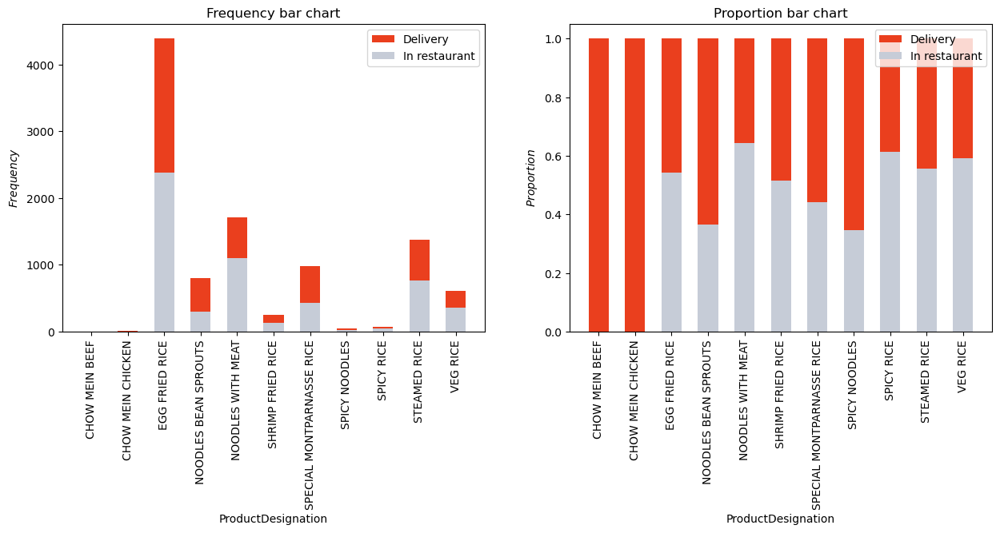

RICE IND


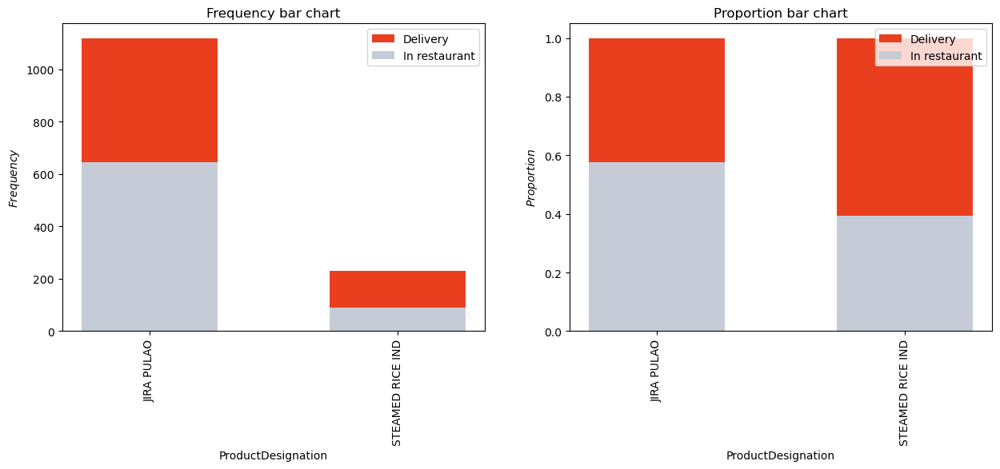

SEAFOOD


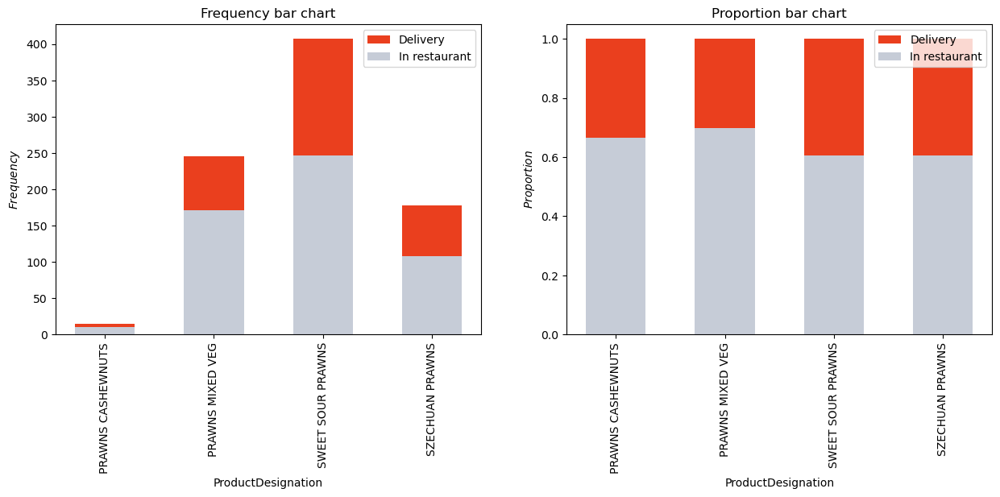

SIDE IND


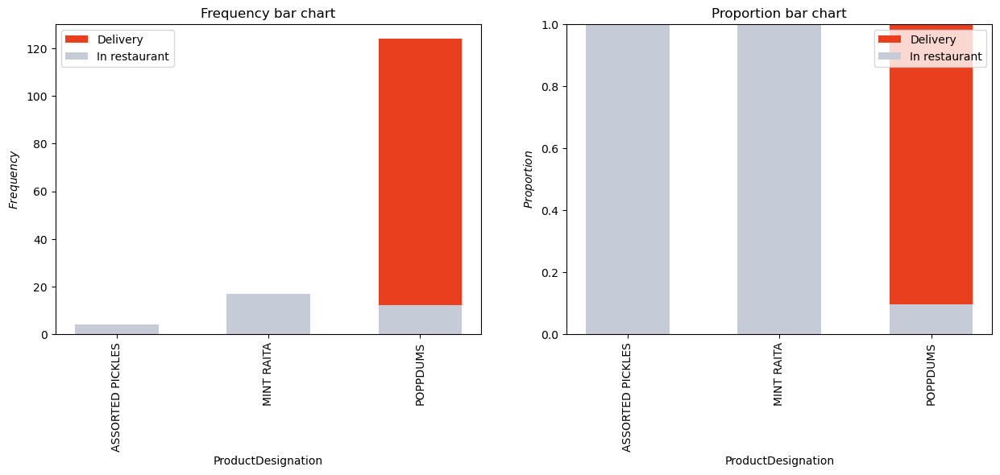

SIZZLING


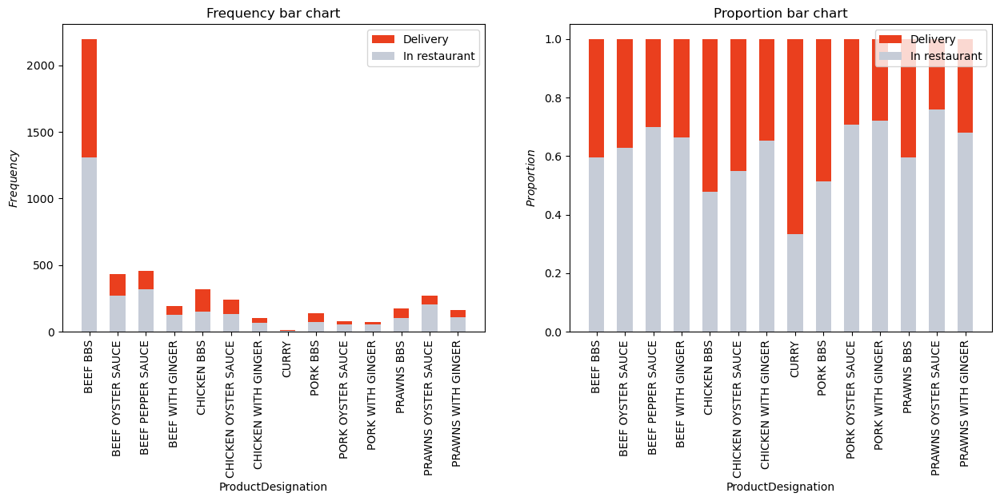

SOUPS


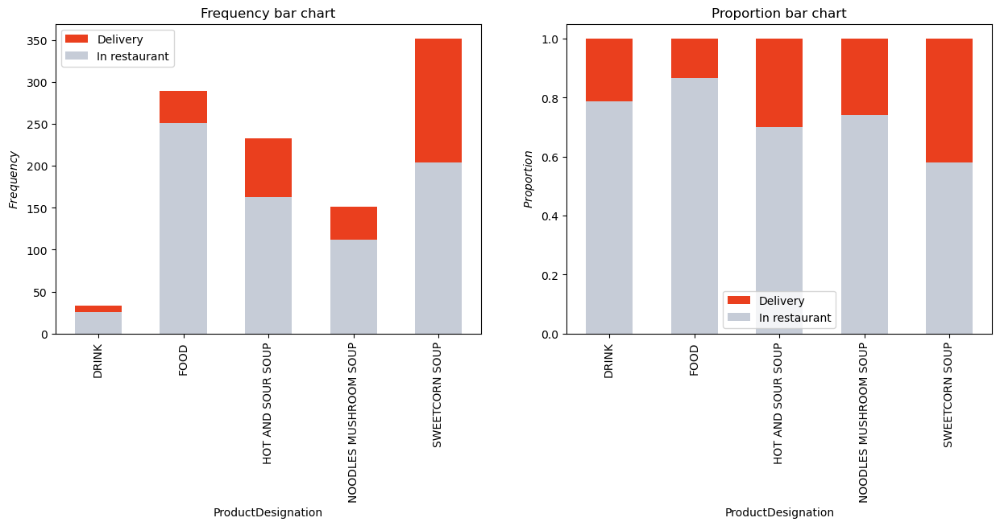

SPIRITS


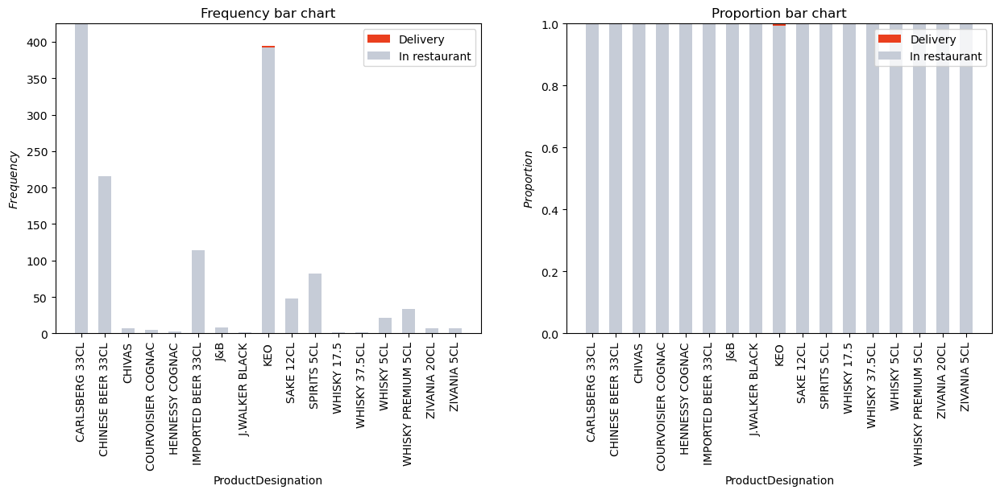

START IND


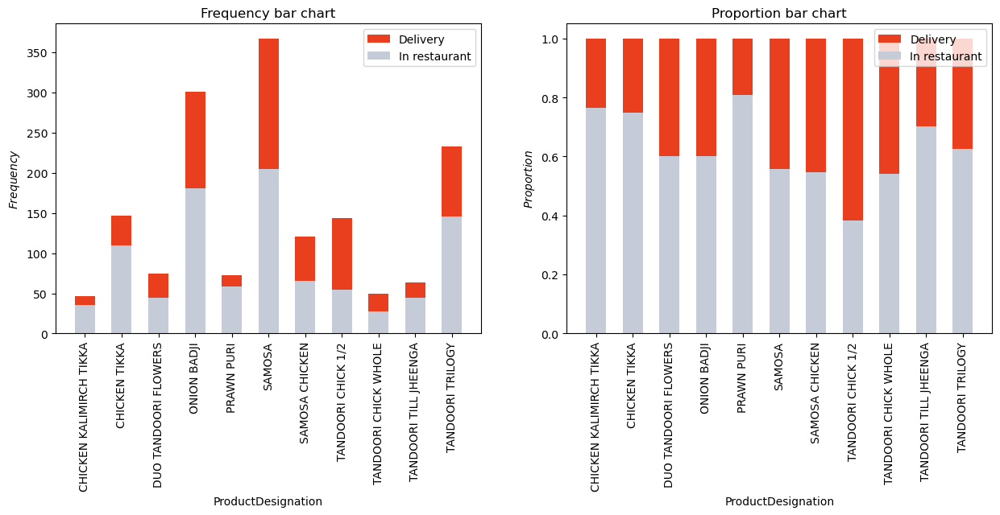

STARTERS


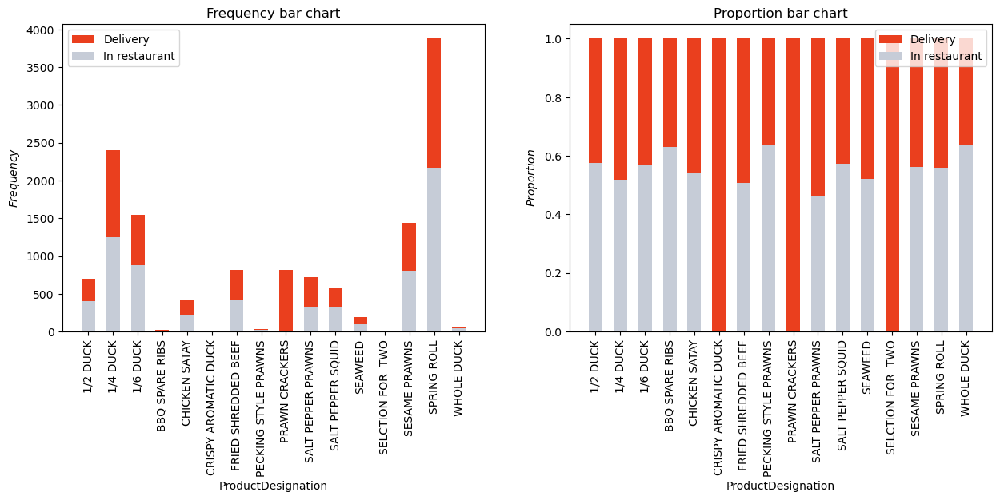

VEG


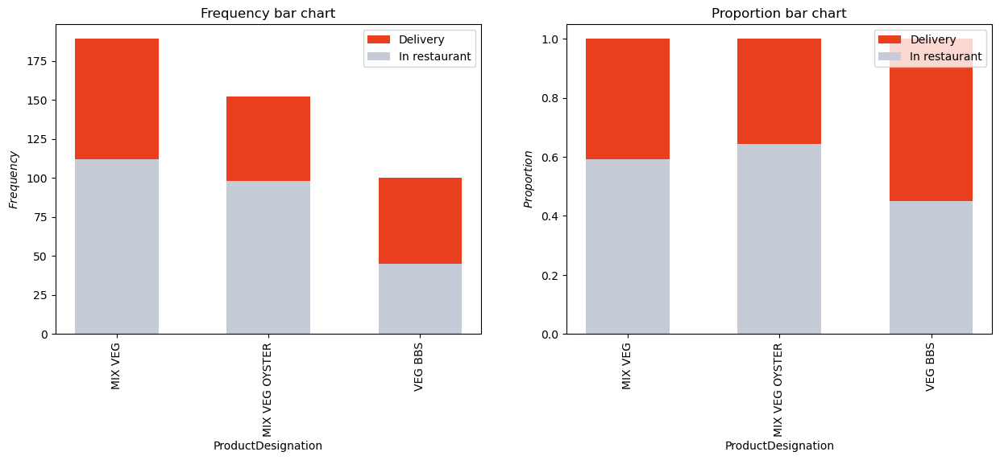

VEG IND


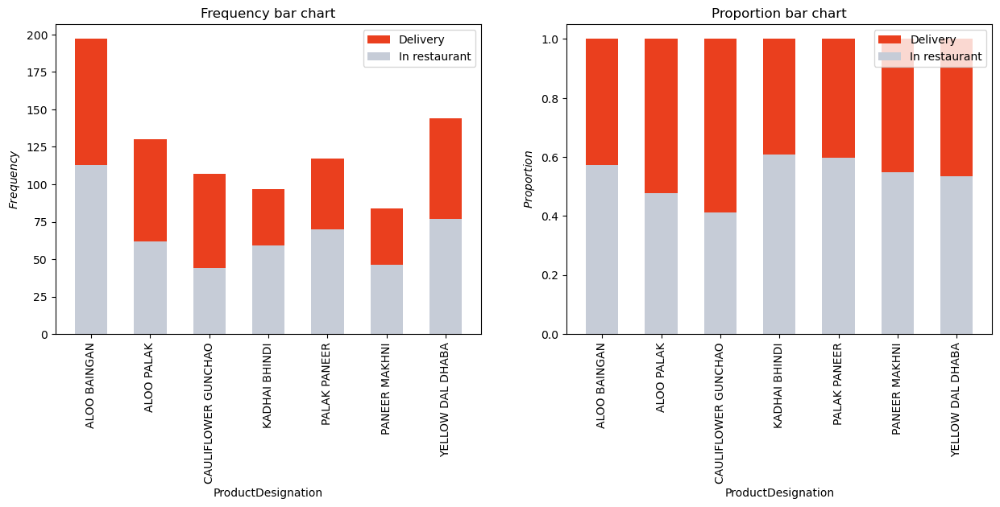

WINE


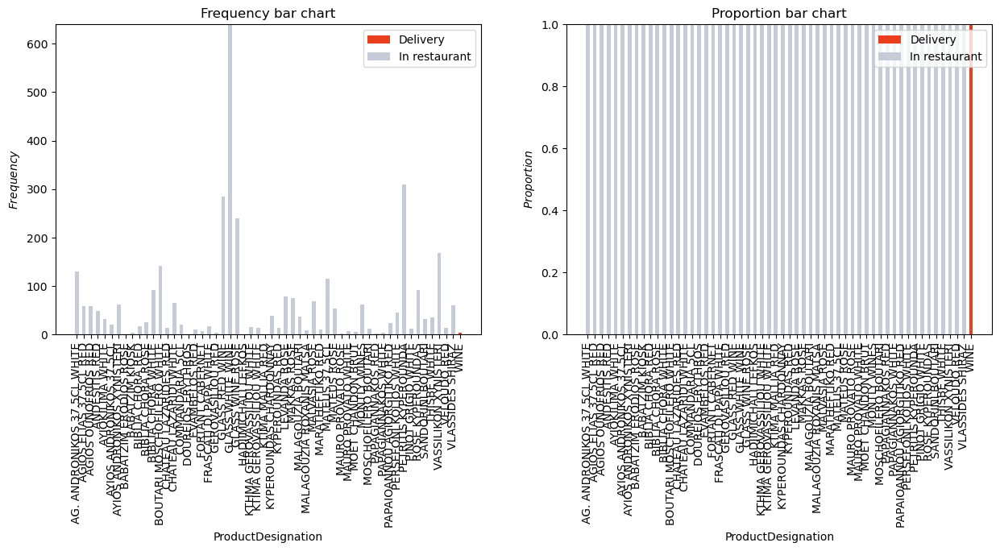

WITH


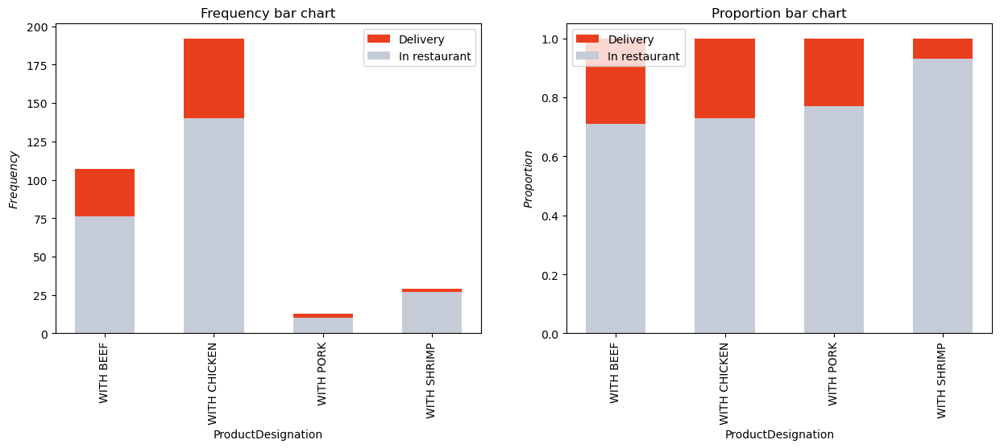

In [96]:
# iterating through the families
for family in filtered_families:

    # filtering the observations
    df_family = df[df['ProductFamily'] == family]

    # to know which families are being printed in the moment
    print(family)

    # plotting the proportions and absolute value of the product designation depending on if it was delivery or not
    product_target(df_family, 'ProductDesignation', 'IsDelivery')

Regarding `BREADS IND` we do not notice a significant difference between the two types of customers. Considering `DESSERT` only the product that was previously assigned to ‘Extras’ category is sold for delivery. As for `DRINKS`, we can see that the majority of the drinks are sold for dine-in. Considering `HOLDS`, we can notice that the majority of the products are not asked for very often, except for 'No meat' which was asked for roughly 1000 times, meaning that lots of times, the meals were changed by the customers to accomodate their preferences. There are some differences between the two types of customers for this family, but they are not relevant, as the frequencies are low. For `JAP SUSHI`, the differences are not significant. The same happens for `MAIN IND` and `MEAT`, except for two specific products that are 'Indian Buffet' and 'Special Buffet' that can only be purchased in the restaurant. Concerning `NEW SUSHI`, we have two products that are only purchased for delivery, but this cannot be significant, as the frequencies are too low. As for `RICE`, two products seem to only be available for delivery (but again the frequencies are low) and they are 'Chow Mein Beef' and 'Chow Mein Chicken'. Regarding `RICE IND`, `SEAFOOD`, and `SIZZLING`, the differences between the two types of customers are not significant. Relating to `SIDE IND`, two products are only sold at the restaurant ('Assorted Pickles' and 'Mint Raita') and the other is in the majority of the cases sold for delivery ('Poppdums'). 'SIZZLING' products are almost evenly sold for the restaurant and delivery, and for `SOUPS` the same happens, but the proportion sold at the restaurant is slightly higher than for delivery, which is normal, as usually people do not order soups for eat at home given the transportation constraints. Regarding `SPIRITS`, as noticed before, only a really small proportion of products is sold for delivery. As for `START IND`, there are no huge differences between the two types of customers, although it can be noticed that the proportions are slightly higher for dine-in. Considering `STARTERS`, there are three products that can be distinguished, 'Crispy Aromatic Duck', 'Prawn Crackers', and 'Selction for Two', because they are exclusively purchased for delivery. The rest of the products of this family is evenly distributed between the customers who dine in and the customers who ask for delivery. Regarding `VEG` and `VEG IND`, the proportion is also the same between the two types of customers, and, for the `WITH` family, we notice that the majority of customers who make extra requests are usually the ones who eat at the restaurant (which is also admissible, because it is easier to make them). Finally, regarding `WINES` we see that the products that were previously stored in the different wines families are consumed exclusively in the restaurant, while the wine that was assigned to the `DRINKS` family is exclusively for customers who order food at home. This may be due to the fact that the later has some characteristics that make it ideal to deliver, like a botle of smaller dimensions, or a plastic bottle, since maybe the restaurant is not allowed to transport glass.

The products that have really low frequency maybe should not be included in the menu, because preparing a dish that is not ordered frequently can be time-consuming, especially if it requires unique ingredients or preparation methods. Also, it can slow down service and decrease overall efficiency in the kitchen, adding to the fact that it may be inefficient to have a certain meal on the menu that is not orded whose ingredients will end up in the waste. However, this analysis should be done with the market basket analysis conclusions. 

<a id = "encoding"></a>

### 2.8. Encoding

[Back to Data Preparation](#preparation-index)

To use MLxtend package for market basket analysis, the data should be in the form of a transactional dataset, meaning that each row should represent one invoice and each column should represent one product. The cells in the dataset should contain binary values indicating whether the product was present (1) or absent (0) in that invoice/transaction. Like, for example:


| DocNumber | Item 1 | Item 2 | Item 3 | Item 4 | Item 5 |
| -------- | -------- | -------- | -------- | -------- | -------- |
| 1 | 1 | 0 | 1 | 1 | 0 |
| 2 | 0 | 1 | 0 | 1 | 1 |
| 3 | 1 | 0 | 0 | 1 | 1 |
| 4 | 1 | 1 | 1 | 0 | 0 |
| 5 | 0 | 1 | 1 | 0 | 1 |

In [97]:
# pivot the data: transforming lines as invoices and products as columns

df_enc = pd.pivot_table(df, index = 'DocNumber', columns = 'ProductDesignation', values = 'Qty', aggfunc = lambda x: 1 if len(x) > 0 else 0).fillna(0)
df_enc.head()

ProductDesignation,1/2 DUCK,1/4 DUCK,1/6 DUCK,7UP,AG. ANDRONIKOS 37.5CL WHITE,AGIOS ELIAS 37.5CL RED,AGIOS OUNOFRIOS RED,ALOO BAINGAN,ALOO PALAK,ANDESITIS RED,...,WHISKY PREMIUM 5CL,WHOLE DUCK,WINE,WITH BEEF,WITH CHICKEN,WITH PORK,WITH SHRIMP,YELLOW DAL DHABA,ZIVANIA 20CL,ZIVANIA 5CL
DocNumber,,,,,,,,,,,,,,,,,,,,,
TK0110000012018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TK0110000022018,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TK0110000032018,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TK0110000042018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TK0110000052018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


As said during the data understanding phase, we will delete 'Mineral Water 1.5lt' from the analysis.

In [98]:
# dropping water column

df_enc.drop(columns = 'MINERAL WATER 1.5LT', inplace = True)

In [99]:
# checking the shape of the new dataframe

df_enc.shape

(10998, 253)

Using product families instead of individual products in the analysis can be meaningful for understanding customer behaviour. For example, a customer who orders a pizza and a water and another customer who orders a salad and a soda may seem unrelated, however they both order something healthy and something tasteful. So, grouping products into families is helpful to indetify common trends in customer behaviour and to tailor the restaurant's menu and cross-selling strategies. Therefore, family products can also be used in the analsysis.

In [100]:
# pivot the data: transforming lines as invoices and family products as columns

df_fam = pd.pivot_table(df, index = 'DocNumber', columns = 'ProductFamily', values = 'Qty', aggfunc = lambda x: 1 if len(x) > 0 else 0).fillna(0)
df_fam.head()

ProductFamily,BREADS IND,DESSERT,DESSERT IND,DRINKS,EXTRAS,HOLDS,JAP SUSHI,MAIN IND,MEAT,NEW SUSHI,...,SOUPS,SPIRITS,START IND,STARTERS,SUSHI,TSANTES,VEG,VEG IND,WINE,WITH
DocNumber,,,,,,,,,,,,,,,,,,,,,
TK0110000012018,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
TK0110000022018,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
TK0110000032018,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
TK0110000042018,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
TK0110000052018,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


As stated before, we have some extra variables that could be useful to our analysis, like the weather variables, the holidays variable, or the delivery variable. Therefore, as we still need to follow the structure stated before for the algorithm, we need to perform one-hot encoding for the weather variables. This process involves creating a new binary variable for each unique category in the original categorical variable, and each of these new variables take a value of 1 if the corresponding category was present in the original data, and 0 otherwise.

In [101]:
def ohc(data, nmf):
    """
    inputs:
    - data: pandas DataFrame containing the categorical features to be encoded.
    - nmf: list of the column names of those non-metric features.
    
    this function performs one-hot encoding on a set of categorical features (it converts categorical data into numerical form)
    the function assumes that the input data does not contain any missing values in the categorical features to be encoded.
    """
    
    # defining an instance of OneHotEncoder
    encoder = OneHotEncoder(sparse_output = False, drop = 'first')
    
    # use it to encode our variables
    ohc_feat = encoder.fit_transform(data.loc[:, nmf])
    
    # after this we get the new names of the features, and transform this new information into a pandas dataframe
    ohc_feat_names = encoder.get_feature_names_out()
    ohc_data = pd.DataFrame(columns = ohc_feat_names, data = ohc_feat, index = data.index)
    
    # reassigning df to contain the ohc variables and non_metric_features to contain the new names of the encoded variables
    data_ohc = pd.concat([data, ohc_data], axis = 1)
    encoded_nmf = ohc_feat_names.tolist()
    
    return data_ohc, encoded_nmf

In [102]:
# defining a dictionary that specifies how to aggregate each column in the dataset when grouping by DocNumber (the first value encountered for each group is used)
aggregation_function = {'IsDelivery': 'first',
                        'IsHoliday': 'first',
                        'TemperatureAvgBin': 'first',
                        'WindSpeedAvgBin': 'first'}

# grouping the original dataframe by DocNumber, applying the aggregation function defined above to each group
encoded_characteristics = df.groupby(['DocNumber']).agg(aggregation_function)

# using the function defined above to perform one-hot encoding on the categorical variables, and updating weather_variables_binned to reflect the new column names
encoded_characteristics, weather_variables_binned = ohc(encoded_characteristics, weather_variables_binned)

# droping the original binned columns for temperature, humidity, and wind speed, as they were one-hot encoded in the previous step
encoded_characteristics.drop(columns = ['TemperatureAvgBin', 'WindSpeedAvgBin'], inplace = True)

# combining the one-hot encoded categorical variables with the other features of the original dataframe, allowing for further analysis
final = pd.concat([df_enc, encoded_characteristics, df_fam], axis = 1)
final

,1/2 DUCK,1/4 DUCK,1/6 DUCK,7UP,AG. ANDRONIKOS 37.5CL WHITE,AGIOS ELIAS 37.5CL RED,AGIOS OUNOFRIOS RED,ALOO BAINGAN,ALOO PALAK,ANDESITIS RED,...,SOUPS,SPIRITS,START IND,STARTERS,SUSHI,TSANTES,VEG,VEG IND,WINE,WITH
DocNumber,,,,,,,,,,,,,,,,,,,,,
TK0110000012018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
TK0110000022018,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
TK0110000032018,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
TK0110000042018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
TK0110000052018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TKD0320044492018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
TKD0320044502018,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
TKD0320044512018,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


**To help**:

- This slice of the dataset contains the products: *final.iloc[:, :253]*
- This slice of the dataset contains the families: *final.iloc[:, -25:]*
- This slice of the dataset contains the others variables, like regarding weather and holidays: *final.iloc[:, 253:-25]*

In market basket analysis we want to reveal connections between multiple items thar are purchased based on the data. So, if a certain customer only bought one product, then it is not possible to estabilish associations between two or more items for a single transaction. Therefore, the next step is to eliminate transactions with only one item purchased.

In [103]:
# filtering the products that were bought more than once (that is why we are only grabbing the first 254 columns of the dataframe)
final = final[(final.iloc[:, :253] > 0).sum(axis = 1) >= 2]

# checking the shape of the new dataframe
final.shape

(10541, 286)

We can see that the number of lines of the dataframe changed, meaning that we had some invoices where only one product was bought, which did not made sense.

In [104]:
# convert the data frame with 1s and 0s to a boolean data frame

final = final.astype(bool)

<a id = "modelling"></a>

## 3. Modelling

<a id = "modelling-index"></a>

- [3.1. Functions](#functions)
- [3.2. Apriori algorithm](#apriori)
- [3.3. Association rules for families](#association-rules-families)
- [3.4. Association rules for products](#association-rules-products)
- [3.5. Association rules using extra information](#association-rules-extra)
- [3.6. Association rules depending on if the reservation was dine-in or delivery](#association-rules-delivery)


[Back to TOC](#toc)

<a id = "functions"></a>

### 3.1. Functions

[Back to Modelling](#modelling-index)

In [105]:
def generate_rules(frequent, metric, threshold, ascending):
    """
    inputs:
    - frequent: pandas DataFrame containing the frequent itemsets generated from the dataset.
    - metric: string specifying the metric used to evaluate the association rules. Options are 'support', 'confidence', 'lift', 'leverage', and 'conviction'.
    - threshold: float specifying the minimum threshold value for the selected metric.
    - ascending: boolean value set to true if it is wanted a dataset sorted ascending by the metric, or false otherwise. 
    
    this function generates association rules using the frequent itemsets generated from a dataset.
    """

    rules = association_rules(frequent, metric = metric, min_threshold = threshold)
    rules.sort_values(by = metric, ascending = ascending, inplace = True)
    
    return rules

In [106]:
def heat_map_rules(rules, metric):
    """
    code from https://goldinlocks.github.io/Market-Basket-Analysis-in-Python/
    
    inputs:
    - rules: pandas DataFrame containing association rules. It must have 'antecedents', 'consequents', and the 'metric' columns.
    - metric: string indicating the metric to be used for creating the heatmap.

    this function creates a heatmap to visualize the relationship between antecedents and consequents based on a specified metric. 
    the heatmap shows the support values for each association rule as a colour gradient (the brighter colours indicate higher valyes)
    """

    # making a copy of the dataset to change it, but keep the original one
    rules_copy = rules.copy()

    # converting antecedents and consequents into strings
    rules_copy['antecedents'] = rules_copy['antecedents'].apply(lambda a: ','.join(list(a)))
    rules_copy['consequents'] = rules_copy['consequents'].apply(lambda a: ','.join(list(a)))

    # transforming antecedent, consequent, and support columns into matrix
    table = rules_copy.pivot(columns = 'consequents', index = 'antecedents', values = metric)

    # graph
    plt.figure(figsize = (10, 15))
    sns.heatmap(table, annot = True, cbar = True, linecolor = '#8d99ae', linewidth = .5, cmap = sns.color_palette('crest', as_cmap = True))
    b, t = plt.ylim() 
    b += 0.5 
    t -= 0.5 
    plt.ylim(b, t) 
    plt.yticks(rotation = 0)
    plt.show()

In [107]:
def rules_to_coordinates(rules):
    """
    code from https://goldinlocks.github.io/Market-Basket-Analysis-in-Python/

    inputs:
    - rules: pandas DataFrame that contains association rules with antecedents, consequents, and some measures.

    this function extracts the antecedent, consequent and ruleID for each association rules in form of string, instead of frozenset.
    """

    rules['antecedent'] = rules['antecedents'].apply(lambda antecedent: list(antecedent)[0])
    rules['consequent'] = rules['consequents'].apply(lambda consequent: list(consequent)[0])
    rules['rule'] = rules.index

    return rules[['antecedent', 'consequent', 'rule']]

In [108]:
def parallel_coordinates_rules(rules):
    """
    code from https://goldinlocks.github.io/Market-Basket-Analysis-in-Python/

    inputs:
    - rules: set of rules to be plotted, provided as a Pandas DataFrame.

    this function generates a parallel coordinates plot of the rules that have a single antecedent and a single consequent.
    """

    # we will be only looking for rules with one antecedent and one consequent, as are the ones that can be plotted like this
    # defining the filters
    antecedent_mask = pd.Series([len(x) == 1 for x in rules['antecedents']], index = rules.index)
    consequent_mask = pd.Series([len(x) == 1 for x in rules['consequents']], index = rules.index)

    # applying the filters
    filtered_rules = rules[antecedent_mask & consequent_mask]

    # converting rules into coordinates suitable for use in a parallel coordinates plot
    coords = rules_to_coordinates(filtered_rules)

    # generating parallel coordinates plot
    plt.figure(figsize = (4, 8))
    parallel_coordinates(coords, 'rule', color = '#8d99ae')
    plt.legend([])
    plt.grid(True)
    plt.show()

In [109]:
def plot_network(rules, number_rules, k_value = 0.5):
    """
    inputs:
    - rules: pandas dataframe containing association rules generated from the dataset.
    - number_rules: integer specifying the number of rules to be plotted in the network graph.
    - k_value: 

    this function is used to plot a network graph of association rules generated from a given dataset. 
    """

    # creating a copy of the rules and transform the sets into strings
    rules_plot = rules.copy(deep = True)
    rules_plot['LHS'] = [','.join(list(x)) for x in rules_plot['antecedents']]
    rules_plot['RHS'] = [','.join(list(x)) for x in rules_plot['consequents']]

    # removing duplicate if reversed rules
    rules_plot['SortedRow'] = [sorted([a, b]) for a, b in zip(rules_plot.LHS, rules_plot.RHS)]
    rules_plot['SortedRow'] = rules_plot['SortedRow'].astype(str)
    rules_plot.drop_duplicates(subset = ['SortedRow'], inplace = True)

    # filtering the number of rules that we want to plot
    rules_plot = rules_plot[:number_rules]

    # defining the figure and plotting the network
    fig = plt.figure(figsize = (10, 10)) 
    G = nx.from_pandas_edgelist(rules_plot, 'LHS', 'RHS')
    pos = nx.spring_layout(G, seed = 7, k = k_value)
    nx.draw(G, with_labels = True, node_size = 150, node_color = '#ea3f1e', pos = pos)
    plt.axis('equal')
    plt.show()

<a id = "apriori"></a>

### 3.2. Apriori algorithm

[Back to Modelling](#modelling-index)

The Apriori algorithm is used for mining frequent itemsets (products that are often bought together) and association rules. It explores the frequent itemsets in a dataset and generates candidate itemsets (subsets of the frequent itemsets), in a bottom-up strategy. The algorithm uses support, which measures the proportion of transactions that contain a given itemset, to prune itemsets that are not frequent (to control complexity, this is to there are likely to be a huge number of cooccurrences, simply due to chance or due to a generalizable pattern).
- Subsets of frequent sets are frequent.
- Retain sets known to be frequent.
- Prune sets not known to be frequent.

In the this algorithm, we can control the parameter *min_support*, that determines the minimum support threshold for an itemset to be considered frequent. For example, if this parameter is set to 0.5, a frequent itemset is defined as a set of items that occur together in at least 50% of all transactions in the database. The value for this parameter depends on the size of the dataset, the specific problem to be solved and the number of unique items in the dataset. This parameter reduces the number of itemsets that need to be considered, making the training process more efficient. If the threshold is set too low, too many frequent itemsets will be caught, while if the threshold is set too high, some important itemsets may be missed.

Sources:
- https://towardsdatascience.com/the-apriori-algorithm-5da3db9aea95
- https://medium.com/@jihargifari/how-to-perform-market-basket-analysis-in-python-bd00b745b106
- https://365datascience.com/tutorials/python-tutorials/market-basket-analysis/

In [110]:
def apply_apriori(data, min_support):
    """ 
    inputs:
    - data: pandas DataFrame with the dataset that the Apriori algorithm will be applied to.
    - min_support: float which represents the minimum support threshold for an itemset to be considered as frequent.
    
    this function applies the apriori algorithm to a dataset using a given minimum support threshold.
    it returns the results with the frequent itemsets sorted in descending order of their support value.
    also, it adds a column with the size of each itemset. 
    """

    # apply the apriori algorithm to the data provided based on the support value given
    frequent = apriori(data, min_support = min_support, use_colnames = True).sort_values('support', ascending = False).reset_index(drop = True)

    # adding an additional column that contains the size of the item set. this will be helpful with filtering and further analysis
    frequent['length'] = frequent['itemsets'].apply(lambda x: len(x))

    return frequent

In [111]:
# apply the apriori algorithm to only the families

frequent_families = apply_apriori(final.iloc[:, -25:], 0.05)
frequent_families

,support,itemsets,length
0,0.709515,(RICE),1
1,0.660564,(STARTERS),1
2,0.594725,"(RICE, STARTERS)",2
3,0.559055,(MEAT),1
4,0.542264,(DRINKS),1
...,...,...,...
268,0.051229,"(RICE, TSANTES, SIZZLING, EXTRAS)",4
269,0.050849,"(SIZZLING, JAP SUSHI, DRINKS)",3
270,0.050470,"(RICE, SPIRITS, SIZZLING)",3
271,0.050280,"(WINE, SIZZLING, STARTERS, DESSERT, MEAT)",5


There were 273 items that were considered frequently bought items, and the most frequently purchased family is ‘Rice’, with a support value of 0.709515, meaning that it was purchased in 70% of all transactions.

In [112]:
# apply the apriori algorithm to only the products

frequent_itemsets = apply_apriori(final.iloc[:, :253], 0.05)
frequent_itemsets

,support,itemsets,length
0,0.415900,(EGG FRIED RICE),1
1,0.368751,(DELIVERY CHARGE),1
2,0.367517,(SPRING ROLL),1
3,0.332985,(SWEET SOUR CHICKEN),1
4,0.227018,(1/4 DUCK),1
...,...,...,...
93,0.052652,"(DELIVERY CHARGE, SWEET SOUR CHICKEN, TSANTA)",3
94,0.052557,"(CHICK TIKKA MASALA, NAAN)",2
95,0.051987,"(NOODLES WITH MEAT, SWEET SOUR CHICKEN, EGG FR...",3
96,0.051798,"(CHICK TIKKA MASALA, JIRA PULAO)",2


There are 98 transactions that are considered as frequently bought items (items that are bought as many as 5% out of the whole transaction). For example, ‘Egg fried rice’ has a support value of 0.415900, meaning that the item appears 41.59% of the transactions in the dataset.

<a id = "association-rules-families"></a>

### 3.3. Association rules for families

[Back to Modelling](#modelling-index)

Association rules are used to perform market basket analysis to understand how different items are related to each other. These are rules that discover interesting patterns and describe relationships between items in a dataset. A rule can be “If A occurs then B is likely to occur as well”. To evaluate association rules, we use some measures: 
- **Support** (is defined for itemsets, not association rules), that measures the frequency of occurrence of an itemset in the dataset. It is the proportion of transactions that contain the itemset.
- **Confidence**, that measures the strenght of the relationship between two items in an association rule. It is the proportion of transactions containing the antecedent (first item) that also contain the consequent (second item). The confidence is 1 for a rule, if the consequent and antecedent always occur together.
- **Lift**, to assess the strenght of a relationship between two itemsets. It indicates how much more often two items are purchased together than would be expected if they were purchased independently at random. 

After applying the Apriori algorithm and finding the frequently bought items, now we can find the association rules, in order to extract information about which items that are more likely to be sold together. 

Sources:
- https://goldinlocks.github.io/Market-Basket-Analysis-in-Python/

In [113]:
# generating the rules based on the confidence value

rules_confidence_families = generate_rules(frequent_families, 'confidence', 0.60, False)
rules_confidence_families

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
584,"(HOLDS, SIZZLING)",(RICE),0.068115,0.709515,0.068115,1.000000,1.409413,0.019786,inf
367,"(HOLDS, MEAT)",(RICE),0.086140,0.709515,0.086140,1.000000,1.409413,0.025022,inf
796,"(HOLDS, STARTERS, MEAT, SIZZLING)",(RICE),0.053695,0.709515,0.053695,1.000000,1.409413,0.015598,inf
234,(HOLDS),(RICE),0.107011,0.709515,0.107011,1.000000,1.409413,0.031085,inf
748,"(HOLDS, MEAT, SIZZLING)",(RICE),0.057110,0.709515,0.057110,1.000000,1.409413,0.016590,inf
...,...,...,...,...,...,...,...,...,...
464,(RICE IND),"(BREADS IND, MAIN IND)",0.124277,0.108434,0.074756,0.601527,5.547413,0.061280,2.237456
445,"(RICE, DESSERT)","(SIZZLING, MEAT, DRINKS)",0.129210,0.182336,0.077697,0.601322,3.297883,0.054137,2.050937
188,"(RICE, WINE)","(SIZZLING, STARTERS, DRINKS)",0.196376,0.205673,0.118015,0.600966,2.921949,0.077626,1.990626
59,"(STARTERS, DRINKS)","(RICE, SIZZLING)",0.336401,0.382412,0.202068,0.600677,1.570760,0.073425,1.546588


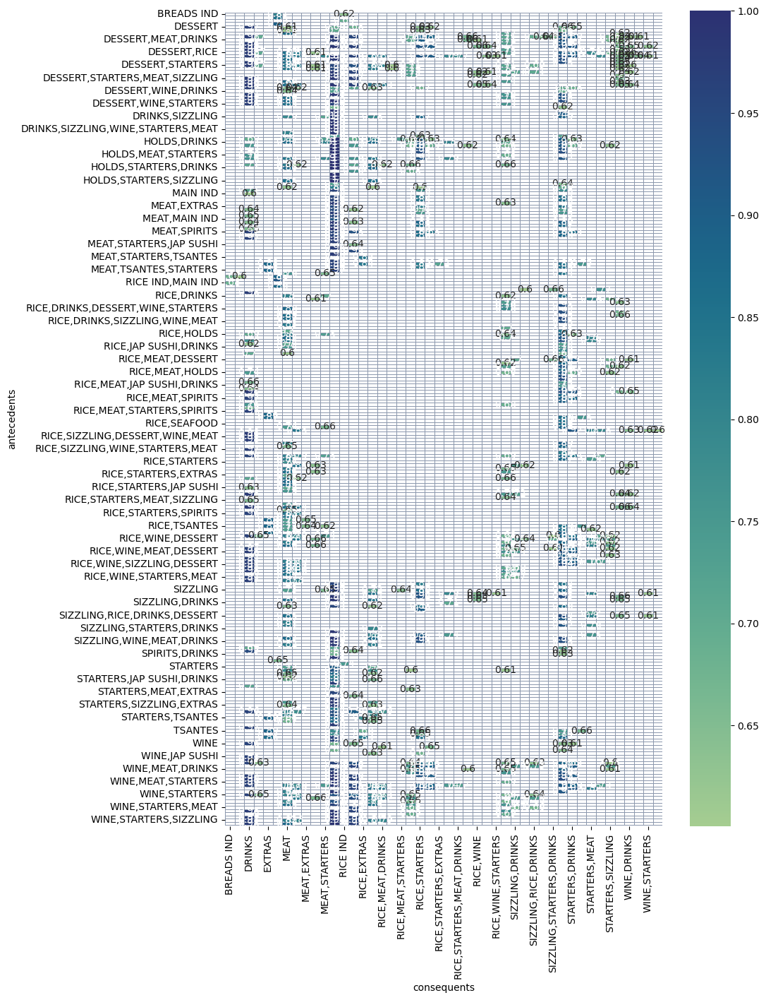

In [114]:
# heatmap to understand the rules

heat_map_rules(rules_confidence_families, 'confidence')

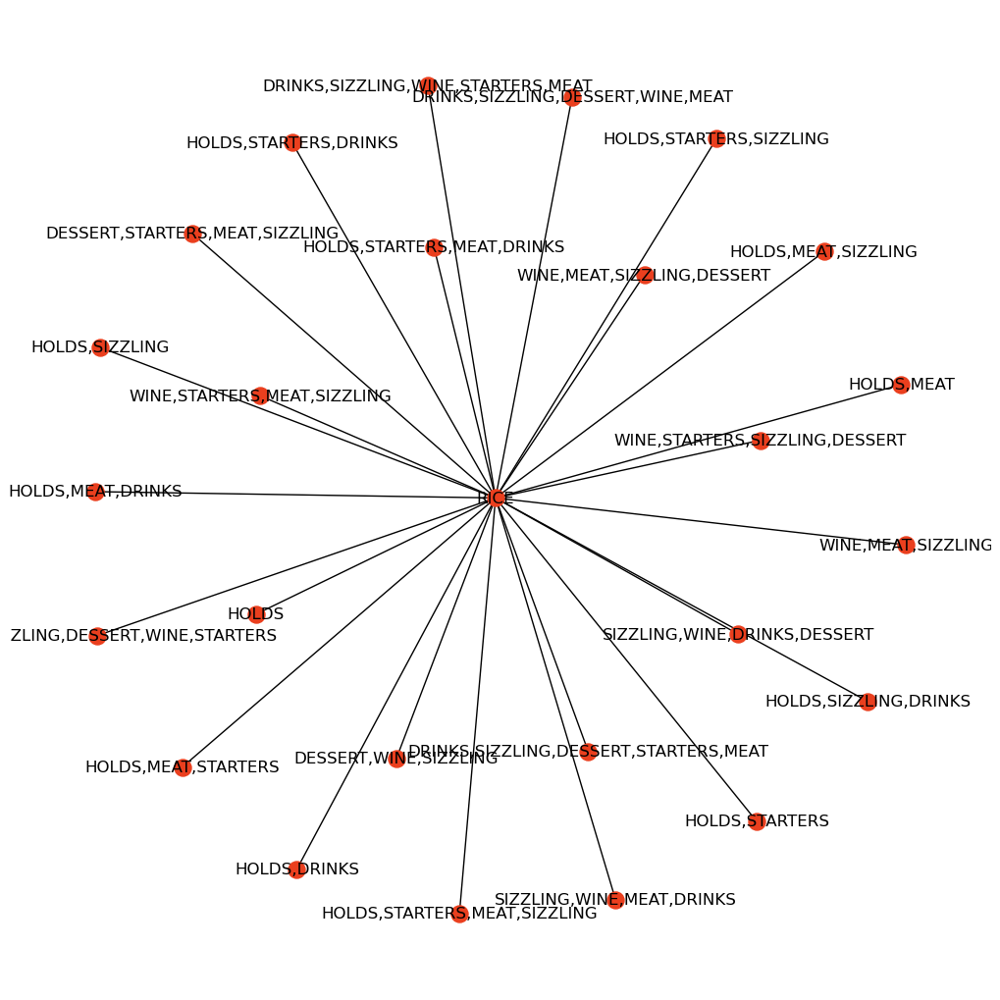

In [115]:
# network with the products to understand the rules

plot_network(rules_confidence_families, 25)

Substitute products are products that can be used as alternatives to each other to satisfy the same customer need. For example, when one product becomes unavailable, customers may switch to a substitute because they cannot buy the original one. Sugar and honey can be considered substitute products, as well as margarine and butter. In the case of a restaurant, we can say that meat meals and fish meals can be considered, up to a certain point, as substitute products. To identify substitute products in market basket analysis, we use association rules to find items that are frequently purchased together by customers, and we find the rules with low lift. Low lift means that the two items occur together less often than would be expected by chance. 

It is relevant for our analysis to find substitute product families.

In [116]:
# substitute families

rules_substitute_families = generate_rules(frequent_families, 'lift', 0.0, True)
rules_substitute_families.head(10)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
1884,"(RICE, STARTERS)",(MAIN IND),0.594725,0.195048,0.061854,0.104004,0.533222,-0.054146,0.898388
1889,(MAIN IND),"(RICE, STARTERS)",0.195048,0.594725,0.061854,0.317121,0.533222,-0.054146,0.593479
2130,"(RICE, MEAT)",(MAIN IND),0.536097,0.195048,0.056446,0.105291,0.539822,-0.048118,0.899680
2135,(MAIN IND),"(RICE, MEAT)",0.195048,0.536097,0.056446,0.289397,0.539822,-0.048118,0.652830
1917,(MAIN IND),(MEAT),0.195048,0.559055,0.061190,0.313716,0.561154,-0.047853,0.642511
1916,(MEAT),(MAIN IND),0.559055,0.195048,0.061190,0.109452,0.561154,-0.047853,0.903884
2235,(RICE),(BREADS IND),0.709515,0.134617,0.055403,0.078085,0.580054,-0.040110,0.938680
2234,(BREADS IND),(RICE),0.134617,0.709515,0.055403,0.411557,0.580054,-0.040110,0.493650
2319,(STARTERS),(BREADS IND),0.660564,0.134617,0.053505,0.081000,0.601703,-0.035418,0.941657
2318,(BREADS IND),(STARTERS),0.134617,0.660564,0.053505,0.397463,0.601703,-0.035418,0.563345


As the rules we are analysing are already filtered for the measures that we chose, meaning that they are strong in respect of the metrics chosen, we can simply just visualize whether a rule exists or not, rather than the intensity of the rule. So, parallel coordinates plot is the ideal visualization to do that if we are only plotting the rules with one antecedent and one consequent.

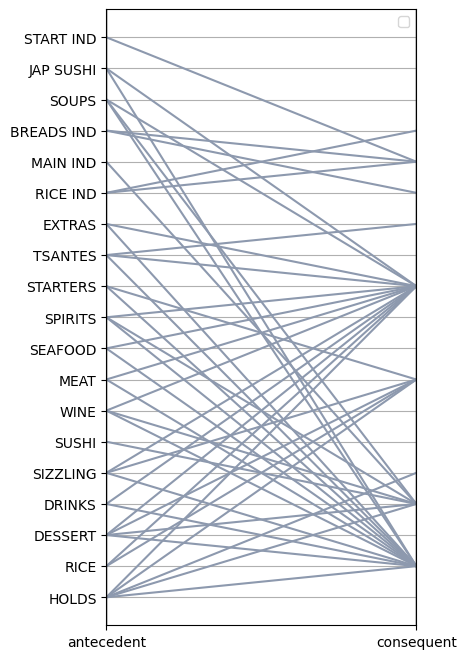

In [117]:
# parallel coordinate plot for the rules with only 1 antecendent and 1 consequent to understand the rules

parallel_coordinates_rules(rules_confidence_families)

<a id = "association-rules-products"></a>

### 3.4. Association rules for products

[Back to Modelling](#modelling-index)

In [118]:
# generating the rules based on the confidence value

rules_confidence = generate_rules(frequent_itemsets, 'confidence', 0.50, False)
rules_confidence.head(20)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
36,"(SPRING ROLL, NO MEAT)",(NOODLES WITH MEAT),0.063656,0.162413,0.063656,1.000000,6.157126,0.053318,inf
44,"(EGG FRIED RICE, NO MEAT)",(NOODLES WITH MEAT),0.056636,0.162413,0.056636,1.000000,6.157126,0.047438,inf
13,(NO MEAT),(NOODLES WITH MEAT),0.099326,0.162413,0.099326,1.000000,6.157126,0.083194,inf
4,(TSANTA),(DELIVERY CHARGE),0.165924,0.368751,0.143725,0.866209,2.349038,0.082540,4.718185
32,"(TSANTA, EGG FRIED RICE)",(DELIVERY CHARGE),0.074566,0.368751,0.064225,0.861323,2.335788,0.036729,4.551945
54,"(SWEET SOUR CHICKEN, TSANTA)",(DELIVERY CHARGE),0.061759,0.368751,0.052652,0.852535,2.311954,0.029878,4.280660
50,"(TSANTA, SPRING ROLL)",(DELIVERY CHARGE),0.062518,0.368751,0.053126,0.849772,2.304464,0.030072,4.201953
38,(PRAWN CRACKERS),(DELIVERY CHARGE),0.077317,0.368751,0.061569,0.796319,2.159506,0.033058,3.099206
28,"(BEEF BBS, SWEET SOUR CHICKEN)",(EGG FRIED RICE),0.095816,0.415900,0.068874,0.718812,1.728329,0.029024,2.077258
35,"(NOODLES WITH MEAT, SPRING ROLL)",(NO MEAT),0.090409,0.099326,0.063656,0.704092,7.088670,0.054676,3.043766


The first line can be analyzed in the detail, and then the others' interpretation will be the same:
- The antecedent support is the proportion of transactions in the dataset that contain the antecedent itemset. The consequent support is the proportion of transactions that contain the consequent itemset.
- Support is 0.063656, which means that 6.37% of transactions contain both "NO MEAT" and "SPRING ROLL" and "NOODLES WITH MEAT".
- Confidence is 1.0, which means that every transaction containing "NO MEAT" and "SPRING ROLL" also contains "NOODLES WITH MEAT".
- Lift is 6.157126, which means that "NO MEAT" and "SPRING ROLL" and "NOODLES WITH MEAT" occur together 6.16 times more often than would be expected if they were independent.

So, the most popular product combinations that are frequently bought together are:
- Spring roll, a request for no meat and noodles with meat.
- Egg fried rice, a request for no meat and noodles with meat.
- A request for no meat and noodles with meat.
- A bag (Tsanta) and delivery charge (for delivery).
- Egg fried rice, a bag (Tsanta), and delivery charge (for delivery).

We can conclude that the restaurant does have a lot of requests for vegetarian noodles, therefore this meal should be created in the menu.

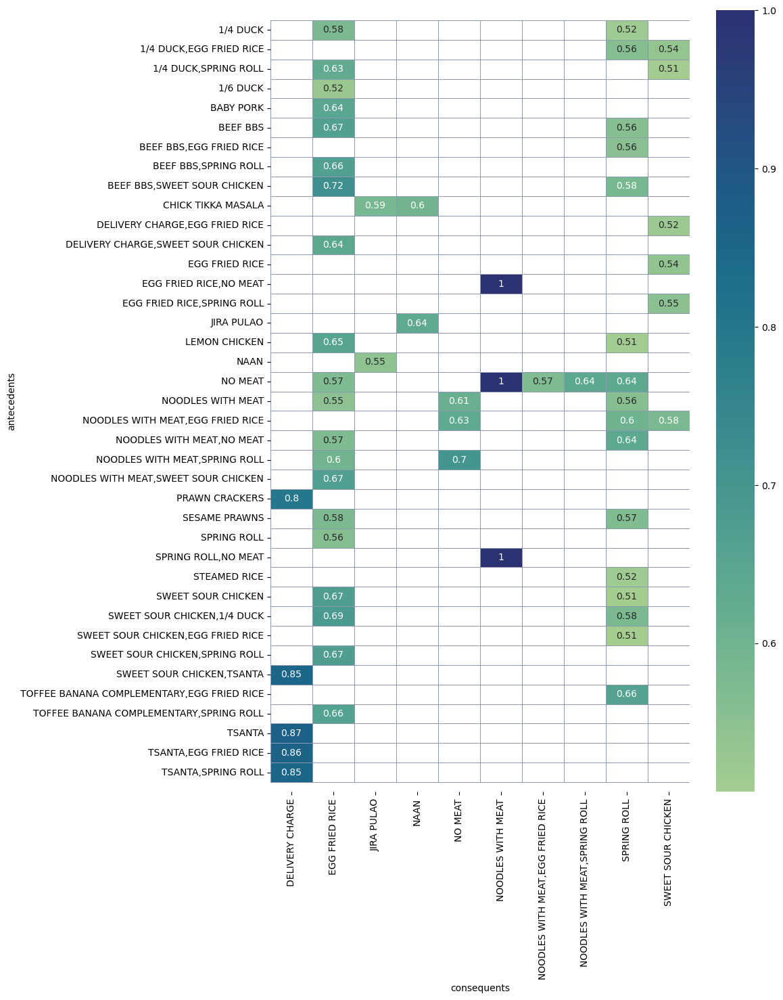

In [119]:
# heatmap to understand the rules

heat_map_rules(rules_confidence, 'confidence')

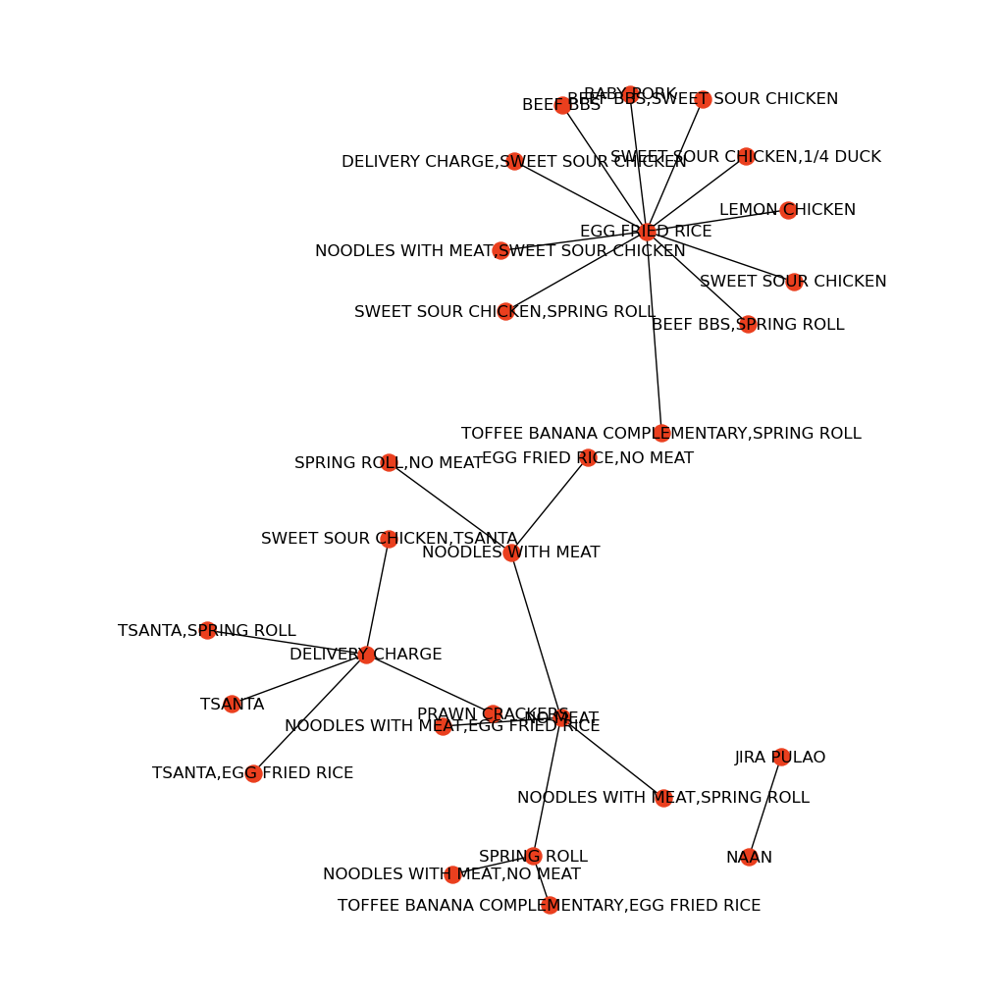

In [120]:
# network with the products to understand the rules

plot_network(rules_confidence, 25)

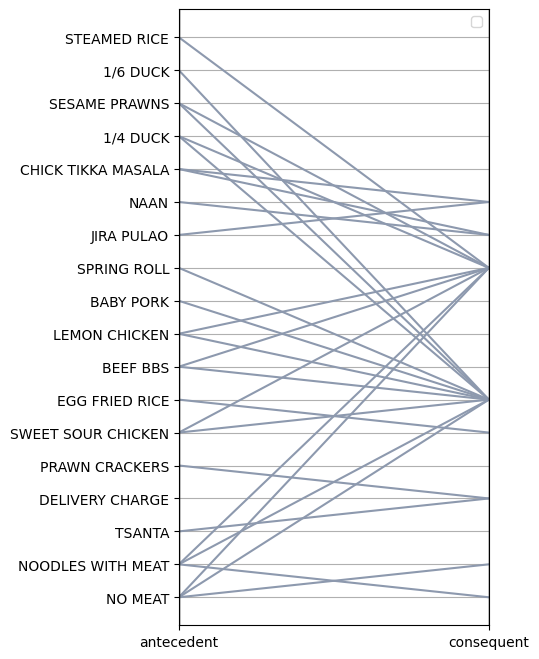

In [121]:
# parallel coordinate plot for the rules with only 1 antecendent and 1 consequent to understand the rules

parallel_coordinates_rules(rules_confidence)

In [122]:
# apply the apriori algorithm to the products
frequent_itemsets_substitute_products = apply_apriori(final.iloc[:, :253].drop(columns = ['DELIVERY CHARGE', 'TSANTA']), 0.05)

# substitute products for delivery
rules_substitute_products = generate_rules(frequent_itemsets_substitute_products, 'lift', 0.0, True)
rules_substitute_products.head(20)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
87,(SWEET SOUR CHICKEN),(TOFFEE BANANA COMPLEMENTARY),0.332985,0.177972,0.062138,0.186610,1.048536,0.002876,1.010620
86,(TOFFEE BANANA COMPLEMENTARY),(SWEET SOUR CHICKEN),0.177972,0.332985,0.062138,0.349147,1.048536,0.002876,1.024831
30,(TOFFEE BANANA COMPLEMENTARY),(EGG FRIED RICE),0.177972,0.415900,0.080638,0.453092,1.089425,0.006619,1.068004
31,(EGG FRIED RICE),(TOFFEE BANANA COMPLEMENTARY),0.415900,0.177972,0.080638,0.193887,1.089425,0.006619,1.019743
129,(STEAMED RICE),(SWEET SOUR CHICKEN),0.130728,0.332985,0.052841,0.404209,1.213894,0.009311,1.119544
128,(SWEET SOUR CHICKEN),(STEAMED RICE),0.332985,0.130728,0.052841,0.158689,1.213894,0.009311,1.033236
74,(1/6 DUCK),(SPRING ROLL),0.146191,0.367517,0.065554,0.448410,1.220106,0.011826,1.146654
75,(SPRING ROLL),(1/6 DUCK),0.367517,0.146191,0.065554,0.178369,1.220106,0.011826,1.039163
33,(SPRING ROLL),(TOFFEE BANANA COMPLEMENTARY),0.367517,0.177972,0.080353,0.218637,1.228493,0.014945,1.052044
32,(TOFFEE BANANA COMPLEMENTARY),(SPRING ROLL),0.177972,0.367517,0.080353,0.451493,1.228493,0.014945,1.153098


<a id = "association-rules-extra"></a>

### 3.5. Association rules using extra information

[Back to Modelling](#modelling-index)

As we introduced the other variables that could complement our analysis, we can now use them to make rules. We will use the binned weather variables (transformed in binary ones) and the variable regarding the holidays. 

**To help**:

- This slice of the dataset contains the products: *final.iloc[:, :253]*
- This slice of the dataset contains the families: *final.iloc[:, -25:]*
- This slice of the dataset contains the others variables, like regarding weather and holidays: *final.iloc[:, 253:-25]*

In [123]:
# apply the apriori algorithm to the products as well as to the aditional variables added

frequent_itemsets_total = apply_apriori(final.iloc[:, :-25].drop(columns = 'IsDelivery'), 0.05)

In [124]:
# generating the rules based on the confidence value

rules_support_total = generate_rules(frequent_itemsets_total, 'support', 0.05, False)
rules_support_total.head(40)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(SWEET SOUR CHICKEN),(EGG FRIED RICE),0.332985,0.415900,0.224362,0.673789,1.620076,0.085873,1.790560
1,(EGG FRIED RICE),(SWEET SOUR CHICKEN),0.415900,0.332985,0.224362,0.539462,1.620076,0.085873,1.448337
2,(SPRING ROLL),(EGG FRIED RICE),0.367517,0.415900,0.205863,0.560145,1.346826,0.053012,1.327937
3,(EGG FRIED RICE),(SPRING ROLL),0.415900,0.367517,0.205863,0.494982,1.346826,0.053012,1.252396
4,(SWEET SOUR CHICKEN),(SPRING ROLL),0.332985,0.367517,0.168864,0.507123,1.379860,0.046487,1.283245
5,(SPRING ROLL),(SWEET SOUR CHICKEN),0.367517,0.332985,0.168864,0.459473,1.379860,0.046487,1.234009
6,(DELIVERY CHARGE),(EGG FRIED RICE),0.368751,0.415900,0.155203,0.420890,1.011999,0.001840,1.008617
7,(EGG FRIED RICE),(DELIVERY CHARGE),0.415900,0.368751,0.155203,0.373175,1.011999,0.001840,1.007059
8,(DELIVERY CHARGE),(TSANTA),0.368751,0.165924,0.143725,0.389761,2.349038,0.082540,1.366802
9,(TSANTA),(DELIVERY CHARGE),0.165924,0.368751,0.143725,0.866209,2.349038,0.082540,4.718185


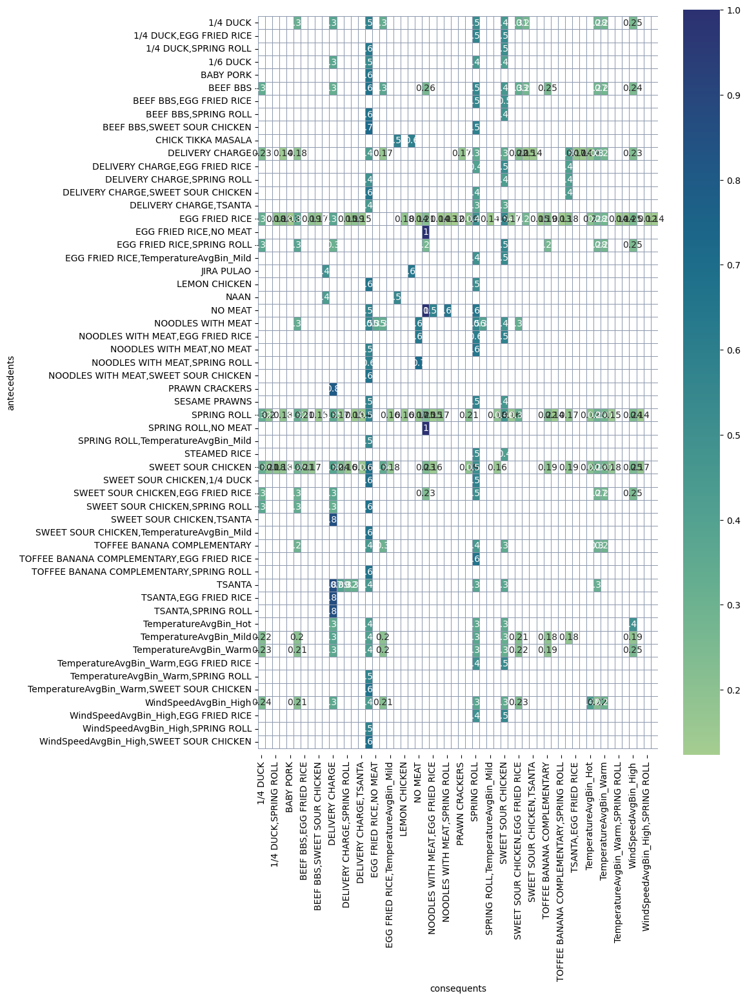

In [125]:
# heatmap to understand the rules

heat_map_rules(rules_support_total, 'confidence')

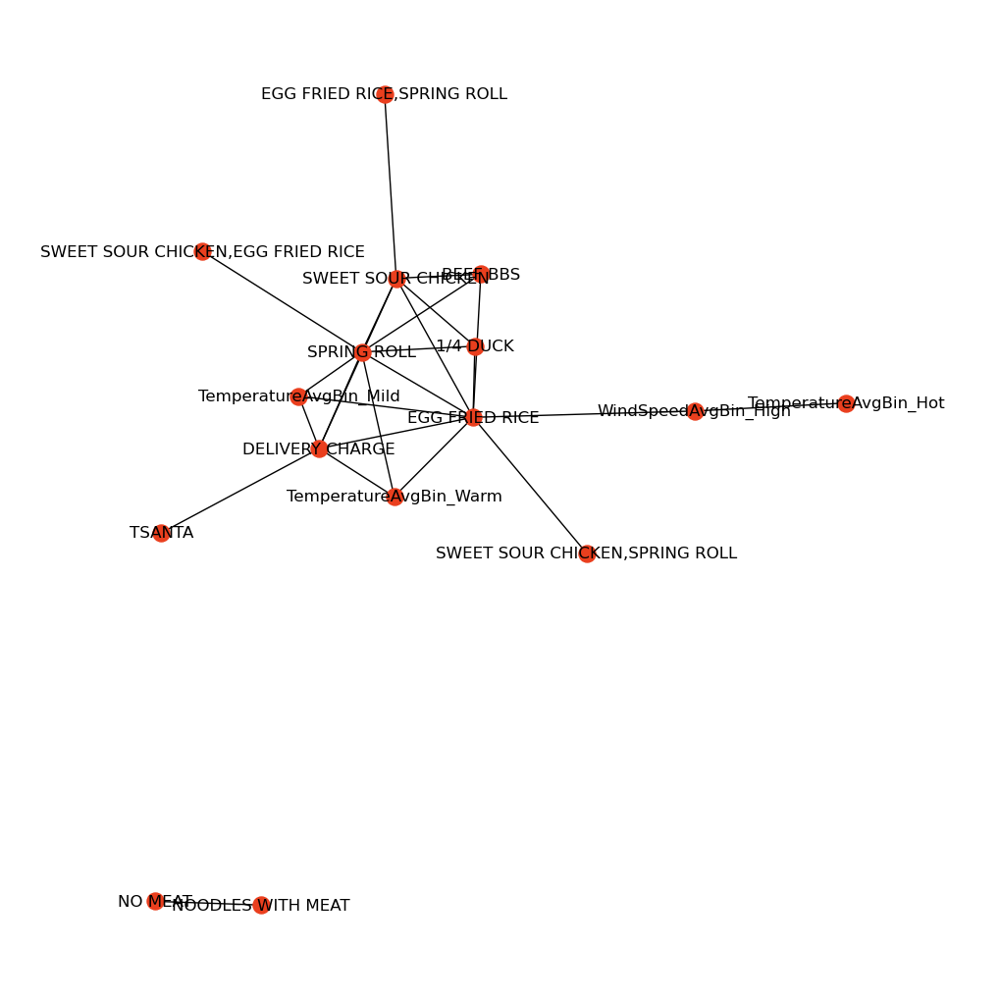

In [126]:
# network with the products to understand the rules

plot_network(rules_support_total, 25)

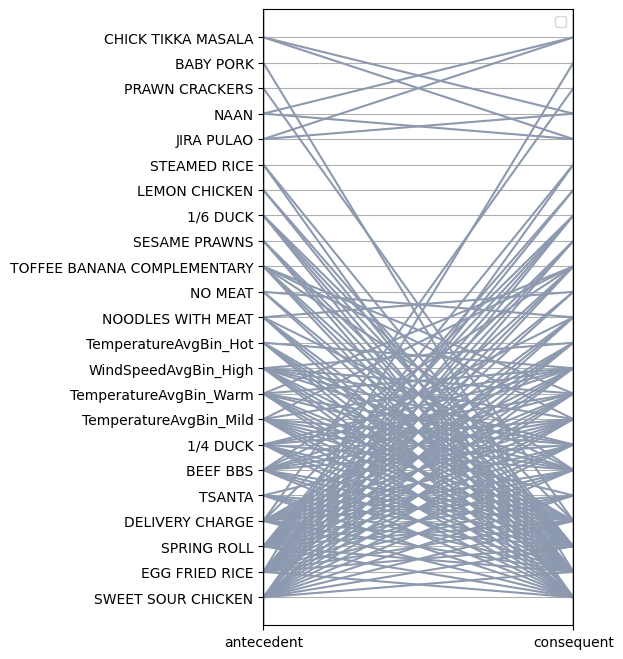

In [127]:
# parallel coordinate plot for the rules with only 1 antecendent and 1 consequent to understand the rules

parallel_coordinates_rules(rules_support_total)

<a id = "association-rules-delivery"></a>

### 3.6. Association rules depending on if the reservation was dine-in or delivery

[Back to Modelling](#modelling-index)

One of the business questions was if there are any differences between dine-in customers and delivery customers. And it is acceptable to think that customers behave differently, because when ordering food for delivery, they may prioritize convenienve, preferring foods that are easier to eat on the go (like sushi rolls) over other types of foods that are more elaborate meals or dishes. Also, the menu offerings is an important factor that can impact the choices of the customers, since restaurants may offer different menu items for delivery than they do for dine-in service. So, it is important to understand these differences.

**For Delivery**: it does not make sense to use to include in the analysis the product 'Delivery Charge', since we are already filtering out this behaviour. 

In [128]:
# apply the apriori algorithm to the products and other information, when the reservation was made for delivery

frequent_itemsets_delivery = apply_apriori(final.iloc[:, :-25][final['IsDelivery'] == 1].drop(columns = ['IsDelivery', 'DELIVERY CHARGE', 'TSANTA']), 0.05)
frequent_itemsets_delivery

,support,itemsets,length
0,0.419577,(EGG FRIED RICE),1
1,0.356202,(SPRING ROLL),1
2,0.341560,(SWEET SOUR CHICKEN),1
3,0.298264,(TemperatureAvgBin_Mild),1
4,0.269818,(TemperatureAvgBin_Warm),1
...,...,...,...
87,0.051663,(VEG RICE),1
88,0.051454,"(BEEF BBS, TemperatureAvgBin_Mild)",2
89,0.050617,"(SWEET SOUR CHICKEN, SESAME PRAWNS)",2
90,0.050408,"(TemperatureAvgBin_Mild, SPRING ROLL, EGG FRIE...",3


In [129]:
# generating the rules based on the confidence value

rules_confidence_delivery = generate_rules(frequent_itemsets_delivery, 'confidence', 0.50, False)
rules_confidence_delivery.head(20)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
16,(NO MEAT),(NOODLES WITH MEAT),0.063585,0.127588,0.063585,1.000000,7.837705,0.055472,inf
13,(EXTRA PANCAKES),(EXTRA SAUCE),0.087011,0.092031,0.065049,0.747596,8.123312,0.057041,3.597287
12,(EXTRA SAUCE),(EXTRA PANCAKES),0.092031,0.087011,0.065049,0.706818,8.123312,0.057041,3.114071
7,"(SWEET SOUR CHICKEN, 1/4 DUCK)",(EGG FRIED RICE),0.107091,0.419577,0.071951,0.671875,1.601313,0.027019,1.768907
23,"(BEEF BBS, SWEET SOUR CHICKEN)",(EGG FRIED RICE),0.075089,0.419577,0.050199,0.668524,1.593326,0.018693,1.751023
21,"(WindSpeedAvgBin_High, SWEET SOUR CHICKEN)",(EGG FRIED RICE),0.079481,0.419577,0.052499,0.660526,1.574265,0.019151,1.709772
0,(SWEET SOUR CHICKEN),(EGG FRIED RICE),0.341560,0.419577,0.219410,0.642376,1.531007,0.076099,1.622996
14,"(SWEET SOUR CHICKEN, TemperatureAvgBin_Mild)",(EGG FRIED RICE),0.101025,0.419577,0.063794,0.631470,1.505014,0.021406,1.574967
4,"(SWEET SOUR CHICKEN, SPRING ROLL)",(EGG FRIED RICE),0.147877,0.419577,0.091822,0.620934,1.479902,0.029776,1.531189
18,"(TemperatureAvgBin_Warm, SWEET SOUR CHICKEN)",(EGG FRIED RICE),0.092658,0.419577,0.057310,0.618510,1.474126,0.018433,1.521463


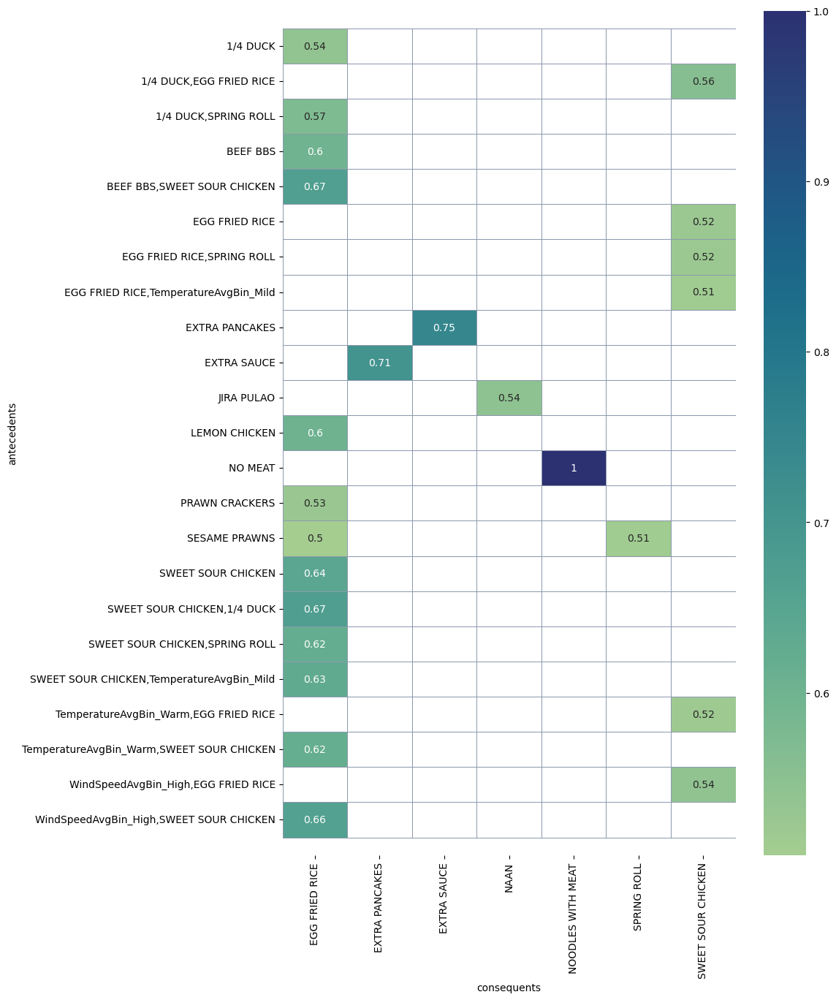

In [130]:
# heatmap to understand the rules

heat_map_rules(rules_confidence_delivery, 'confidence')

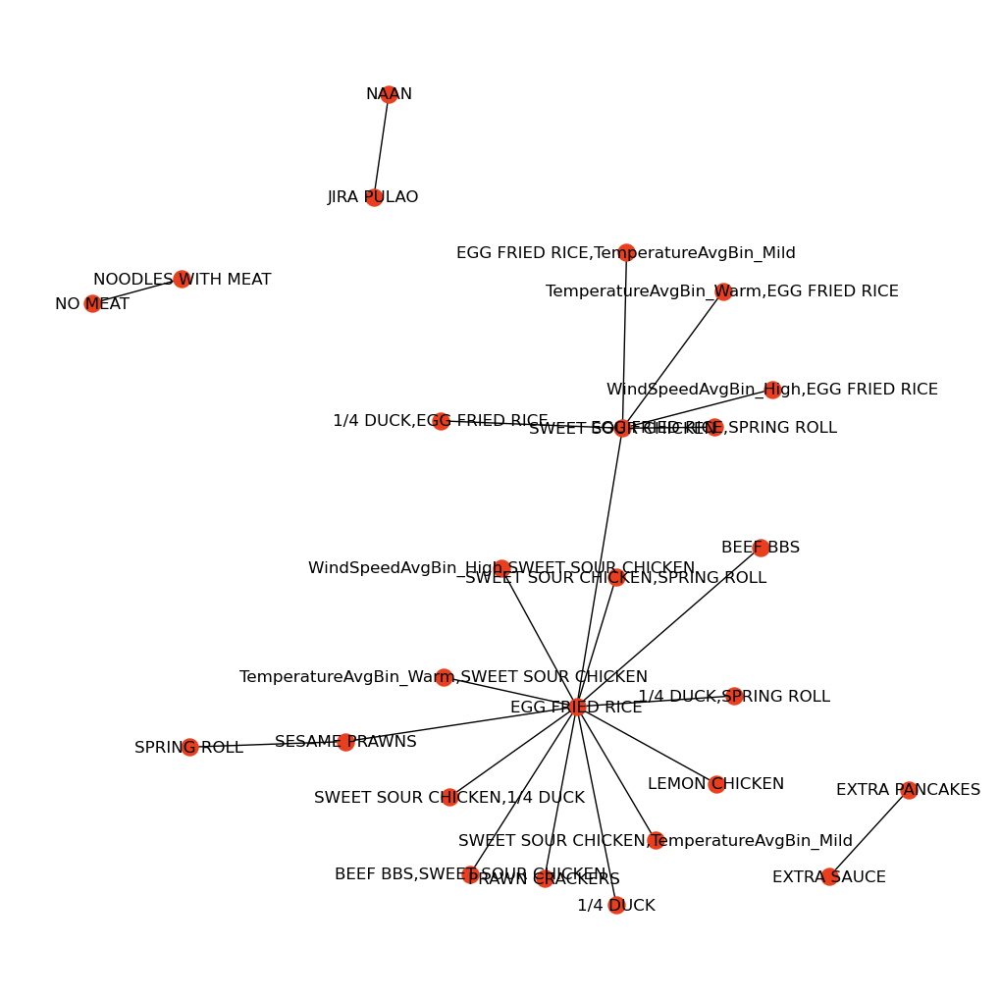

In [131]:
# network with the products to understand the rules

plot_network(rules_confidence_delivery, 25)

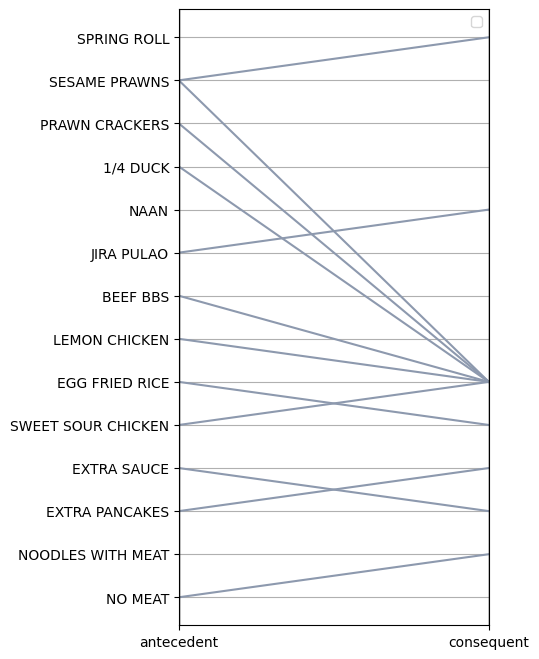

In [132]:
# parallel coordinate plot for the rules with only 1 antecendent and 1 consequent to understand the rules

parallel_coordinates_rules(rules_confidence_delivery)

As one of the business questions is to find substitute products, we also can do it here with the products.

In [133]:
# apply the apriori algorithm to the products when the reservation was made for delivery
frequent_itemsets_substitute_delivery = apply_apriori(final.iloc[:, :254][final['IsDelivery'] == 1].drop(columns = ['IsDelivery', 'DELIVERY CHARGE', 'TSANTA']), 0.05)

# substitute products for delivery
rules_substitute_delivery = generate_rules(frequent_itemsets_substitute_delivery, 'lift', 0.0, True)
rules_substitute_delivery.head(20)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
57,(EGG FRIED RICE),(NOODLES WITH MEAT),0.419577,0.127588,0.058774,0.140080,1.097904,0.005241,1.014526
56,(NOODLES WITH MEAT),(EGG FRIED RICE),0.127588,0.419577,0.058774,0.460656,1.097904,0.005241,1.076163
74,(SWEET SOUR CHICKEN),(SESAME PRAWNS),0.341560,0.131353,0.050617,0.148194,1.128206,0.005752,1.019770
75,(SESAME PRAWNS),(SWEET SOUR CHICKEN),0.131353,0.341560,0.050617,0.385350,1.128206,0.005752,1.071244
37,(EGG FRIED RICE),(1/6 DUCK),0.419577,0.139511,0.067977,0.162014,1.161302,0.009442,1.026854
36,(1/6 DUCK),(EGG FRIED RICE),0.139511,0.419577,0.067977,0.487256,1.161302,0.009442,1.131994
2,(SPRING ROLL),(EGG FRIED RICE),0.356202,0.419577,0.175277,0.492073,1.172782,0.025823,1.142728
3,(EGG FRIED RICE),(SPRING ROLL),0.419577,0.356202,0.175277,0.417747,1.172782,0.025823,1.105702
17,(SPRING ROLL),"(SWEET SOUR CHICKEN, EGG FRIED RICE)",0.356202,0.219410,0.091822,0.257780,1.174879,0.013668,1.051697
16,"(SWEET SOUR CHICKEN, EGG FRIED RICE)",(SPRING ROLL),0.219410,0.356202,0.091822,0.418494,1.174879,0.013668,1.107122


**For dine-in:**

In [134]:
# apply the apriori algorithm to the products and other information, when the reservation was made for dine-in

frequent_itemsets_dine_in = apply_apriori(final.iloc[:, :-25][final['IsDelivery'] == 0].drop(columns = 'IsDelivery'), 0.05)
frequent_itemsets_dine_in

,support,itemsets,length
0,0.412847,(EGG FRIED RICE),1
1,0.376910,(SPRING ROLL),1
2,0.325868,(SWEET SOUR CHICKEN),1
3,0.325694,(TOFFEE BANANA COMPLEMENTARY),1
4,0.283681,(TemperatureAvgBin_Warm),1
...,...,...,...
162,0.050521,(MIXED PLATTER SUSHI),1
163,0.050521,"(TemperatureAvgBin_Warm, SWEET SOUR CHICKEN, S...",3
164,0.050347,"(SWEET SOUR PORK, SPRING ROLL)",2
165,0.050000,"(CHICKEN CASHEW NUTS, EGG FRIED RICE)",2


In [135]:
# generating the rules based on the confidence value

rules_confidence_dine_in = generate_rules(frequent_itemsets_dine_in, 'confidence', 0.50, False)
rules_confidence_dine_in.head(20)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
63,"(SWEET SOUR CHICKEN, NO MEAT)",(NOODLES WITH MEAT),0.065972,0.191319,0.065972,1.000000,5.226860,0.053350,inf
39,"(EGG FRIED RICE, NO MEAT)",(NOODLES WITH MEAT),0.079167,0.191319,0.079167,1.000000,5.226860,0.064021,inf
85,"(TOFFEE BANANA COMPLEMENTARY, NO MEAT)",(NOODLES WITH MEAT),0.057986,0.191319,0.057986,1.000000,5.226860,0.046892,inf
12,(NO MEAT),(NOODLES WITH MEAT),0.128993,0.191319,0.128993,1.000000,5.226860,0.104314,inf
113,"(BEEF BBS, NO MEAT)",(NOODLES WITH MEAT),0.052604,0.191319,0.052604,1.000000,5.226860,0.042540,inf
25,"(SPRING ROLL, NO MEAT)",(NOODLES WITH MEAT),0.088889,0.191319,0.088889,1.000000,5.226860,0.071883,inf
99,"(EGG FRIED RICE, NO MEAT, SPRING ROLL)",(NOODLES WITH MEAT),0.054861,0.191319,0.054861,1.000000,5.226860,0.044365,inf
24,"(NOODLES WITH MEAT, SPRING ROLL)",(NO MEAT),0.117708,0.128993,0.088889,0.755162,5.854286,0.073705,3.557486
116,(1/2 DUCK),(EGG FRIED RICE),0.069444,0.412847,0.052257,0.752500,1.822708,0.023587,2.372334
31,"(BEEF BBS, SWEET SOUR CHICKEN)",(EGG FRIED RICE),0.113021,0.412847,0.084375,0.746544,1.808281,0.037715,2.316585


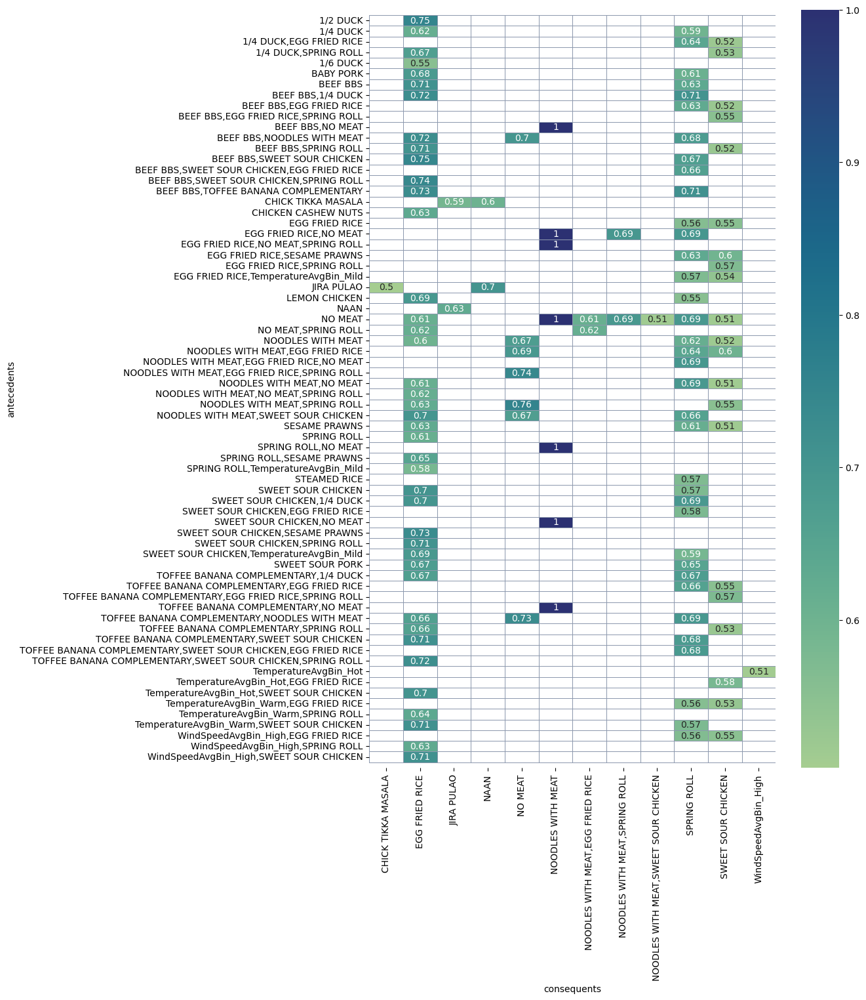

In [136]:
# heatmap to understand the rules

heat_map_rules(rules_confidence_dine_in, 'confidence')

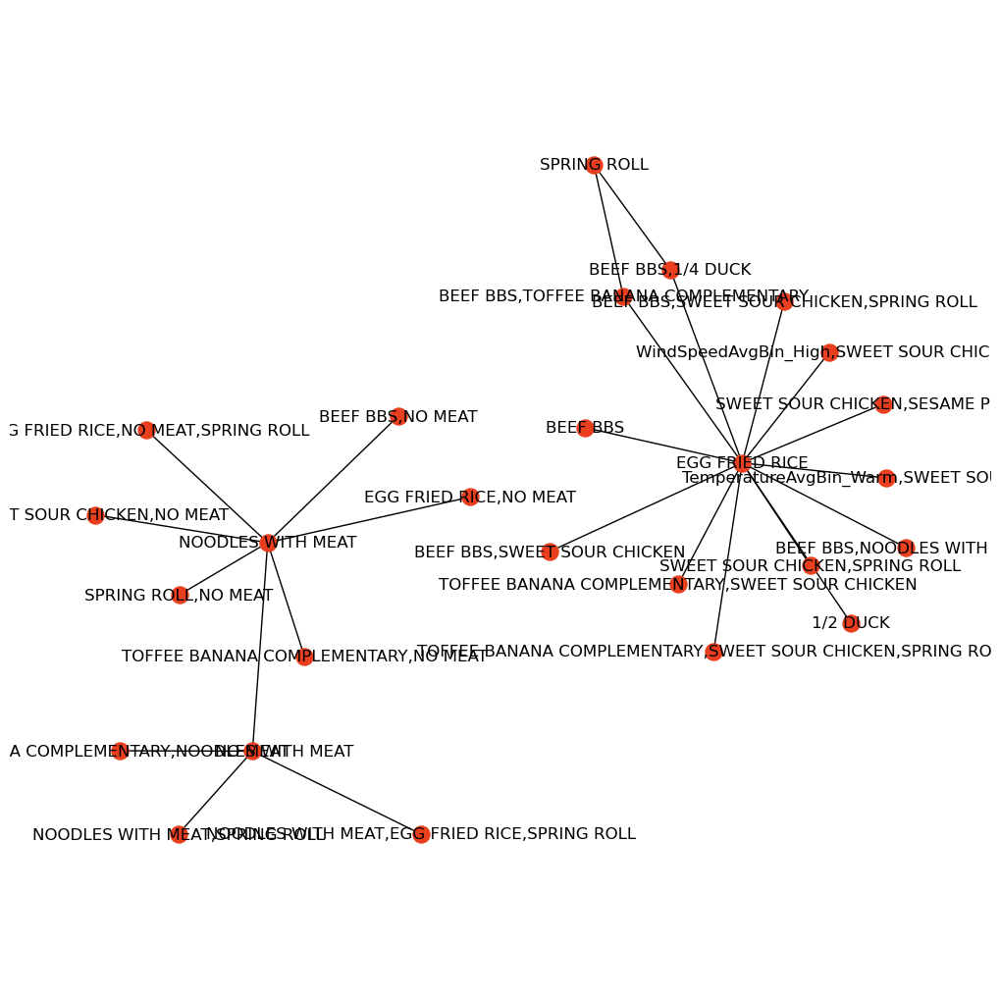

In [137]:
# network with the products to understand the rules

plot_network(rules_confidence_dine_in, 25)

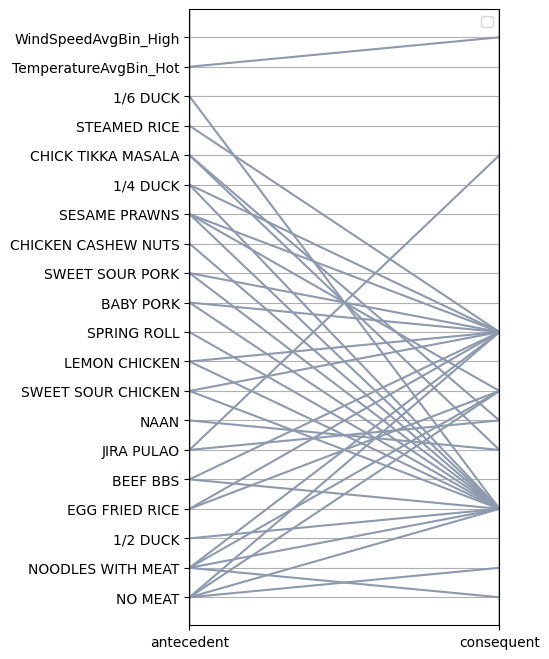

In [138]:
# parallel coordinate plot for the rules with only 1 antecendent and 1 consequent to understand the rules

parallel_coordinates_rules(rules_confidence_dine_in)

In [139]:
# apply the apriori algorithm to the products when the reservation was made for dine-in
frequent_itemsets_substitute_dine_in = apply_apriori(final.iloc[:, :254][final['IsDelivery'] == 0].drop(columns = 'IsDelivery'), 0.05)

# substitute products for delivery
rules_substitute_dine_in = generate_rules(frequent_itemsets_substitute_dine_in, 'lift', 0.0, True)
rules_substitute_dine_in.head(20)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
213,(SWEET SOUR CHICKEN),(COKE ZERO),0.325868,0.165799,0.057118,0.175280,1.057184,0.003090,1.011496
212,(COKE ZERO),(SWEET SOUR CHICKEN),0.165799,0.325868,0.057118,0.344503,1.057184,0.003090,1.028428
125,(EGG FRIED RICE),(COKE ZERO),0.412847,0.165799,0.073090,0.177040,1.067799,0.004641,1.013659
124,(COKE ZERO),(EGG FRIED RICE),0.165799,0.412847,0.073090,0.440838,1.067799,0.004641,1.050058
31,(SWEET SOUR CHICKEN),(TOFFEE BANANA COMPLEMENTARY),0.325868,0.325694,0.113715,0.348961,1.071437,0.007582,1.035738
30,(TOFFEE BANANA COMPLEMENTARY),(SWEET SOUR CHICKEN),0.325694,0.325868,0.113715,0.349147,1.071437,0.007582,1.035767
84,"(SWEET SOUR CHICKEN, EGG FRIED RICE)",(TOFFEE BANANA COMPLEMENTARY),0.228472,0.325694,0.081250,0.355623,1.091892,0.006838,1.046446
85,(TOFFEE BANANA COMPLEMENTARY),"(SWEET SOUR CHICKEN, EGG FRIED RICE)",0.325694,0.228472,0.081250,0.249467,1.091892,0.006838,1.027973
8,(TOFFEE BANANA COMPLEMENTARY),(EGG FRIED RICE),0.325694,0.412847,0.147569,0.453092,1.097480,0.013107,1.073585
9,(EGG FRIED RICE),(TOFFEE BANANA COMPLEMENTARY),0.412847,0.325694,0.147569,0.357443,1.097480,0.013107,1.049410
